# COMP40731 Artificial Cognitive Systems
### Student names: Mahitha Pulivathi, Benjamin Iluobe Momoh
### Student Id: N1207489, N1183287
### Group Id: 11
**Note:** Only if you worked in a group
### Group member id:
**Note:** Only if you worked in a group

### Markdown language support
Check [here](https://www.markdownguide.org/extended-syntax/) to find more details about markdown


### Add a diagram of your architecture


 

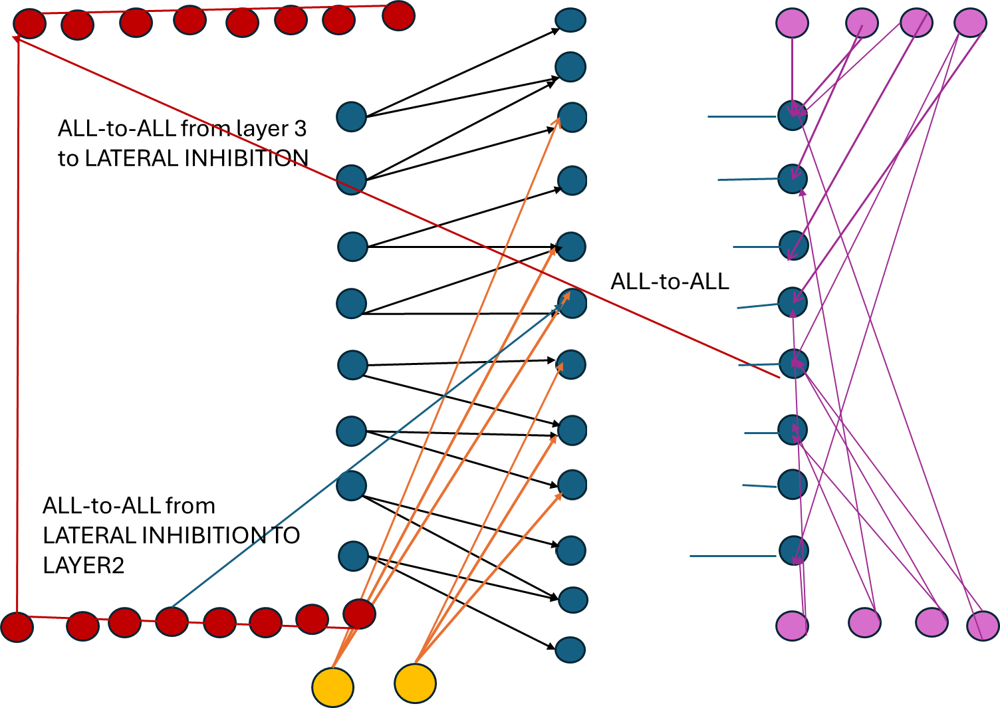

In [5]:
from IPython.display import Image

fig = Image(filename=('/home/ntu-user/Downloads/SNN Architecture.png'))
fig  

# Notes

### JSON for Configuration Flexibility: 
JSON files must be utilised to enable flexible configuration of SNN network parameters, storing crucial details such as layer sizes, learning rates, and hyperparameters.

### HDF5 Storage for Encoded Signal:  
Separate HDF5 files must be implemented to store the encoded signal before and after exposure to noise. The structure, datasets, and relevant metadata must be clearly documented.

### NPY Storage for SNN Weights: 
SNN weights must be stored in an NPY file, including weights for each network layer. Clear explanations and comments within the Jupyter Notebook regarding the organisation and structure of the NPY file are required.

### AI Ethics Integration: 
AI ethics by design principles must be integrated into the SNN implementation. Implement steps to identify and mitigate algorithmic biases. 

### Spiking Records and Multimeters Integration:

    Utilise spiking records and multimeters within the SNN architecture to record spike events and measure action potentials of decoding neurons.
    Use spike recorders, capturing temporal patterns and relevant information during the encoding, decoding, and learning processes.
    Use multimeters to measure the action potentials of decoding neurons, providing valuable insights into the dynamics and responsiveness of the network.
    Integrate visualisations or plots within the Jupyter Notebook to showcase the recorded spiking events and action potentials, aiding in a comprehensive analysis of the SNN's behaviour and performance.
    
### Intercalated Training and Testing with Synaptic Switching:

    Implement an intercalated training approach where supervised learning is used for a specified number of epochs, followed by testing using static synapses for a single epoch.
    During training epochs, utilise supervised learning to enhance the SNN's performance and optimise decoding capabilities.
    Implement a mechanism to switch synapses to a static configuration during testing, allowing for the assessment of the network's generalisation and stability.
    Periodically store the SNN weights before switching to static synapses to preserve the learned information and facilitate analysis.
    Document and discuss the impact of this intercalated training and testing approach on the SNN's performance, emphasising improvements achieved through supervised learning and the network's ability to generalise with static synapses.


## Import section
Import all the libraies that you need

In [1]:
import nest


              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.6.0
 Built: Nov 16 2023 09:28:21

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



In [3]:
#uploading Video

import cv2
 
# File path for the video

video_path = 'video.mp4'
# Open the video capture
cap = cv2.VideoCapture(video_path)

# Check if the video capture is successfully opened

if not cap.isOpened():
    print(f"Error: Unable to open the video at path {video_path}")
else:
    print("Press 'q' to stop the video.")
 
    # Read and display each frame from the video

    while True:
        ret, frame = cap.read()
 
        # Break the loop if the video has ended

        if not ret:
            break

        # Display the frame

        cv2.imshow('Video', frame)
 
        # Break the loop if 'q' is pressed

        if cv2.waitKey(25) & 0xFF == ord('q'):
            break
 
    # Release the video capture object

    cap.release()

    # Close all windows
    cv2.destroyAllWindows()
 


Press 'q' to stop the video.


In [2]:
# uploading video
import cv2

# File path for the video
video_path = 'video.mp4/'

# Open the video capture
cap = cv2.VideoCapture(video_path)
# Check if the video capture is successfully opened
if not cap.isOpened():
    print(f"Error: Unable to open the video at path {video_path}")
else:
    print("Press 'q' to stop the video.")

    # Read and display each frame from the video
    while True:
        ret, frame = cap.read()

        # Break the loop if the video has ended
        if not ret:
            break
        # Display the frame
        cv2.imshow('Video', frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(25) & 0xFF == ord('q'):
            break

    # Release the video capture object
    cap.release()

    # Close all windows
    cv2.destroyAllWindows()

# separating video from audio
from moviepy.editor import VideoFileClip

# Your video path
video_path = 'video.mp4'

# Load the video file
video_clip = VideoFileClip(video_path)

# Extract audio from the video
audio_clip = video_clip.audio

# Save the audio to a file (e.g., in MP3 format)
audio_path = '/home/ntu-user/PycharmProjects/Assesment_1/audio.mp3'
audio_clip.write_audiofile(audio_path)

# video without audio
video_path = 'video.mp4'

# Load the video file
video_clip = VideoFileClip(video_path)

# Extract audio from the video
audio_clip = video_clip.audio

# Save the audio to a file (e.g., in MP3 format)
audio_path = '/home/ntu-user/PycharmProjects/Assesment_1/audio.mp3'
audio_clip.write_audiofile('audio.mp3', codec='mp3')

video_clip.write_videofile('output_video.mp4', codec='libx264', audio_codec='aac')

Error: Unable to open the video at path video.mp4/
MoviePy - Writing audio in /home/ntu-user/PycharmProjects/Assesment_1/audio.mp3


MoviePy - Done.
MoviePy - Writing audio in audio.mp3


MoviePy - Done.
Moviepy - Building video output_video.mp4.
MoviePy - Writing audio in output_videoTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video output_video.mp4



Moviepy - Done !
Moviepy - video ready output_video.mp4


In [6]:
import cv2
import os

# Define the path to the directory containing the frames
frames_dir = "video_frames"
intensities_file = "frame_intensities_rgb_from_folder.txt"

# Ensure the output file directory exists
output_dir = os.path.dirname(intensities_file)
if output_dir and not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Get a sorted list of frame filenames in the directory
frame_filenames = sorted([f for f in os.listdir(frames_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])

# Open the file for writing intensities
with open(intensities_file, 'w') as file:
    for filename in frame_filenames:
        # Construct the full path to the frame image
        frame_path = os.path.join(frames_dir, filename)

        # Read the image
        frame = cv2.imread(frame_path)

        # Check if the image was successfully read
        if frame is None:
            print(f"Error reading frame {filename}.")
            continue

        # Convert frame from BGR to RGB (if your images are already in RGB, you can skip this step)
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Reshape the frame to get a 2D array of RGB intensities
        intensities = rgb_frame.reshape((-1, 3))

        # Save the RGB intensities to the file
        for intensity in intensities:
            file.write(','.join(map(str, intensity)) + '\n')
        file.write('\n')  # Separate frames by an empty line for easier reading

    print(f"All frame intensities in RGB format have been saved to {intensities_file}.")


All frame intensities in RGB format have been saved to frame_intensities_rgb_from_folder.txt.



              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.6.0
 Built: Nov 16 2023 09:28:21

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.

Reading image frame_0000...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3663.08it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3678.69it/
Setting currents for Blue channel: 100%|▉| 59866/60000 [00:15<00:00, 3948.64it/s

Simulating for frame_0000
Simulation completed for frame_0000

Mar 12 20:08:26 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.

Mar 12 20:08:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:08:28 SimulationManager::run [Info]: 
    Simulation finished.


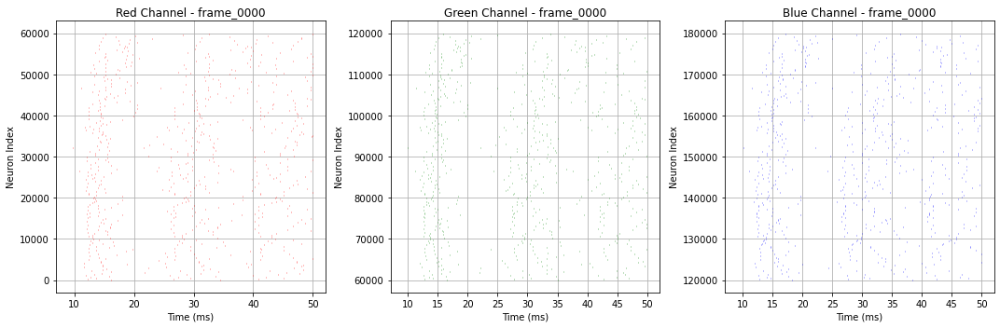

Setting currents for Blue channel: 100%|█| 60000/60000 [00:26<00:00, 2264.12it/s


Reading image frame_0001...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3712.38it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3738.38it/
Setting currents for Blue channel: 100%|▉| 59718/60000 [00:15<00:00, 3890.98it/s

Simulating for frame_0001

Mar 12 20:09:26 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0001

Mar 12 20:09:26 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:09:27 SimulationManager::run [Info]: 
    Simulation finished.


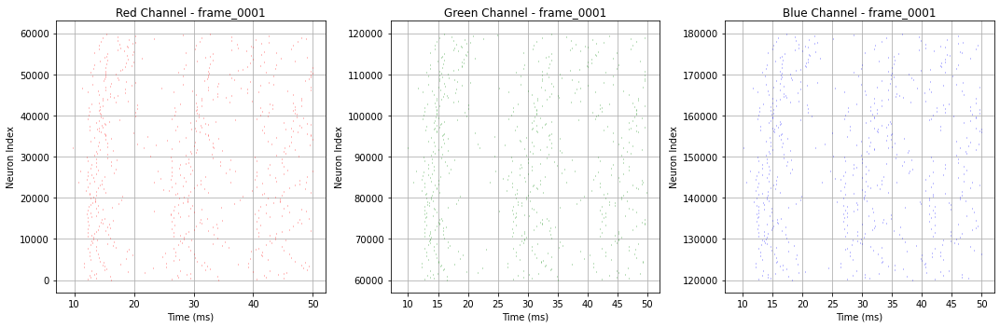

Setting currents for Blue channel: 100%|█| 60000/60000 [00:26<00:00, 2222.67it/s


Reading image frame_0002...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3707.09it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3693.49it/
Setting currents for Blue channel: 100%|▉| 59808/60000 [00:15<00:00, 3648.22it/s

Simulating for frame_0002

Mar 12 20:10:27 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0002

Mar 12 20:10:27 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:10:29 SimulationManager::run [Info]: 
    Simulation finished.


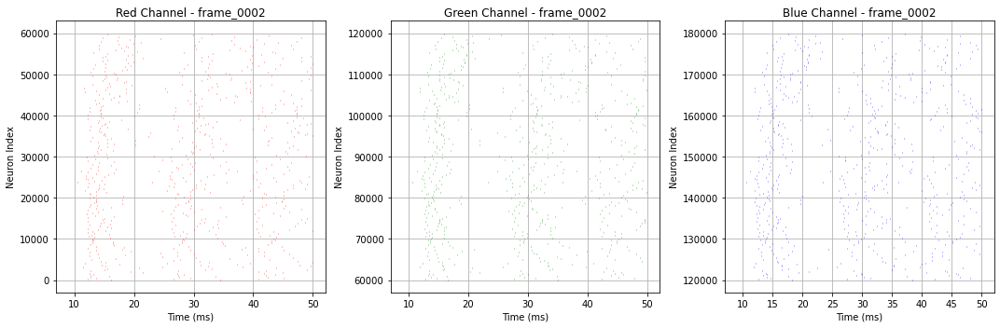

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2168.95it/s


Reading image frame_0003...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3693.71it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3684.49it/
Setting currents for Blue channel: 100%|▉| 59914/60000 [00:15<00:00, 3862.41it/s

Simulating for frame_0003

Mar 12 20:11:28 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0003

Mar 12 20:11:28 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:11:30 SimulationManager::run [Info]: 
    Simulation finished.


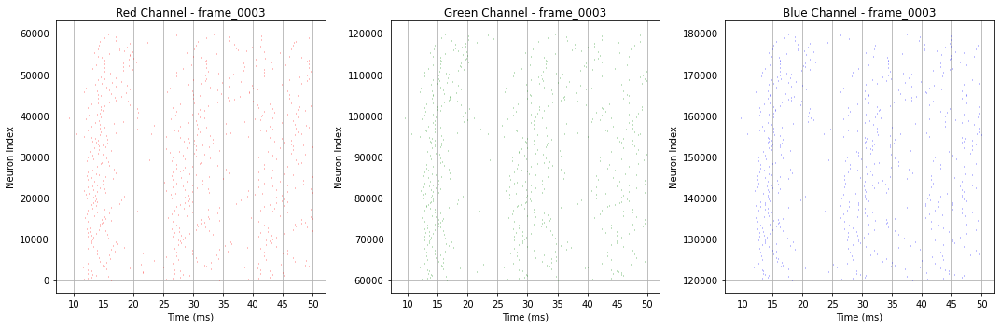

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2169.64it/s


Reading image frame_0004...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3680.69it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3668.96it/
Setting currents for Blue channel: 100%|▉| 59734/60000 [00:15<00:00, 3846.13it/s

Simulating for frame_0004

Mar 12 20:12:30 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0004

Mar 12 20:12:30 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:12:32 SimulationManager::run [Info]: 
    Simulation finished.


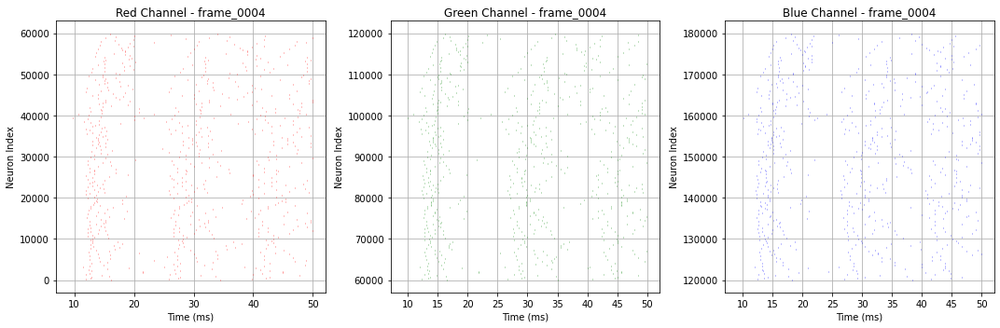

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2185.88it/s


Reading image frame_0005...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3700.11it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3672.60it/
Setting currents for Blue channel:  99%|▉| 59618/60000 [00:15<00:00, 3834.23it/s

Simulating for frame_0005

Mar 12 20:13:31 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0005

Mar 12 20:13:31 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:13:33 SimulationManager::run [Info]: 
    Simulation finished.


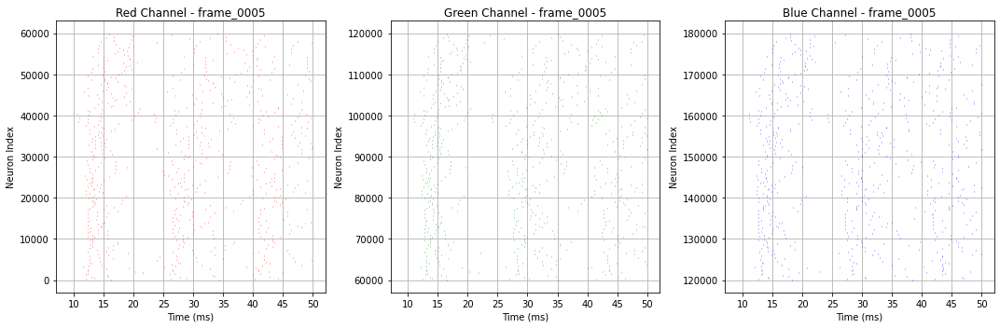

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2167.08it/s


Reading image frame_0006...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3716.80it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3670.51it/
Setting currents for Blue channel:  99%|▉| 59673/60000 [00:15<00:00, 3840.93it/s

Simulating for frame_0006

Mar 12 20:14:32 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0006

Mar 12 20:14:32 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:14:34 SimulationManager::run [Info]: 
    Simulation finished.


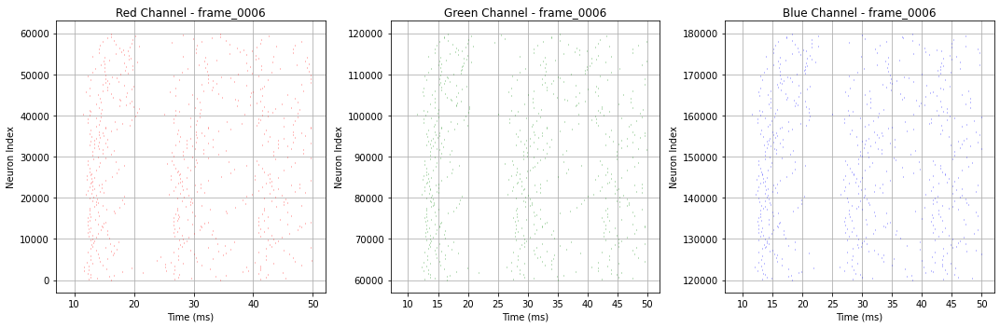

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2143.39it/s


Reading image frame_0007...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3724.68it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3690.60it/
Setting currents for Blue channel:  99%|▉| 59640/60000 [00:15<00:00, 3872.36it/s

Simulating for frame_0007
Simulation completed for frame_0007

Mar 12 20:15:34 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.

Mar 12 20:15:34 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:15:36 SimulationManager::run [Info]: 
    Simulation finished.


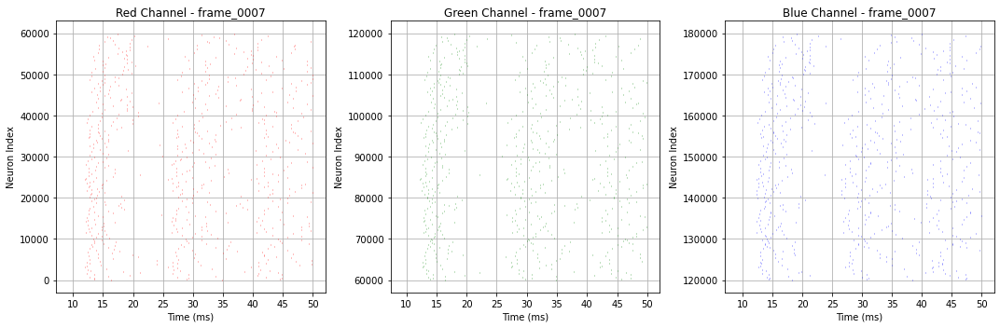

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2155.48it/s


Reading image frame_0008...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3716.78it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3700.13it/
Setting currents for Blue channel: 100%|▉| 59714/60000 [00:15<00:00, 3737.28it/s

Simulating for frame_0008

Mar 12 20:16:36 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0008

Mar 12 20:16:36 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:16:38 SimulationManager::run [Info]: 
    Simulation finished.


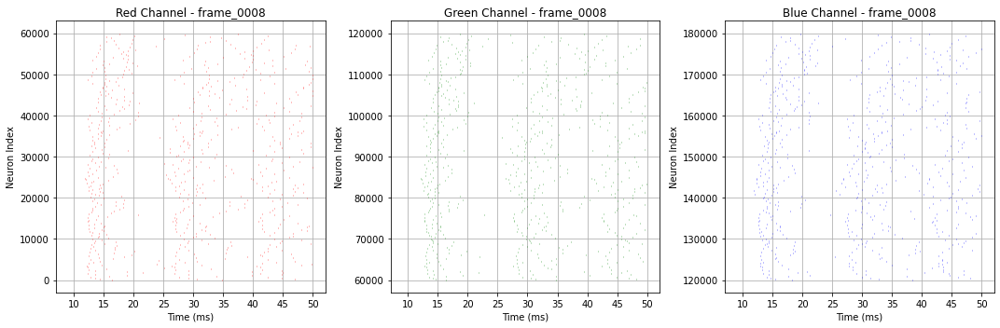

Setting currents for Blue channel: 100%|█| 60000/60000 [00:28<00:00, 2123.70it/s


Reading image frame_0009...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3740.82it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3738.90it/
Setting currents for Blue channel: 100%|▉| 59819/60000 [00:15<00:00, 3747.36it/s

Simulating for frame_0009

Mar 12 20:17:37 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.

Mar 12 20:17:37 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:17:39 SimulationManager::run [Info]: 
    Simulation finished.
Simulation completed for frame_0009


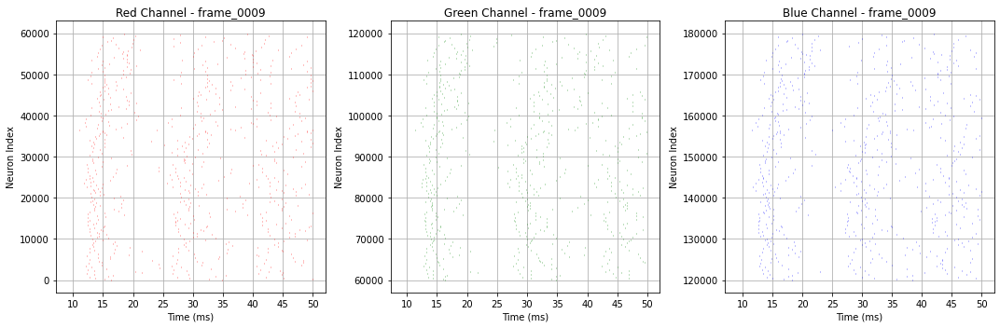

Setting currents for Blue channel: 100%|█| 60000/60000 [00:27<00:00, 2170.48it/s


Reading image frame_0010...
Image dimensions: Height: 200, Width: 300


Setting currents for Red channel: 100%|█| 60000/60000 [00:16<00:00, 3713.03it/s]
Setting currents for Green channel: 100%|█| 60000/60000 [00:16<00:00, 3700.63it/
Setting currents for Blue channel: 100%|▉| 59776/60000 [00:15<00:00, 3828.33it/s

Simulating for frame_0010

Mar 12 20:18:39 NodeManager::prepare_nodes [Info]: 
    Preparing 180003 nodes for simulation.
Simulation completed for frame_0010

Mar 12 20:18:39 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 180003
    Simulation time (ms): 50
    Number of OpenMP threads: 1
    Number of MPI processes: 1

Mar 12 20:18:41 SimulationManager::run [Info]: 
    Simulation finished.


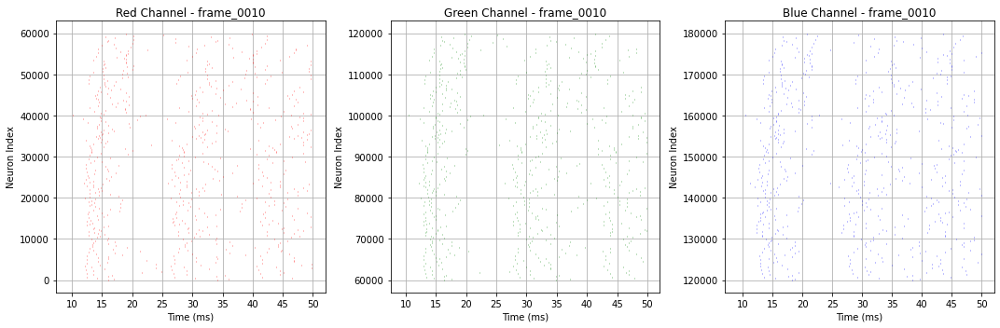

Setting currents for Blue channel: 100%|█| 60000/60000 [00:28<00:00, 2125.66it/s


In [6]:
#getting the rasterplot for frames 1-10 of video frames

import cv2
import matplotlib.pyplot as plt
import nest
import numpy as np
import os
import h5py
from tqdm import tqdm
 
images_folder = 'video_frames'  # The directory where your images are stored
image_extension = '.jpg'  # The extension of your image files
 
# Specify the starting and ending frames

start_frame = 0
end_frame = 10
 
# Generate the image_files list based on the specified range

image_files = ['frame_{:04d}'.format(i) for i in range(start_frame, end_frame + 1)]
results_dir = "results_h5/"
results_dir1 ="results_npy/"
results_dir2 = "results_png/"
 
# Function to convert pixel intensity to current for each color channel

def pixel_intensity_to_current(intensity, offset=380):
    return intensity + offset
 
 
# Function to resize image

def resize_image(image, target_size=(300, 200)):
    if target_size is None:
        return image
    else:
        return cv2.resize(image, target_size)
 
 
# Function to simulate raster plot for each image
def simulate_raster_plot(image_file, current_funcs, sim_time=50.0):

    # Clear console
    os.system('clear')

    # Read the image

    print("Reading image {}...".format(image_file))
    image = cv2.imread(os.path.join(images_folder, image_file + image_extension))

    # Resize the image
    image = resize_image(image)

    # Get image dimensions
    height, width, _ = image.shape
    print("Image dimensions: Height: {}, Width: {}".format(height, width))

    # Initialize NEST kernel

    nest.ResetKernel()

    # Create layers for Red, Green, and Blue channels

    layers = []
    spikerecorders = []
    for i, color in enumerate(['Red', 'Green', 'Blue']):

        # Create layer with iaf_psc_alpha neurons

        layer = nest.Create('iaf_psc_alpha', width * height)
        layers.append(layer)

        # Progress bar for setting currents

        progress_bar = tqdm(total=height * width, desc="Setting currents for {} channel".format(color), position=0,
                            leave=True)

        # Create spike generators for each neuron and inject analog values

        for row in range(height):
            for col in range(width):

                # Calculate the current based on pixel intensity for the corresponding color channel

                intensity = image[row, col, i]
                current = current_funcs[i](intensity)

                # Set current for each neuron

                neuron_index = row * width + col
                nest.SetStatus(layer[neuron_index], {"I_e": current})

                # Update progress bar

                progress_bar.update(1)
 
        # Connect each layer to a spike recorder

        spikerecorder = nest.Create("spike_recorder")
        nest.Connect(layer, spikerecorder)
        spikerecorders.append(spikerecorder)
        events = spikerecorders[i].get("events")
        senders = events["senders"]
        times = events["times"]
        np.save(os.path.join(results_dir1, image_file + "_senders.npy"), senders)
        np.save(os.path.join(results_dir1, image_file + "_times.npy"), times)
 
    # Simulate

    print("Simulating for", image_file)
    nest.Simulate(sim_time)
    print("Simulation completed for", image_file)

    # Save spike events and senders in HDF5 format

    os.makedirs(results_dir, exist_ok=True)
    with h5py.File(os.path.join(results_dir, image_file + "_spikes.h5"), "w") as file:
        for i, color in enumerate(['Red', 'Green', 'Blue']):
            events = spikerecorders[i].get("events")
            senders = events["senders"]
            times = events["times"]
            grp = file.create_group(color)
            grp.create_dataset("senders", data=senders)
            grp.create_dataset("times", data=times)
            grp.attrs["image_filename"] = image_file
            grp.attrs["image_dimensions"] = (height, width)
            grp.attrs["simulation_time"] = sim_time

    # Plot raster plot for each color channel

    plt.figure(figsize=(15, 5))
    for i, color in enumerate(['Red', 'Green', 'Blue']):
        plt.subplot(1, 3, i + 1)
        plt.title('{} Channel - {}'.format(color, image_file))
        plt.xlabel('Time (ms)')
        plt.ylabel('Neuron Index')
        plt.grid()
        spiketimes = spikerecorders[i].get("events")["times"]
        senders = spikerecorders[i].get("events")["senders"]
        plt.vlines(spiketimes, senders, senders + 1, color=color.lower(), linewidths=0.5)
    plt.tight_layout()
    plt.savefig(os.path.join(results_dir2, image_file + "_raster_plot.png"))
    plt.show()
 
 
# Simulate raster plot for each image

for image_file in image_files:

    simulate_raster_plot(image_file, [pixel_intensity_to_current] * 3)


Reading image frame_0000...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3695.79it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3674.03it/
Setting currents for Red channel:  99%|▉| 34564/34800 [00:09<00:00, 3727.09it/s]

Simulating for frame_0000
Simulation completed for frame_0000


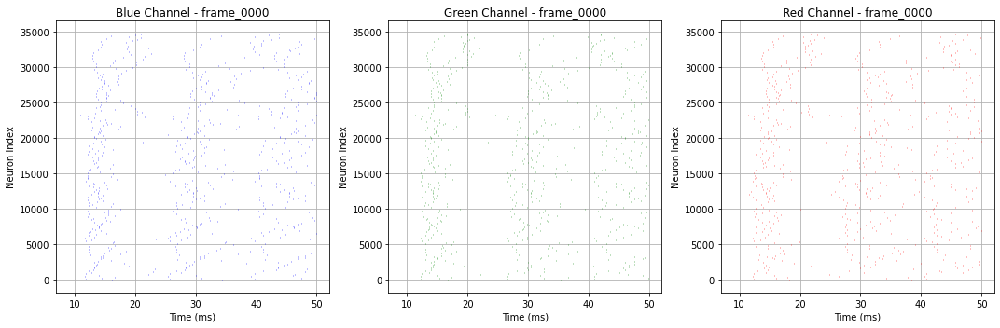

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2054.08it/s]


Reading image frame_0001...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3657.29it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3640.22it/
Setting currents for Red channel:  99%|▉| 34436/34800 [00:09<00:00, 3845.54it/s]

Simulating for frame_0001
Simulation completed for frame_0001


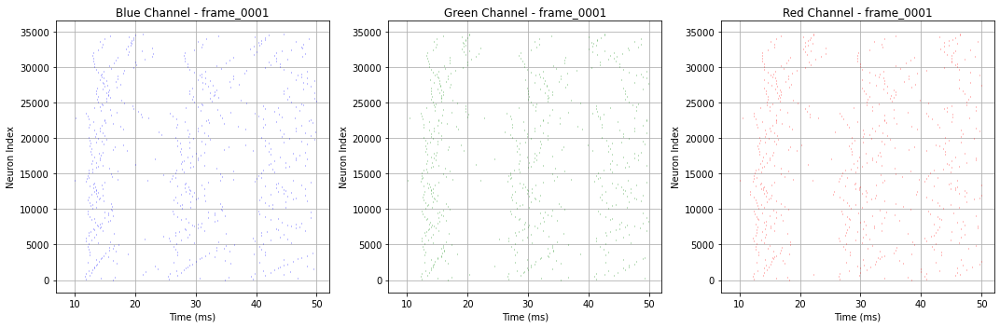

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2126.07it/s]


Reading image frame_0002...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3660.57it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3673.92it/
Setting currents for Red channel: 100%|▉| 34725/34800 [00:09<00:00, 3850.35it/s]

Simulating for frame_0002
Simulation completed for frame_0002


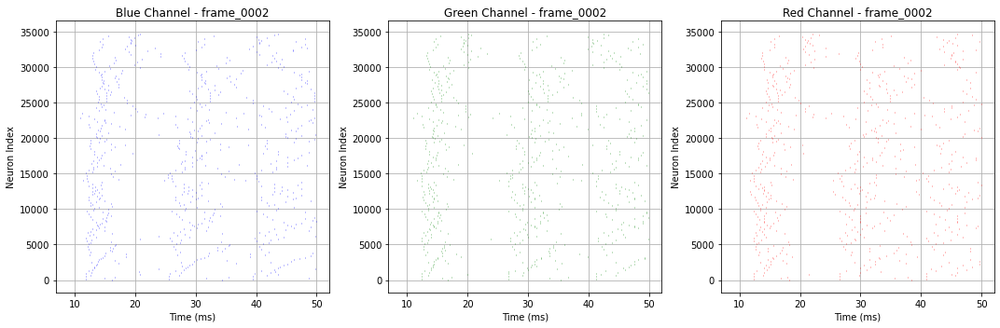

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2130.87it/s]


Reading image frame_0003...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3694.41it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3668.76it/
Setting currents for Red channel: 100%|▉| 34677/34800 [00:09<00:00, 3802.98it/s]

Simulating for frame_0003
Simulation completed for frame_0003


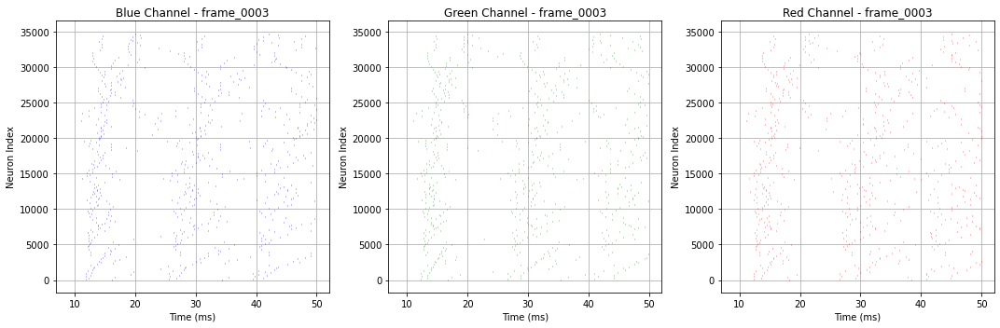

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2127.05it/s]


Reading image frame_0004...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3632.72it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3704.62it/
Setting currents for Red channel:  99%|▉| 34509/34800 [00:09<00:00, 3829.70it/s]

Simulating for frame_0004
Simulation completed for frame_0004


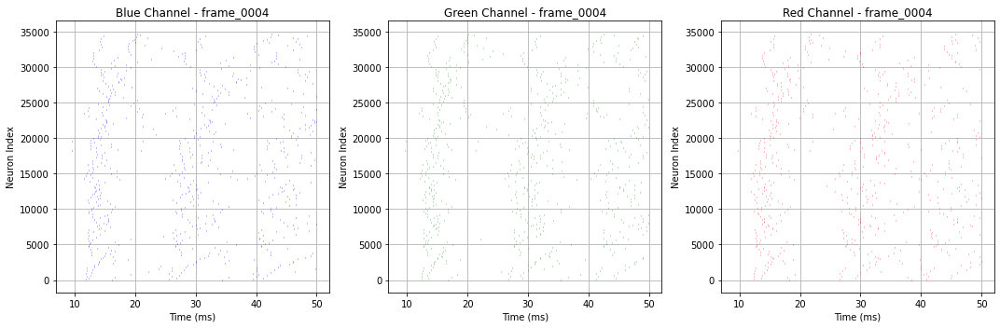

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2137.76it/s]


Reading image frame_0005...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3679.90it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3696.98it/
Setting currents for Red channel:  99%|▉| 34597/34800 [00:08<00:00, 3866.10it/s]

Simulating for frame_0005
Simulation completed for frame_0005


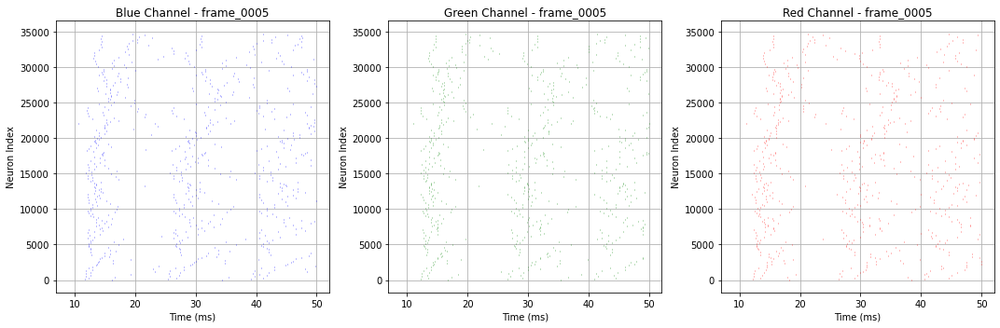

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2165.07it/s]


Reading image frame_0006...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3715.06it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3635.66it/
Setting currents for Red channel: 100%|▉| 34674/34800 [00:09<00:00, 3844.00it/s]

Simulating for frame_0006
Simulation completed for frame_0006


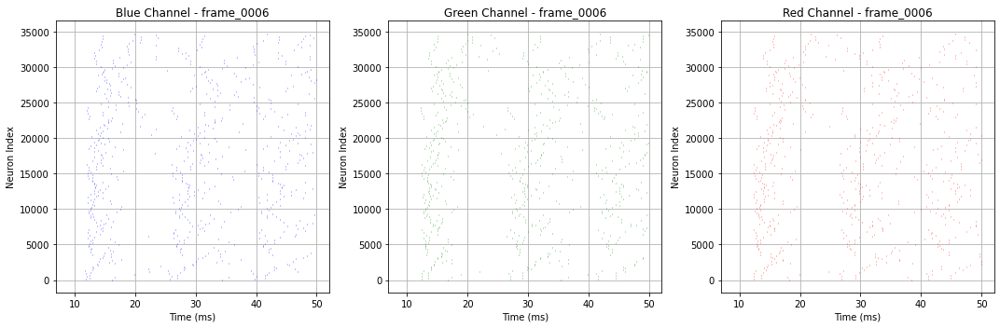

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2150.44it/s]


Reading image frame_0007...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3707.28it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3729.53it/
Setting currents for Red channel:  99%|▉| 34567/34800 [00:09<00:00, 3830.67it/s]

Simulating for frame_0007
Simulation completed for frame_0007


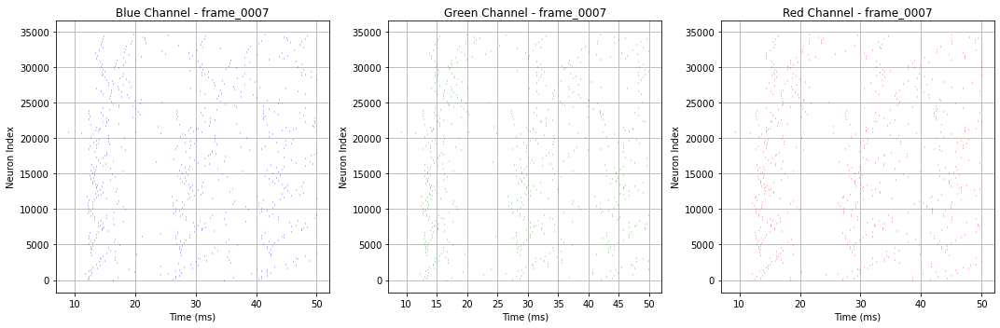

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2156.04it/s]


Reading image frame_0008...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3745.27it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3759.65it/
Setting currents for Red channel:  99%|▉| 34584/34800 [00:09<00:00, 3825.44it/s]

Simulating for frame_0008
Simulation completed for frame_0008


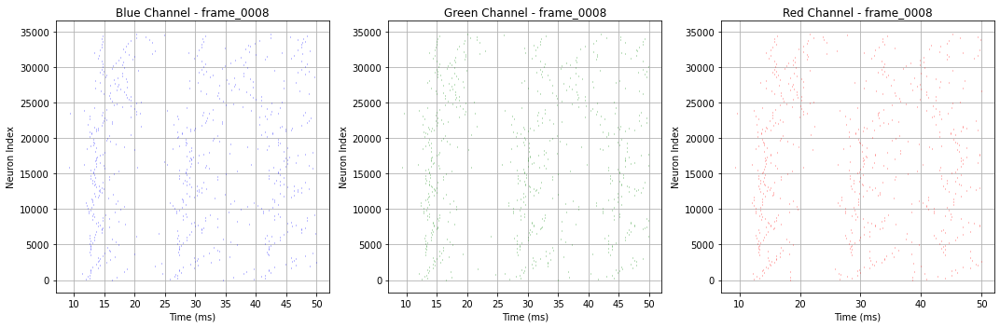

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2154.82it/s]


Reading image frame_0009...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3729.14it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3643.10it/
Setting currents for Red channel:  99%|▉| 34530/34800 [00:08<00:00, 3859.23it/s]

Simulating for frame_0009
Simulation completed for frame_0009


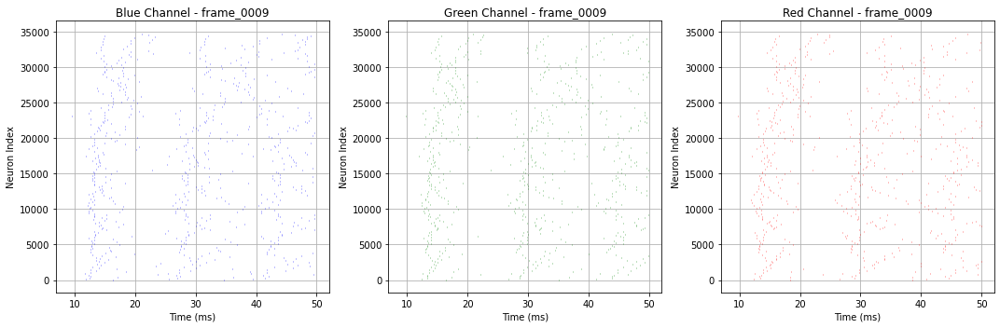

Setting currents for Red channel: 100%|█| 34800/34800 [00:15<00:00, 2191.62it/s]


Reading image frame_0010...
Image dimensions: Height: 174, Width: 200


Setting currents for Blue channel: 100%|█| 34800/34800 [00:09<00:00, 3737.22it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:09<00:00, 3632.18it/
Setting currents for Red channel:  99%|▉| 34578/34800 [00:09<00:00, 3848.91it/s]

Simulating for frame_0010
Simulation completed for frame_0010


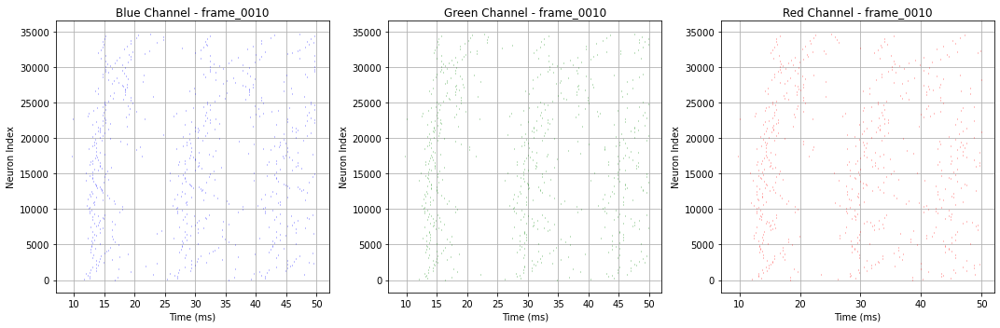

Setting currents for Red channel: 100%|█| 34800/34800 [00:16<00:00, 2141.12it/s]


In [7]:
#neuronIndex1, saving spikes senders and times for each layer (BGR)

import cv2
import matplotlib.pyplot as plt
import nest
import numpy as np
import os
import h5py
from tqdm import tqdm
 
results_dir = "encodedFiles/"
images_folder = 'video_frames/'
image_extension = '.jpg'
 
# Function to convert pixel intensity to current for each color channel

def pixel_intensity_to_current(intensity, offset=380):
    return intensity + offset
 
# Function to resize image

def resize_image(image, target_size=(200, 174)):
    if target_size is None:
        return image
    else:
        return cv2.resize(image, target_size)
 
# Function to simulate raster plot for each image

def simulate_raster_plot(image_file, current_funcs, sim_time=50.0):

    # Clear console
    os.system('clear') 
    # Read the image

    print("Reading image {}...".format(image_file))
    image = cv2.imread(os.path.join(images_folder, image_file + image_extension))

    # Resize the image

    resized_image = resize_image(image)
    # Get image dimensions

    height, width, _ = resized_image.shape
    print("Image dimensions: Height: {}, Width: {}".format(height, width))
 
    # Initialize NEST kernel

    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})
 
    # Create layers for Blue, Green, and Red channels

    layers = []
    spikerecorders = []

    for i, color in enumerate(['Blue', 'Green', 'Red']):

        # Create layer with iaf_psc_alpha neurons

        layers.append(nest.Create('iaf_psc_alpha', width * height))

        # Connect each layer to a spike recorder

        spikerecorders.append(nest.Create("spike_recorder"))
 
        # Progress bar for setting currents

        progress_bar = tqdm(total=height * width, desc="Setting currents for {} channel".format(color), position=0,
                            leave=True)
 
        # Create spike generators for each neuron and inject analog values

        for row in range(height):
            for col in range(width):

                # Calculate the current based on pixel intensity for the corresponding color channel

                intensity = resized_image[row, col, i]
                current = current_funcs[i](intensity)
 
                # Set current for each neuron

                neuron_index = row * width + col
                nest.SetStatus(layers[i][neuron_index], {"I_e": current})
 
                # Update progress bar

                progress_bar.update(1)
        nest.Connect(layers[i], spikerecorders[i])
 
    # Simulate
    print("Simulating for", image_file)
    nest.Simulate(sim_time)
    print("Simulation completed for", image_file)
 
    # Save spike events and senders in HDF5 format

    os.makedirs(results_dir, exist_ok=True)
    with h5py.File(os.path.join(results_dir, image_file + "_spikes.h5"), "w") as file:
        for i, color in enumerate(['Blue', 'Green', 'Red']):
            events = spikerecorders[i].get("events")
            senders = events["senders"]
            times = events["times"]
            grp = file.create_group(color)
            grp.create_dataset("senders", data=senders)
            grp.create_dataset("times", data=times)
            grp.attrs["image_filename"] = image_file
            grp.attrs["image_dimensions"] = (height, width)
            grp.attrs["simulation_time"] = sim_time
 
            # Save times array to NumPy file

            np.save(os.path.join(results_dir, image_file + "_"+ color + "_times.npy"), times)
 
    # Plot raster plot for each color channel

    plt.figure(figsize=(15, 5))
    for i, color in enumerate(['Blue', 'Green', 'Red']):
        plt.subplot(1, 3, i + 1)
        plt.title('{} Channel - {}'.format(color, image_file))
        plt.xlabel('Time (ms)')
        plt.ylabel('Neuron Index')
        plt.grid()
        ts = spikerecorders[i].get("events")["times"]
        if i == 0:
            senders = spikerecorders[i].get("events")["senders"] - 1  # normalize values between 0 and 300*200-1
        elif i == 1:
            senders = spikerecorders[i].get("events")["senders"] - 200 * 174 - 2  # normalize values between 0 and 300*200-1
        else:
            senders = spikerecorders[i].get("events")["senders"] - 200 * 174 * 2 - 3  # normalize values between 0 and 300*200-1

        np.save(os.path.join(results_dir, image_file + "_"+ color + "_senders.npy"), senders)
        plt.vlines(ts, senders, senders + 1, color=color.lower(), linewidths=0.5)

    plt.tight_layout()
    plt.show()
 
 
# Specify the start and stop indices for the image range

start_index = 0
stop_index = 10
 
# List of image file names within the specified range

image_files = ['frame_{:04d}'.format(i) for i in range(start_index, stop_index + 1)]
 
# Simulate raster plot for each image within the specified range

for image_file in image_files:
    simulate_raster_plot(image_file, [pixel_intensity_to_current] * 3)


In [8]:
#TemporalEncoding
import numpy as np
import nest
 
 
def pixel_intensity_to_current(intensity, offset=380):
    return intensity + offset
 
def create_normalised_2D_matrix(times, senders, cols):
    rows=np.max(senders)+1
    normalised_2Dmat = np.zeros((rows, cols))
    for i in range(len(times)):
        normalised_2Dmat[int(senders[i]), int(np.round(times[i], 0))] = 1.0
    normalised_2Dmat.dump(f"results/normalised_2Dmat.npy")
    return normalised_2Dmat.astype(bool)
 
def find_spike_pattern(pattern, normalised_2Dmat):
    """
    Find the index of the spike pattern in the normalized 2D matrix.
 
    Parameters:
        pattern (numpy.ndarray): Spike pattern to search for.
        normalised_2Dmat (numpy.ndarray): Normalized 2D matrix of spike events.
 
    Returns:
        int: Index of the spike pattern if found, -1 otherwise.
    """
    for idx in range(normalised_2Dmat.shape[0]):
        if np.array_equal(normalised_2Dmat[idx], pattern):
            return idx
    return -1
 
 
# Function to generate random spike patterns
def generate_random_pattern(length):
    random_array = np.random.randint(2, size=length)
    return random_array
 
 
# Reset NEST kernel
nest.ResetKernel()
 
# Define the number of neurons
num_neurons = 256
offset = 380
 
# Create layer with iaf_psc_alpha neurons
layer = nest.Create('iaf_psc_alpha', num_neurons)
 
spikerecorder = nest.Create("spike_recorder")
 
# Define the analog values from 0 to 255
min_analog_value = 0+offset
max_analog_value = 255+offset
 
# Create spike generators for each neuron and inject analog values
ind=0
for value in range(min_analog_value, max_analog_value):
    # Set current for each neuron
    nest.SetStatus(layer[ind], {"I_e": value})
    ind+=1
nest.Connect(layer, spikerecorder)
# Simulate
nest.Simulate(50.0)
 
# Get spike times
events = spikerecorder.get("events")
senders = events["senders"]
ts = events["times"]
 
normalised_2Dmat=create_normalised_2D_matrix(ts,senders,51)
 
 
# Function to generate random spike patterns
def generate_random_pattern(length):
    return np.random.randint(2, size=length)
 
 
#test a known patterns
for i in range(50):
# Find the index of the pattern in the normalized 2D matrix
    idx = np.random.randint(256)
    pattern_index = find_spike_pattern(normalised_2Dmat[idx,:], normalised_2Dmat)
    # Print the result
    if pattern_index != -1:
        print(f"The analogue value for pattern {normalised_2Dmat[idx,:]} is {pattern_index}.")
    else:
        print(f"Pattern {i + 1}: Not found")
 
    # Generate a random spike pattern
    pattern_to_find = generate_random_pattern(51).astype(bool)
    print(pattern_to_find)
 
    # Find the index of the pattern in the normalized 2D matrix
    pattern_index = find_spike_pattern(pattern_to_find, normalised_2Dmat)
    # Print the result
    if pattern_index != -1:
        print(f"The analogue value for pattern {pattern_to_find} is {pattern_index}.")
    else:
        print(f"Pattern {i + 1}b: Not found")

The analogue value for pattern [False False False False False False False False False False False False
  True False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False False False  True False False False False False False False
 False False False] is 156.
[ True  True False False  True False  True False False  True  True False
 False  True  True False  True False  True  True False  True  True  True
  True False  True False False  True  True  True  True  True  True False
 False  True False  True False False  True  True  True  True False  True
 False False  True]
Pattern 1b: Not found
The analogue value for pattern [False False False False False False False False False False False False
 False False False False  True False False False False False False False
 False False False False False False False False False False False  True
 False False False False False False False False False False Fals

Propagation delay between L1 and L2: 7.0 ms.
Propagation delay between L2 and L3: 6.0 ms.
Propagation delay between L1 and L3: 13.0 ms.


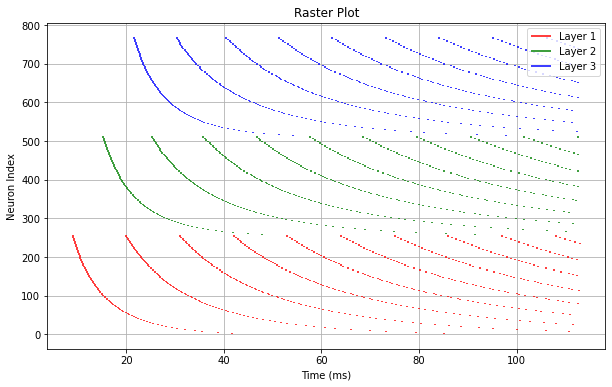

In [9]:
#Calculating propagation delay
import matplotlib.pyplot as plt
import numpy as np
import nest
 
# Reset NEST kernel
nest.ResetKernel()
 
# Set simulation parameters
propagation_delay=13.0 #See below how to get the propagation delay
sim_time = 100.0+propagation_delay# in milliseconds
offset = 380  # Offset value for analog input
# Define the analog values from 0 to 255
min_analog_value = 0 + offset
max_analog_value = 255 + offset
num_neurons = 256
 
# Create neuron populations
L1_neurons = nest.Create("iaf_psc_alpha", num_neurons)
L2_neurons = nest.Create("iaf_psc_alpha", num_neurons)
L3_neurons = nest.Create("iaf_psc_alpha", num_neurons)
 
ind=0
for value in range(min_analog_value, max_analog_value):
    # Set current for each neuron
    nest.SetStatus(L1_neurons[ind], {"I_e": value})
    ind+=1
 
# Connect neurons with one-to-one connections
for idx in range(num_neurons):
    nest.Connect(L1_neurons[idx], L2_neurons[idx], "one_to_one", syn_spec={"weight": 1200.0})  # 800.0 is a high synaptic weight to perform by-pass
    nest.Connect(L2_neurons[idx], L3_neurons[idx], "one_to_one", syn_spec={"weight": 1200.0})
 
# Create spike recorder
spikerecorder_L1 = nest.Create("spike_recorder")
spikerecorder_L2 = nest.Create("spike_recorder")
spikerecorder_L3 = nest.Create("spike_recorder")
 
# Connect spike recorder to neurons
nest.Connect(L1_neurons, spikerecorder_L1)
nest.Connect(L2_neurons, spikerecorder_L2)
nest.Connect(L3_neurons, spikerecorder_L3)
 
 
# Simulate network
nest.Simulate(sim_time)
 
 
# Get spike events from spike recorders
spike_events_L1 = nest.GetStatus(spikerecorder_L1, "events")[0]
spike_events_L2 = nest.GetStatus(spikerecorder_L2, "events")[0]
spike_events_L3 = nest.GetStatus(spikerecorder_L3, "events")[0]
senders_L1 = spike_events_L1["senders"]
ts_L1 = spike_events_L1["times"]
senders_L2 = spike_events_L2["senders"]
ts_L2 = spike_events_L2["times"]
senders_L3 = spike_events_L3["senders"]
ts_L3 = spike_events_L3["times"]
 
print("Propagation delay between L1 and L2:",(ts_L2[0]-ts_L1[0]),"ms.")
print("Propagation delay between L2 and L3:",(ts_L3[0]-ts_L2[0]),"ms.")
print("Propagation delay between L1 and L3:",(ts_L3[0]-ts_L1[0]),"ms.")
 
# Output
# Propagation delay between L1 and L2: 7.0 ms.
# Propagation delay between L3 and L2: 6.0 ms.
# Propagation delay between L1 and L3: 13.0 ms.
 
 
# Plot raster plot with different colors per layer
plt.figure(figsize=(10, 6))
 
# Plot spikes for Layer 1
senders_L1 = spike_events_L1["senders"]
ts_L1 = spike_events_L1["times"]
plt.vlines(ts_L1, senders_L1, senders_L1 + 1, color='red', label='Layer 1')
 
# Plot spikes for Layer 2
senders_L2 = spike_events_L2["senders"]
ts_L2 = spike_events_L2["times"]
plt.vlines(ts_L2, senders_L2, senders_L2 + 1, color='green', label='Layer 2')
 
# Plot spikes for Layer 3
senders_L3 = spike_events_L3["senders"]
ts_L3 = spike_events_L3["times"]
plt.vlines(ts_L3, senders_L3, senders_L3 + 1, color='blue', label='Layer 3')
 
plt.xlabel('Time (ms)')
plt.ylabel('Neuron Index')
plt.title('Raster Plot')
plt.legend()
plt.grid()
plt.show()
 

Reading image frame_0000...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:25<00:00, 1391.91it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:25<00:00, 1384.07it/
Setting currents for Red channel: 100%|▉| 34753/34800 [00:23<00:00, 1534.47it/s]

Simulating for frame_0000
Simulation completed for frame_0000
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|██| 34800/34800 [00:36<00:00, 959.67it/s]


Reading image frame_0001...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1414.12it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1436.13it/
Setting currents for Red channel: 100%|▉| 34656/34800 [00:23<00:00, 1498.79it/s]

Simulating for frame_0001
Simulation completed for frame_0001
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:32<00:00, 1061.05it/s]


Reading image frame_0002...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1409.68it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1421.06it/
Setting currents for Red channel: 100%|▉| 34693/34800 [00:23<00:00, 1479.20it/s]

Simulating for frame_0002
Simulation completed for frame_0002
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:33<00:00, 1039.48it/s]


Reading image frame_0003...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1413.19it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1406.51it/
Setting currents for Red channel: 100%|▉| 34785/34800 [00:23<00:00, 1528.87it/s]

Simulating for frame_0003
Simulation completed for frame_0003
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:32<00:00, 1061.09it/s]


Reading image frame_0004...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1432.31it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1432.17it/
Setting currents for Red channel: 100%|▉| 34727/34800 [00:22<00:00, 1489.99it/s]

Simulating for frame_0004
Simulation completed for frame_0004
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:32<00:00, 1068.43it/s]


Reading image frame_0005...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:23<00:00, 1467.15it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:23<00:00, 1462.28it/
Setting currents for Red channel: 100%|▉| 34747/34800 [00:22<00:00, 1523.45it/s]

Simulating for frame_0005
Simulation completed for frame_0005
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:32<00:00, 1059.03it/s]


Reading image frame_0006...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1414.06it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1404.94it/
Setting currents for Red channel: 100%|▉| 34796/34800 [00:23<00:00, 1462.37it/s]

Simulating for frame_0006
Simulation completed for frame_0006
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:33<00:00, 1024.11it/s]


Reading image frame_0007...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1412.76it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:25<00:00, 1390.55it/
Setting currents for Red channel: 100%|▉| 34717/34800 [00:24<00:00, 1439.90it/s]

Simulating for frame_0007
Simulation completed for frame_0007
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:33<00:00, 1047.27it/s]


Reading image frame_0008...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:25<00:00, 1381.84it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1410.85it/
Setting currents for Red channel: 100%|▉| 34687/34800 [00:23<00:00, 1464.90it/s]

Simulating for frame_0008
Simulation completed for frame_0008
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:34<00:00, 1013.38it/s]


Reading image frame_0009...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1402.23it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1410.52it/
Setting currents for Red channel: 100%|▉| 34799/34800 [00:23<00:00, 1466.84it/s]

Simulating for frame_0009
Simulation completed for frame_0009
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|█| 34800/34800 [00:32<00:00, 1056.32it/s]


Reading image frame_0010...
Image dimensions: Height: 174, Width: 200
(174, 200, 3)


Setting currents for Blue channel: 100%|█| 34800/34800 [00:24<00:00, 1420.48it/s
Setting currents for Green channel: 100%|█| 34800/34800 [00:24<00:00, 1423.60it/
Setting currents for Red channel: 100%|▉| 34791/34800 [00:23<00:00, 1467.97it/s]

Simulating for frame_0010
Simulation completed for frame_0010
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800
Subtracting the propagation delay: 13.0,ms.
0 34799 34800


Setting currents for Red channel: 100%|██| 34800/34800 [00:34<00:00, 997.44it/s]


Processing frame_0000 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0001 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0002 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0003 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0004 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0005 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0006 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!

/tmp/ipykernel_22166/2237636417.py:288: RuntimeWarning:More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Preparing plot for green ...
Preparing plot for blue ...
Done!
Processing frame_0010 ...
normalised_3Dmat: 5.08 MB

Preparing plot for red ...
Preparing plot for green ...
Preparing plot for blue ...
Done!
The analogue value for pattern [False False False False False False False False False False  True False
 False False False False False False False False False False  True False
 False False False False False False False False False False  True False
 False False False False False False False False False False  True False
 False False False] is 211.
Pattern 1b: Not found
The analogue value for pattern [False False False False False False False False False False  True False
 False False False False False False False False False  True False False
 False False False False False False False False  True False False False
 False False False False False False False False  True False False False
 False False False] is 233.
Pattern 2b: Not found
The analogue value for pattern [False False Fals

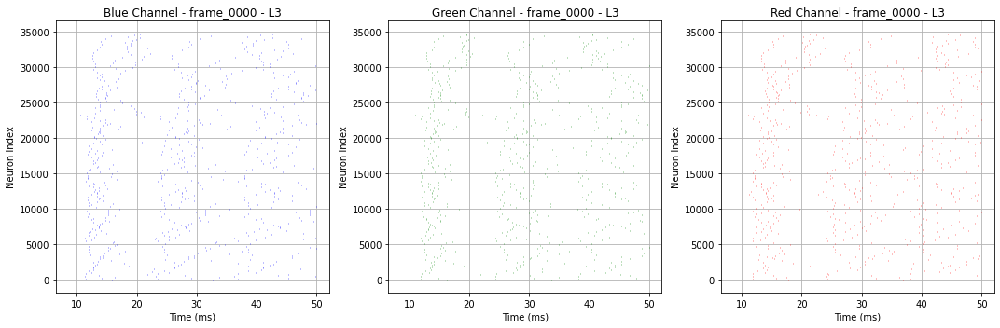

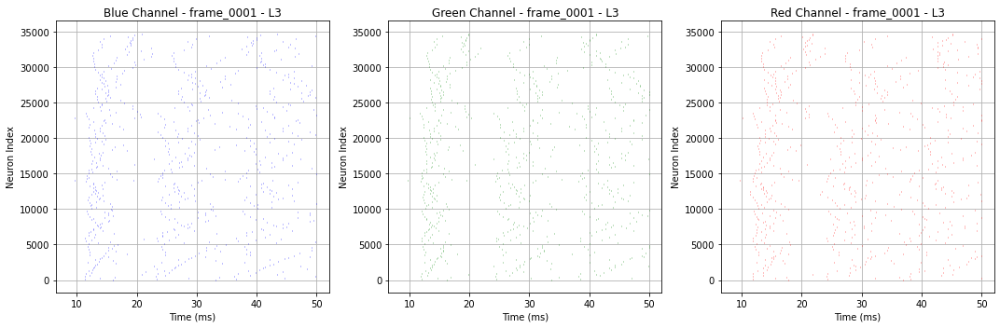

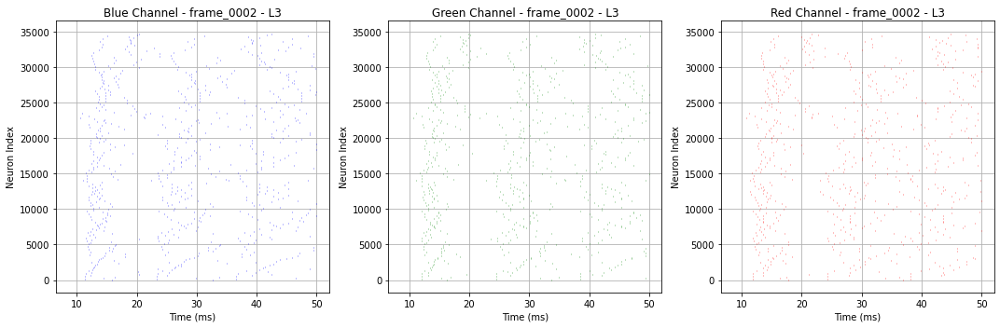

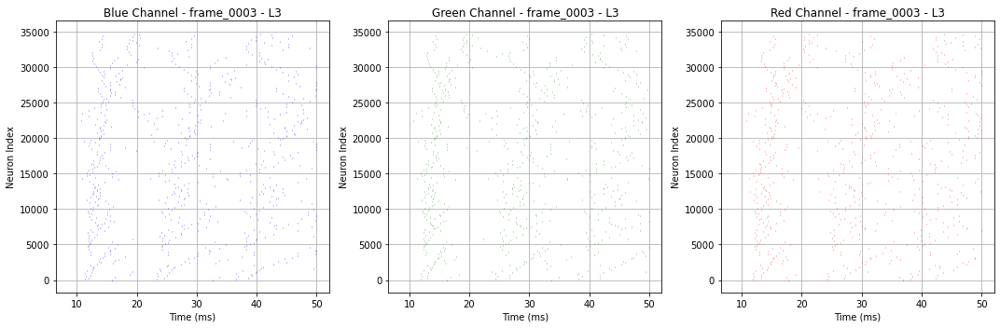

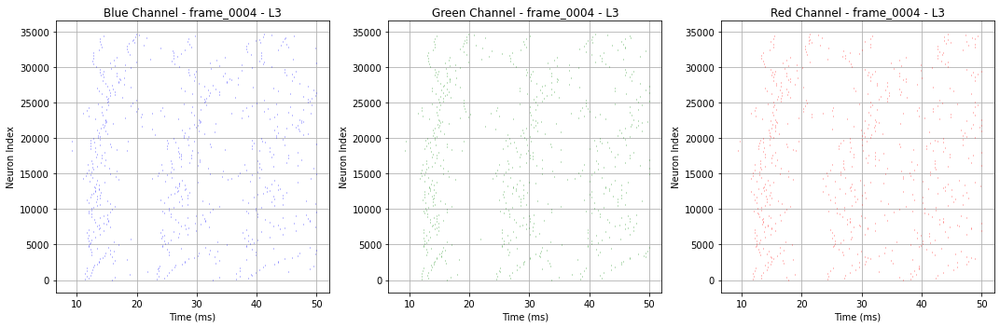

...

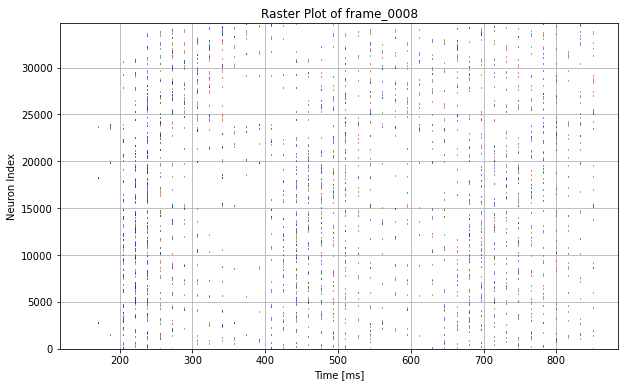

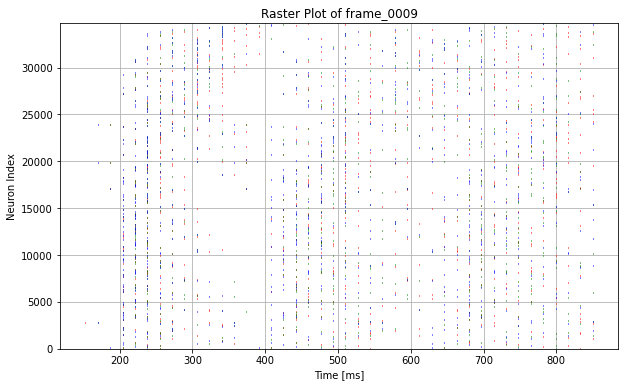

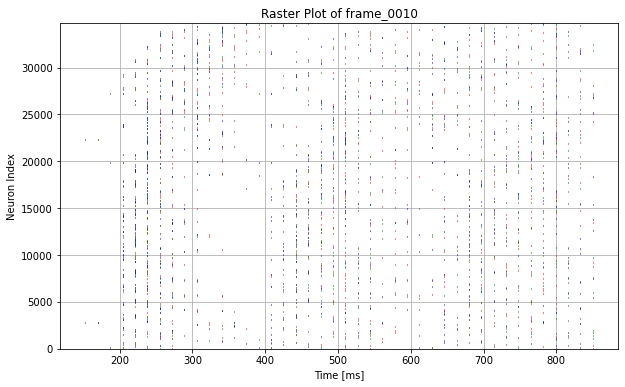

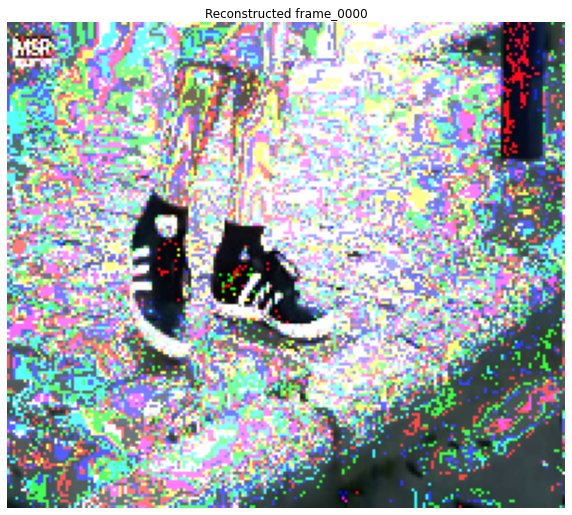

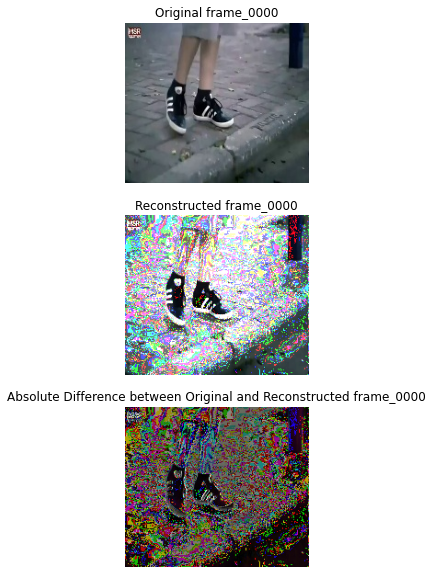

Processing frame_0001 ...
(34800, 51, 3)


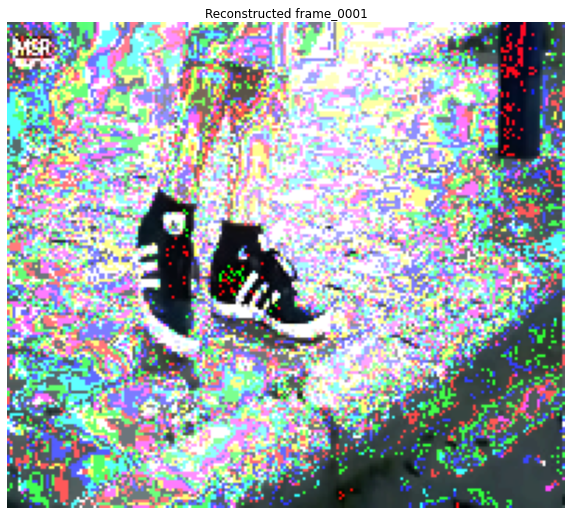

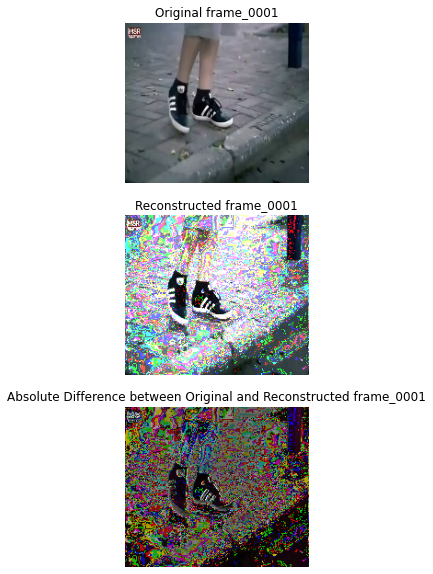

Processing frame_0002 ...
(34800, 51, 3)


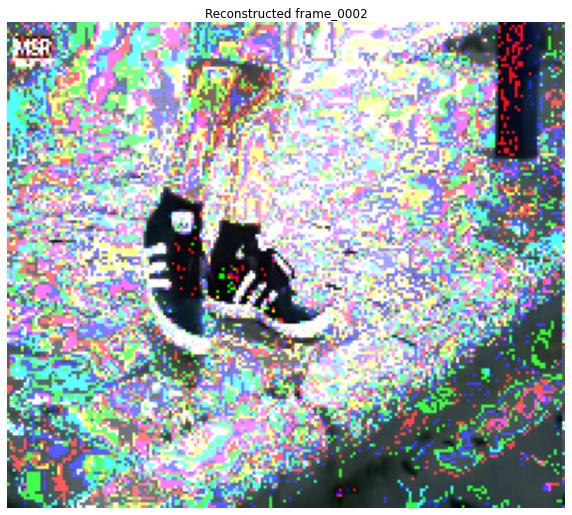

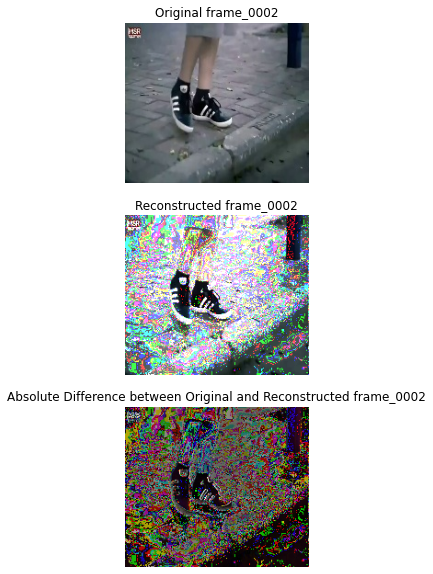

Processing frame_0003 ...
(34800, 51, 3)


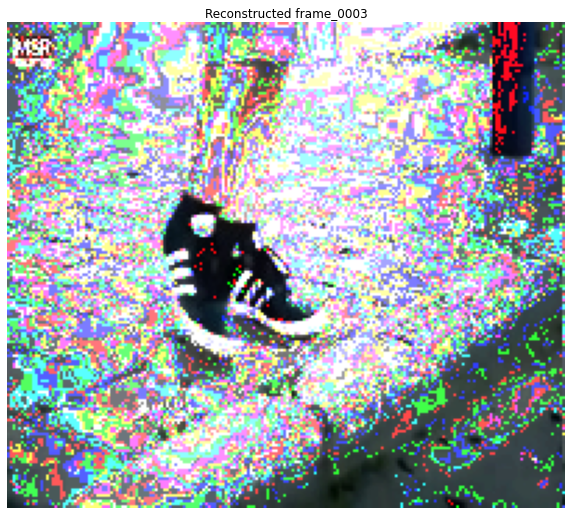

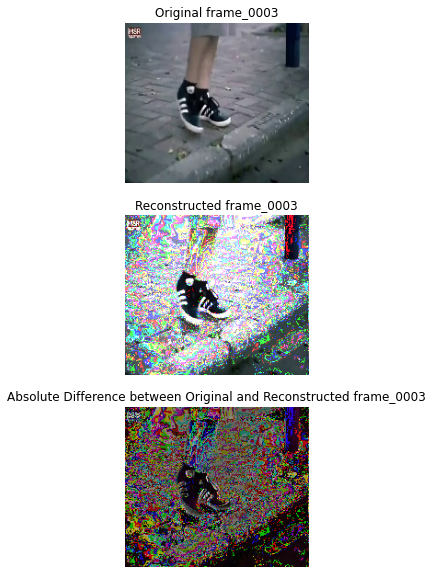

Processing frame_0004 ...
(34800, 51, 3)


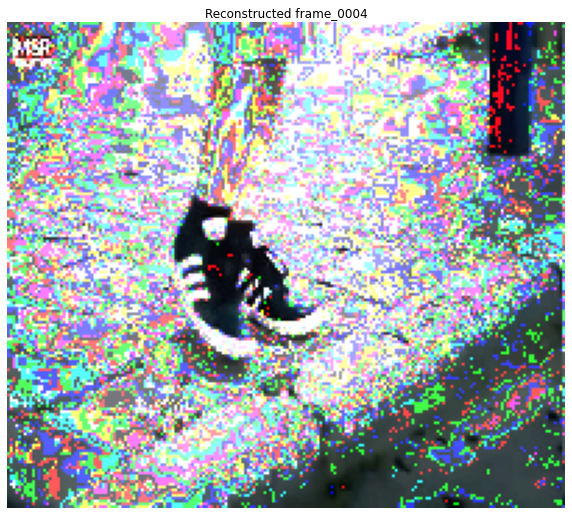

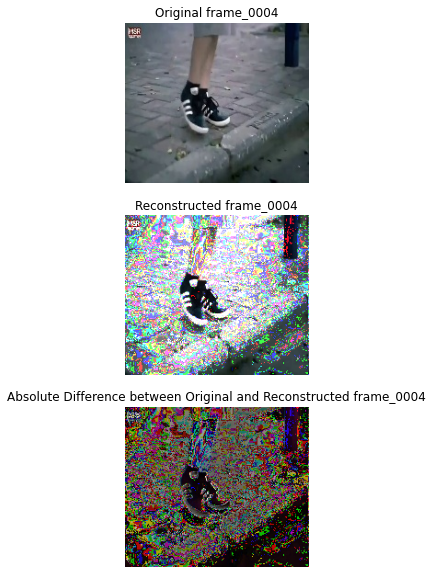

Processing frame_0005 ...
(34800, 51, 3)


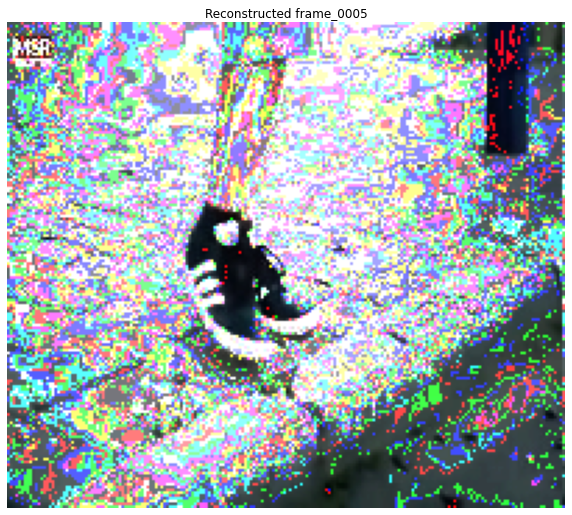

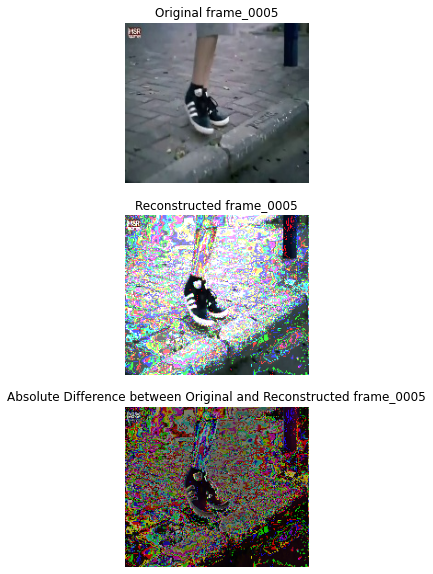

Processing frame_0006 ...
(34800, 51, 3)


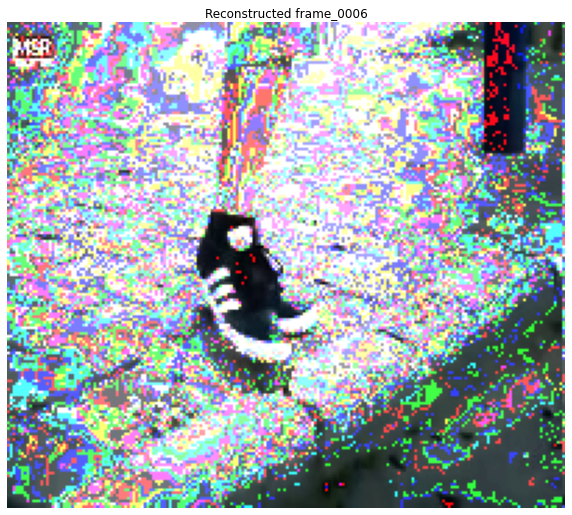

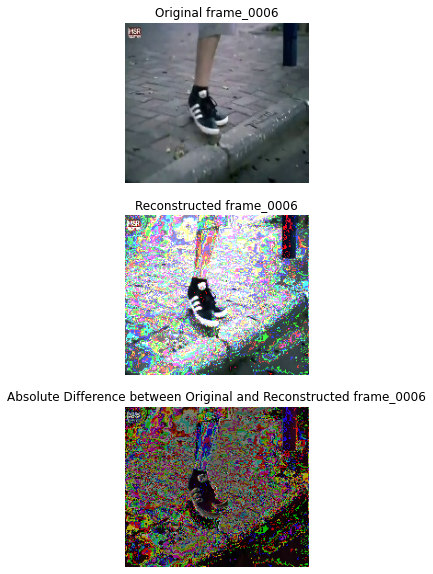

Processing frame_0007 ...
(34800, 51, 3)


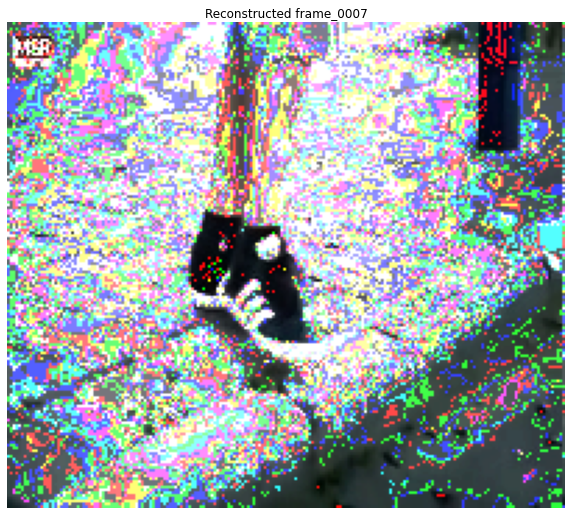

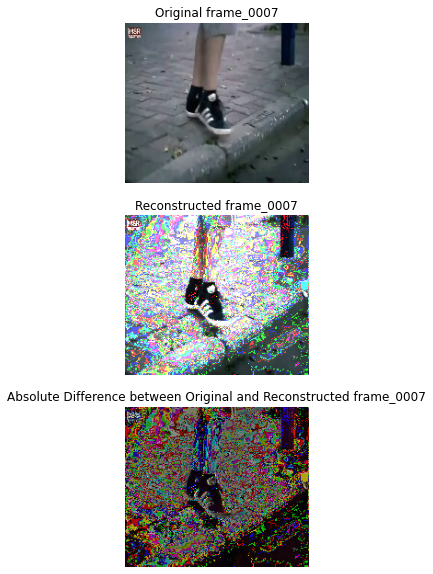

Processing frame_0008 ...
(34800, 51, 3)


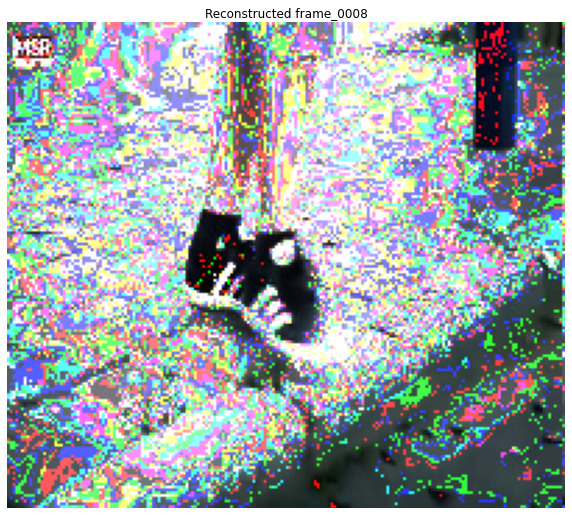

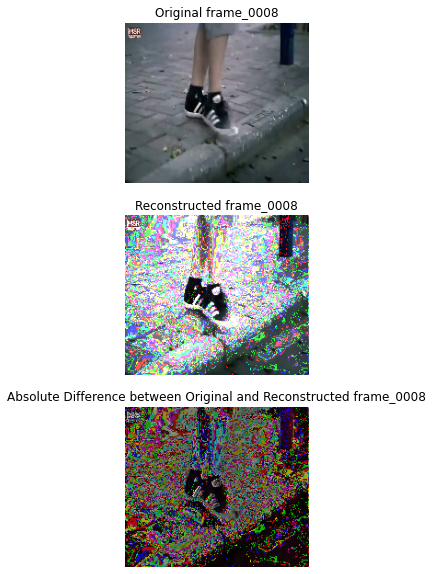

Processing frame_0009 ...
(34800, 51, 3)


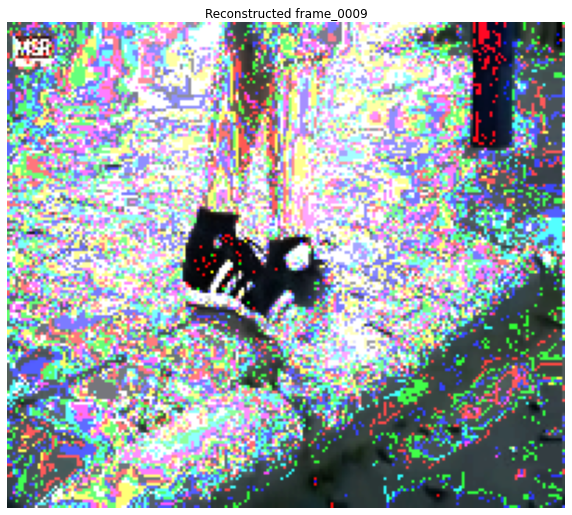

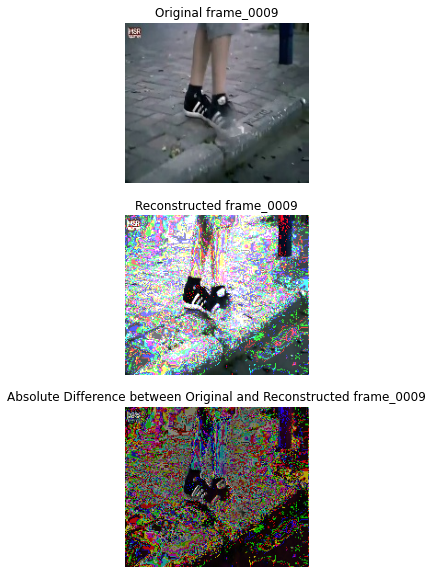

Processing frame_0010 ...
(34800, 51, 3)


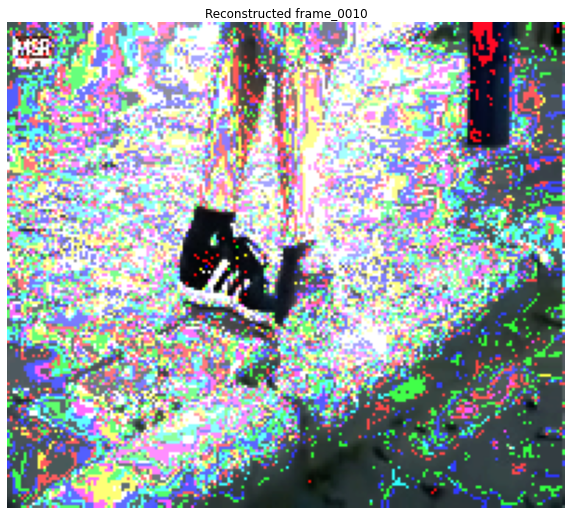

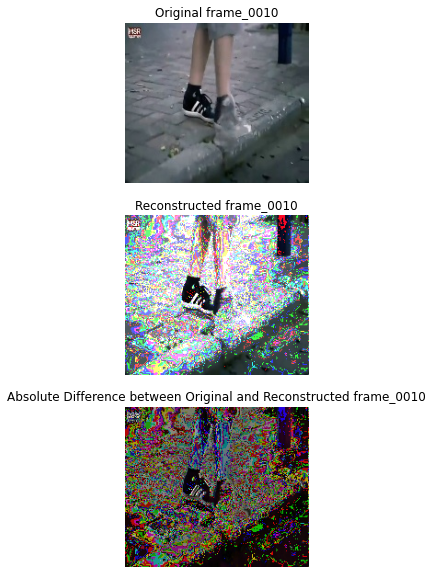

In [65]:
import matplotlib.pyplot as plt

import nest

import numpy as np
import json
import os

import h5py

from tqdm import tqdm

import cv2

results_dir = "Videoresults/"

image_extension = '.jpg'

images_folder = 'video_frames'

rows = 174

cols = 200

# Load weights from JSON file
with open('weights.json') as f:
    params = json.load(f)
    weights = params['weights']
#

# Function to convert pixel intensity to current for each color channel

def pixel_intensity_to_current(intensity, offset=380):
    return intensity + offset


# Function to resize image

def resize_image(image, target_size=(cols, rows)):
    if target_size is None:

        return image

    else:

        return cv2.resize(image, target_size)


# Function to simulate raster plot for each image

def simulate_raster_plot(image_file, current_funcs, sim_time=50.0, pd=13.0):
    nest.ResetKernel

    # Clear console

    os.system('clear')

    sim_time1 = sim_time + pd

    # Read the image

    print("Reading image {}...".format(image_file))

    # image = cv2.imread(image_file)

    image = cv2.imread(os.path.join(images_folder, image_file + image_extension))

    # Resize the image

    resized_image = resize_image(image)

    # Get image dimensions

    height, width, _ = resized_image.shape

    print("Image dimensions: Height: {}, Width: {}".format(height, width))

    print(resized_image.shape)

    # Initialize NEST kernel

    nest.ResetKernel()

    nest.set_verbosity(20)  # Set NEST verbosity level to 20

    nest.SetKernelStatus({'print_time': False})

    # Create layers for Blue, Green, and Red channels

    layers_L1 = []

    layers_L2 = []

    layers_L3 = []

    spikerecorders_L1 = []

    spikerecorders_L2 = []

    spikerecorders_L3 = []

    for i, color in enumerate(['Blue', 'Green', 'Red']):

        # Create layer with iaf_psc_alpha neurons

        layers_L1.append(nest.Create('iaf_psc_alpha', width * height))

        layers_L2.append(nest.Create('iaf_psc_alpha', width * height))

        layers_L3.append(nest.Create('iaf_psc_alpha', width * height))

        # Connect each layer to a spike recorder

        spikerecorders_L1.append(nest.Create("spike_recorder"))

        spikerecorders_L2.append(nest.Create("spike_recorder"))

        spikerecorders_L3.append(nest.Create("spike_recorder"))

        # Progress bar for setting currents

        progress_bar = tqdm(total=height * width, desc="Setting currents for {} channel".format(color), position=0,

                            leave=True)

        # Create spike generators for each neuron and inject analog values

        for row in range(height):

            for col in range(width):
                # Calculate the current based on pixel intensity for the corresponding color channel

                intensity = resized_image[row, col, i]

                current = current_funcs[i](intensity)

                # Set current for each neuron

                neuron_index = row * width + col

                nest.SetStatus(layers_L1[i][neuron_index], {"I_e": current})

                nest.Connect(layers_L1[i][neuron_index], layers_L2[i][neuron_index], "one_to_one",
                             syn_spec={"weight": weights})

                nest.Connect(layers_L2[i][neuron_index], layers_L3[i][neuron_index], "one_to_one",
                             syn_spec={"weight": weights})

                # Update progress bar

                progress_bar.update(1)

        nest.Connect(layers_L1[i], spikerecorders_L1[i])

        nest.Connect(layers_L2[i], spikerecorders_L2[i])

        nest.Connect(layers_L3[i], spikerecorders_L3[i])

    print("Simulating for", image_file)

    nest.Simulate(sim_time1)

    print("Simulation completed for", image_file)

    # Save spike events and senders in HDF5 format

    os.makedirs(results_dir, exist_ok=True)

    with h5py.File(os.path.join(results_dir, image_file + "_spikes.h5"), "w") as file:

        for i, color in enumerate(['Blue', 'Green', 'Red']):
            events = spikerecorders_L3[i].get("events")

            senders = events["senders"]

            times = events["times"]

            grp = file.create_group(color)

            grp.create_dataset("senders", data=senders)

            grp.create_dataset("times", data=times)

            grp.attrs["image_filename"] = image_file

            grp.attrs["image_dimensions"] = (height, width)

            grp.attrs["simulation_time"] = sim_time

    # Plot raster plot for each color channel

    plt.figure(figsize=(15, 5))

    for i, color in enumerate(['Blue', 'Green', 'Red']):

        plt.subplot(1, 3, i + 1)

        plt.title('{} Channel - {} - L3'.format(color, image_file))

        plt.xlabel('Time (ms)')

        plt.ylabel('Neuron Index')

        plt.grid()

        ts = spikerecorders_L3[i].get("events")["times"]

        if (np.min(ts) > pd):
            print(f"Subtracting the propagation delay: {pd},ms.")

            ts -= pd

        senders = spikerecorders_L3[i].get("events")["senders"] - np.min(
            spikerecorders_L3[i].get("events")["senders"])  # normalise values between 0 and cols*rows-1

        print(np.min(senders), np.max(senders), (cols * rows))

        np.save(os.path.join(results_dir, image_file + "_" + color + "_L3_senders.npy"), senders)

        np.save(os.path.join(results_dir, image_file + "_" + color + "_L3_ts.npy"), ts)

        plt.vlines(ts, senders, senders + 1, color=color.lower(), linewidths=0.5)

    plt.tight_layout()

    # plt.show()


# getting frames

image_files = [f'frame_{i:04d}' for i in range(11)]

# Simulate raster plot for each image

for image_file in image_files:
    simulate_raster_plot(image_file, [pixel_intensity_to_current] * 3)


def create_normalised_3D_matrix(fig, times_red, senders_red, times_green, senders_green, times_blue, senders_blue,
                                cols):
    rows = 174 * 200

    normalised_3Dmat = np.zeros((rows, cols, 3))

    for i in range(len(times_red)):
        normalised_3Dmat[int(senders_red[i] - 1), int(np.round(times_red[i], 0)), 0] = 1.0  # red

    for i in range(len(times_green)):
        normalised_3Dmat[int(senders_green[i] - 1), int(np.round(times_green[i], 0)), 1] = 1.0  # green

    for i in range(len(times_blue)):
        normalised_3Dmat[int(senders_blue[i] - 1), int(np.round(times_blue[i], 0)), 2] = 1.0  # blue

    normalised_3Dmat.dump(f"Videoresults/normalised_3Dmat_{fig}.npy")

    return normalised_3Dmat.astype(bool)


#

#

#

def plot_results(fig, normalised_3Dmat, cols):
    """

    Plot the raster plot.

    Parameters:

        fig (str): Figure name.

        normalised_3Dmat (numpy.ndarray): Normalised 3D matrix of spike events.

        cols (int): Number of time bins.

    """

    # Print size

    print(f"normalised_3Dmat: {np.round((normalised_3Dmat.nbytes) / (1024 * 1024), 2)} MB")

    print()

    # Plot the raster plot

    plt.figure(figsize=(10, 6))

    for channel, color in enumerate(['red', 'green', 'blue']):

        print(f"Preparing plot for {color} ...")

        for idx in range(normalised_3Dmat.shape[0]):

            spike_times = np.where(normalised_3Dmat[idx, :, channel])[0] * (cols // 3)  # Adjust the indexing

            if len(spike_times) > 0:
                plt.vlines(spike_times, idx, idx + 1, color=color, linewidth=1)

    print("Done!")

    plt.xlabel('Time [ms]')

    plt.ylabel('Neuron Index')

    plt.title(f"Raster Plot of {fig}")

    plt.ylim(0, normalised_3Dmat.shape[0])

    plt.grid(True)

    plt.savefig(f"results_png/{fig}_raster_plot.png")

    # plt.show()


#

#

# List of figure names

figures = [f'frame_{i:04d}' for i in range(11)]

# List colour names

colours = ["Red", "Green", "Blue"]

cols = 51  # time in ms

# Loop over each figure

for idx in range(0, len(figures)):
    # Read events and senders from files

    print(f"Processing {figures[idx]} ...")

    times_red = np.load(f"Videoresults/{figures[idx]}_Red_L3_ts.npy", allow_pickle=True)

    senders_red = np.load(f"Videoresults/{figures[idx]}_Red_L3_senders.npy", allow_pickle=True)

    times_green = np.load(f"Videoresults/{figures[idx]}_Green_L3_ts.npy", allow_pickle=True)

    senders_green = np.load(f"Videoresults/{figures[idx]}_Green_L3_senders.npy", allow_pickle=True)

    times_blue = np.load(f"Videoresults/{figures[idx]}_Blue_L3_ts.npy", allow_pickle=True)

    senders_blue = np.load(f"Videoresults/{figures[idx]}_Blue_L3_senders.npy", allow_pickle=True)

    # Create the normalized 2D matrix

    normalised_3Dmat = create_normalised_3D_matrix(figures[idx], times_red, senders_red, times_green, senders_green,
                                                   times_blue, senders_blue, cols)

    # Print results and plot raster plot

    plot_results(figures[idx], normalised_3Dmat, cols)


def pixel_intensity_to_current(intensity, offset=380):
    return intensity + offset


def create_normalised_2D_matrix(times, senders, cols):
    rows = np.max(senders) + 1

    normalised_2Dmat = np.zeros((rows, cols))

    for i in range(len(times)):
        normalised_2Dmat[int(senders[i]), int(np.round(times[i], 0))] = 1.0

    normalised_2Dmat.dump(f"Videoresults/normalised_2Dmat.npy")

    return normalised_2Dmat.astype(bool)


def find_spike_pattern(pattern, normalised_2Dmat):
    """

    Find the index of the spike pattern in the normalized 2D matrix.

    Parameters:

        pattern (numpy.ndarray): Spike pattern to search for.

        normalised_2Dmat (numpy.ndarray): Normalized 2D matrix of spike events.

    Returns:

        int: Index of the spike pattern if found, -1 otherwise.

    """

    for idx in range(normalised_2Dmat.shape[0]):

        if np.array_equal(normalised_2Dmat[idx], pattern):
            return idx

    return -1


# Function to generate random spike patterns

def generate_random_pattern(length):
    random_array = np.random.randint(2, size=length)

    return random_array


# Reset NEST kernel

nest.ResetKernel()

# Define the number of neurons

num_neurons = 256

offset = 380

# Create layer with iaf_psc_alpha neurons

layer = nest.Create('iaf_psc_alpha', num_neurons)

spikerecorder = nest.Create("spike_recorder")

# Define the analog values from 0 to 255

min_analog_value = 0 + offset

max_analog_value = 255 + offset

# Create spike generators for each neuron and inject analog values

ind = 0

for value in range(min_analog_value, max_analog_value):
    # Set current for each neuron

    nest.SetStatus(layer[ind], {"I_e": value})

    ind += 1

nest.Connect(layer, spikerecorder)

# Simulate

nest.Simulate(50.0)

# Get spike times

events = spikerecorder.get("events")

senders = events["senders"]

ts = events["times"]

normalised_2Dmat = create_normalised_2D_matrix(ts, senders, 51)


# Function to generate random spike patterns

def generate_random_pattern(length):
    return np.random.randint(2, size=length)


# test a known patterns

for i in range(50):

    # Find the index of the pattern in the normalized 2D matrix

    idx = np.random.randint(256)

    pattern_index = find_spike_pattern(normalised_2Dmat[idx, :], normalised_2Dmat)

    # Print the result

    if pattern_index != -1:

        print(f"The analogue value for pattern {normalised_2Dmat[idx, :]} is {pattern_index}.")

    else:

        print(f"Pattern {i + 1}: Not found")

    # Generate a random spike pattern

    pattern_to_find = generate_random_pattern(51).astype(bool)

    # Find the index of the pattern in the normalized 2D matrix

    pattern_index = find_spike_pattern(pattern_to_find, normalised_2Dmat)

    # Print the result

    if pattern_index != -1:

        print(f"The analogue value for pattern {pattern_to_find} is {pattern_index}.")

    else:

        print(f"Pattern {i + 1}b: Not found")


def spikes_to_analog(pattern, normalised_2Dmat):
    """

    Convert spikes to analogue values.

    Parameters:

        pattern (numpy.ndarray): Spike pattern to search for.

        normalised_2Dmat (numpy.ndarray): Normalised 2D matrix of spike events.

    Returns:

        int: Index of the spike pattern if found, -1 otherwise.

    """

    for idx in range(normalised_2Dmat.shape[0]):

        if np.array_equal(normalised_2Dmat[idx], pattern):
            return idx

    return -1


# Load the normalised 2D matrix

normalised_2Dmat = np.load(f"Videoresults/normalised_2Dmat.npy", allow_pickle=True)

# List of figure names

figures = [f"frame_{i:04d}" for i in range(11)]

for idx, fig_name in enumerate(figures):

    # Read events and senders from files

    print(f"Processing {fig_name} ...")

    normalised_3Dmat = np.load(f"Videoresults/normalised_3Dmat_{figures[idx]}.npy", allow_pickle=True)

    print(normalised_3Dmat.shape)

    # Create 2D matrix for each channel

    analogue_values_ch = np.zeros((174, 200, 3), dtype=np.uint8)

    for k in range(normalised_3Dmat.shape[2]):  # Iterate over the third dimension

        for i in range(normalised_3Dmat.shape[0]):
            tmp = spikes_to_analog(normalised_3Dmat[i, :, k], normalised_2Dmat)

            # if tmp < 0:

            #     raise ValueError("Invalid value!")

            r, c = divmod(i, 200)  # Calculate row and column indices

            analogue_values_ch[r, c, k] = np.uint8(tmp)

    analogue_values_ch = np.array(analogue_values_ch)

    # Load original image

    original_image = cv2.imread(f"video_frames/{fig_name}.jpg")

    original_image_resized = cv2.resize(original_image, (200, 174))

    # Calculate the absolute difference between original and reconstructed images

    diff_image = cv2.absdiff(original_image_resized, analogue_values_ch)

    # Save and display the plot

    plt.figure(figsize=(10, 10))

    plt.imshow(analogue_values_ch)

    plt.title(f"Reconstructed {figures[idx]}")

    plt.axis('off')

    plt.savefig(f"reconstructedFigures/{figures[idx]}_reconstructed.png")
    plt.show()

    # Save and display the plot

    plt.figure(figsize=(10, 10))

    # Plot the original image

    plt.subplot(3, 1, 1)

    plt.imshow(cv2.cvtColor(original_image_resized, cv2.COLOR_BGR2RGB))

    plt.title(f"Original {figures[idx]}")

    plt.axis('off')

    # Plot the reconstructed image

    plt.subplot(3, 1, 2)

    plt.imshow(analogue_values_ch)

    plt.title(f"Reconstructed {figures[idx]}")

    plt.axis('off')

    # Plot the absolute difference image

    plt.subplot(3, 1, 3)

    plt.imshow(cv2.cvtColor(diff_image, cv2.COLOR_BGR2RGB))

    plt.title(f"Absolute Difference between Original and Reconstructed {figures[idx]}")

    plt.axis('off')

    # Save and display the plot

    plt.savefig(f"reconstructedFigures/{figures[idx]}_comparinson.png")

    plt.show()

Processing frame_0001 ...


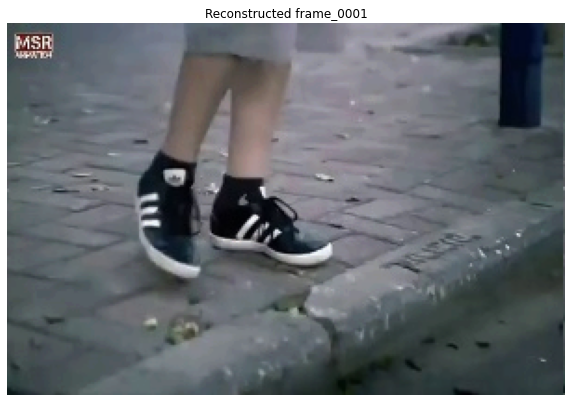

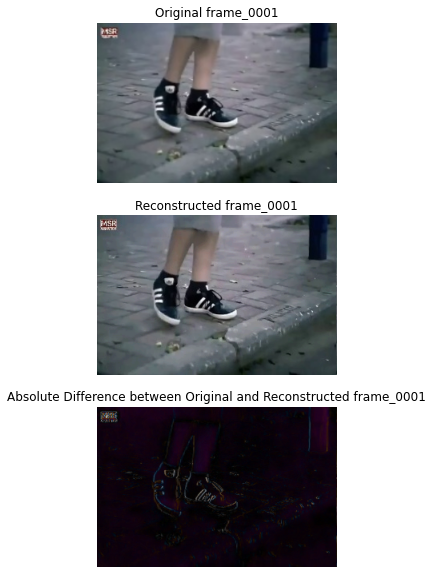

Processing frame_0002 ...


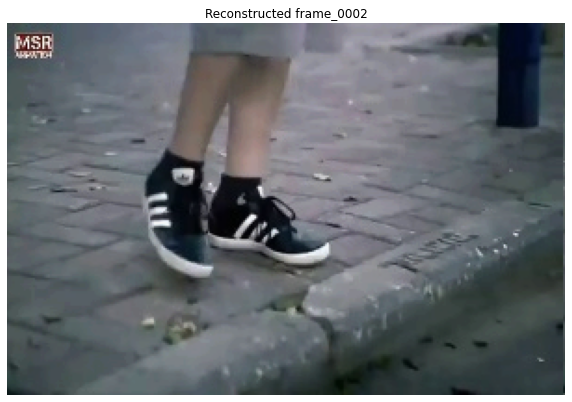

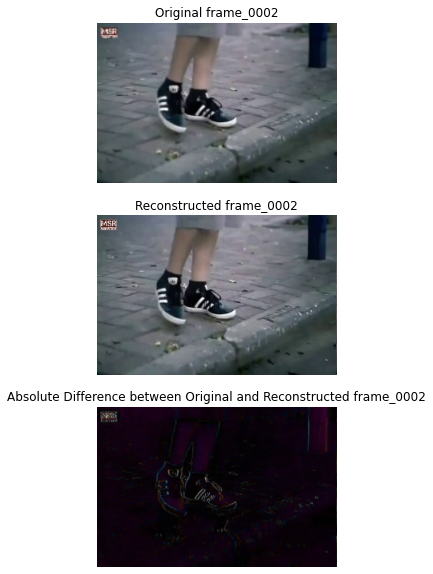

Processing frame_0003 ...


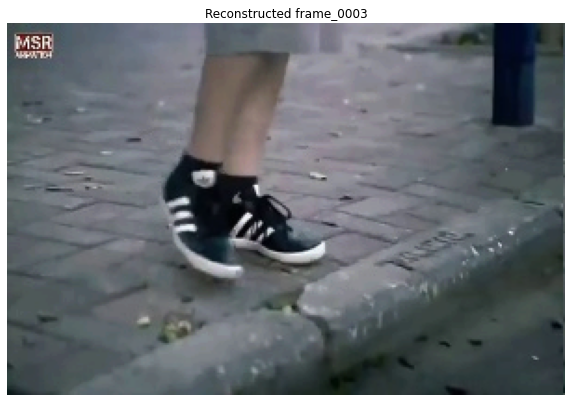

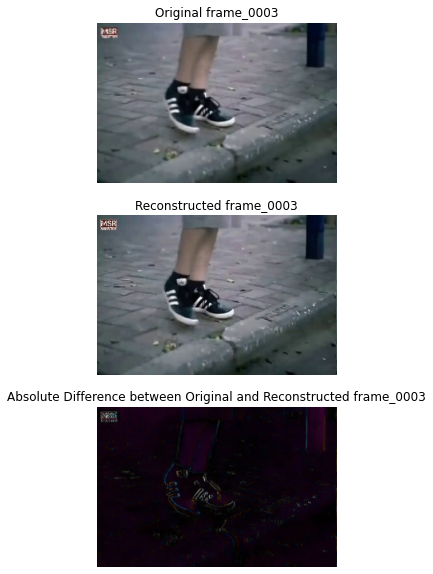

Processing frame_0004 ...


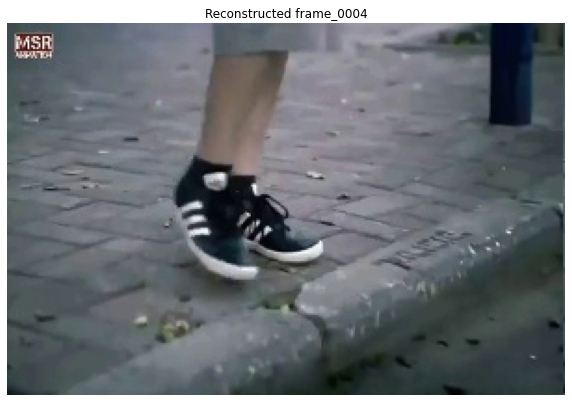

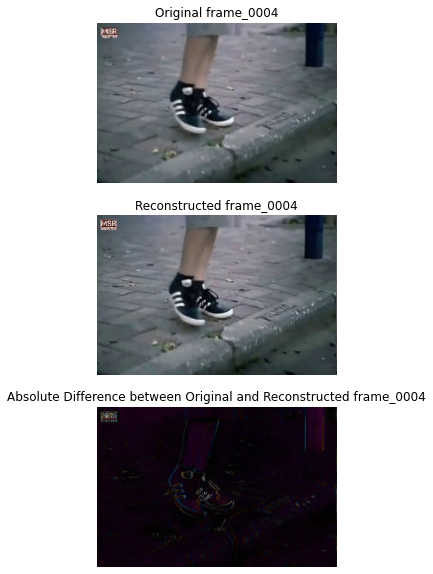

Processing frame_0005 ...


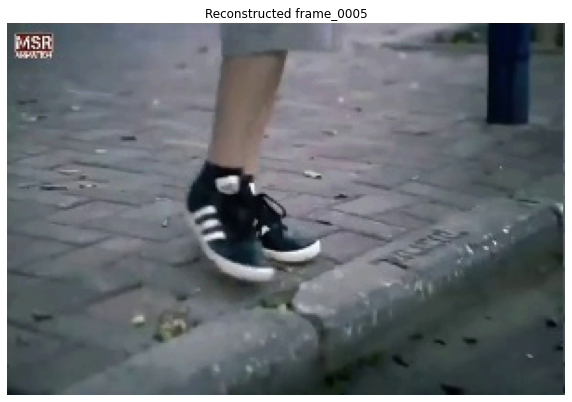

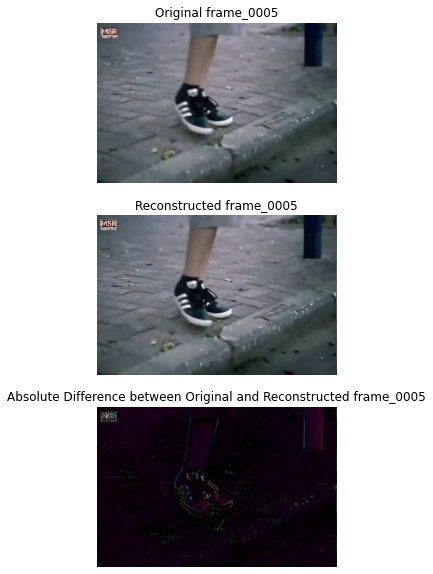

Processing frame_0006 ...


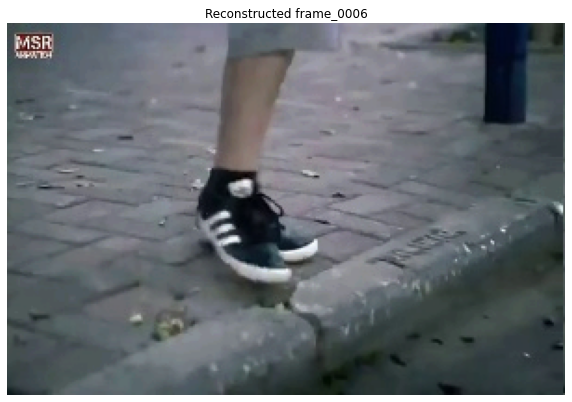

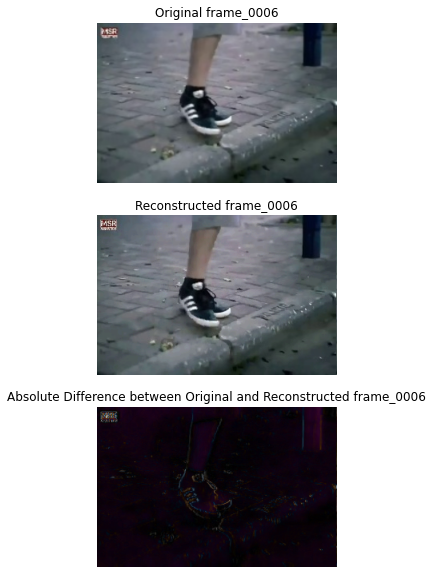

Processing frame_0007 ...


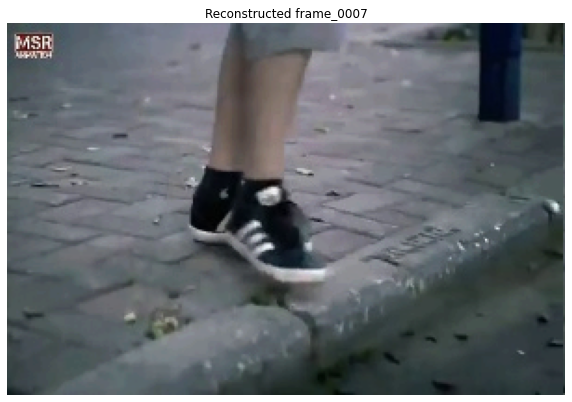

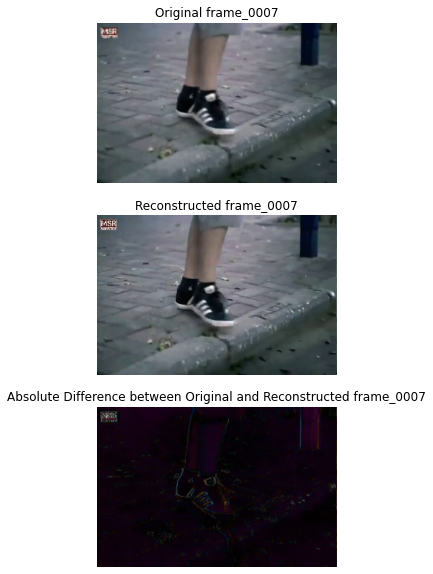

Processing frame_0008 ...


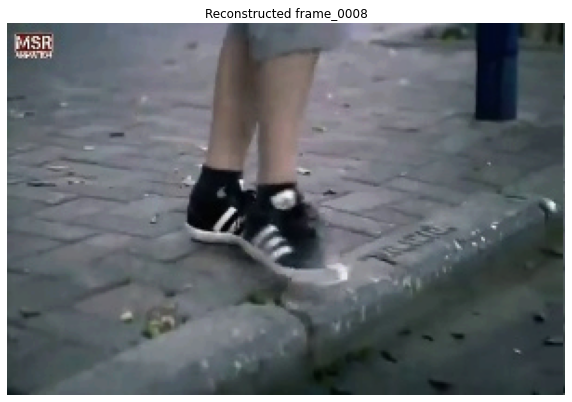

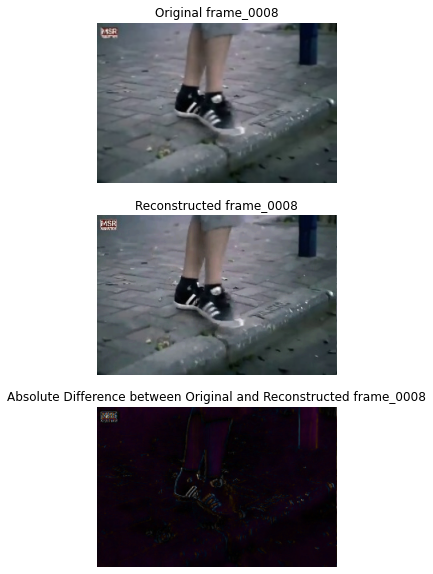

Processing frame_0009 ...


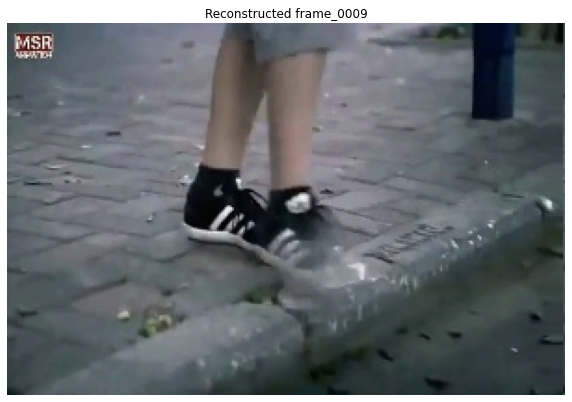

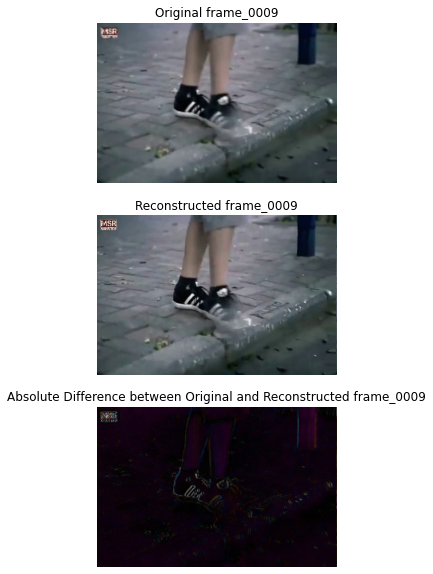

In [1]:
#decoded and reconstructed images on layer1
import numpy as np
import cv2
import matplotlib.pyplot as plt
 
def spikes_to_analog(pattern, normalised_2Dmat):
    """
    Convert spikes to analogue values.
 
    Parameters:
        pattern (numpy.ndarray): Spike pattern to search for.
        normalised_2Dmat (numpy.ndarray): Normalised 2D matrix of spike events.
 
    Returns:
        int: Index of the spike pattern if found, -1 otherwise.
    """
    for idx in range(normalised_2Dmat.shape[0]):
        if np.array_equal(normalised_2Dmat[idx], pattern):
            return idx
    return -1
 
# Load the normalised 2D matrix
normalised_2Dmat = np.load(f"results/normalised_2Dmat.npy", allow_pickle=True)
 
 
# Generate a list of figure names with a prefix and numbers from 1 to 200
 
figures = [f"frame_{i:04d}" for i in range(1,10)]
# Loop over each figure
for fig_name in figures:
    # Modify the processing code as needed
    print(f"Processing {fig_name} ...")
    normalised_3Dmat = np.load(f"results/normalised_3Dmat_{fig_name}.npy", allow_pickle=True)
    # print(normalised_3Dmat.shape)
 
    # Create 2D matrix for each channel
    analogue_values_ch = np.zeros((200, 300, 3), dtype=np.uint8)
    for k in range(normalised_3Dmat.shape[2]):  # Iterate over the third dimension
        for i in range(normalised_3Dmat.shape[0]):
            tmp = spikes_to_analog(normalised_3Dmat[i, :, k], normalised_2Dmat)
            # print(tmp)
            if tmp < 0:
                raise ValueError("Invalid value!")
            r, c = divmod(i, 300)  # Calculate row and column indices
            analogue_values_ch[r, c, k] = np.uint8(tmp)
    analogue_values_ch = np.array(analogue_values_ch)
 
    # Load original image
    original_image = cv2.imread(f"video_frames/{fig_name}.jpg")
    original_image_resized = cv2.resize(original_image, (300, 200))
 
    # Calculate the absolute difference between original and reconstructed images
    diff_image = cv2.absdiff(original_image_resized, analogue_values_ch)
 
    # Save and display the plot
    plt.figure(figsize=(10, 10))
    plt.imshow(analogue_values_ch)
    plt.title(f"Reconstructed {fig_name}")
    plt.axis('off')
    plt.savefig(f"reconstructedFigures/{fig_name}_reconstructed.png")
    plt.show()
 
    # Save and display the plot
    plt.figure(figsize=(10, 10))
    # Plot the original image
    plt.subplot(3, 1, 1)
    plt.imshow(cv2.cvtColor(original_image_resized, cv2.COLOR_BGR2RGB))
    plt.title(f"Original {fig_name}")
    plt.axis('off')
 
    # Plot the reconstructed image
    plt.subplot(3, 1, 2)
    plt.imshow(analogue_values_ch)
    plt.title(f"Reconstructed {fig_name}")
    plt.axis('off')
 
    # Plot the absolute difference image
    plt.subplot(3, 1, 3)
    plt.imshow(cv2.cvtColor(diff_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Absolute Difference between Original and Reconstructed {fig_name}")
    plt.axis('off')
 
    # Save and display the plot
    plt.savefig(f"reconstructedFigures/{fig_name}_comparison.png")
    plt.show()

In [2]:
import cv2
import os

video_dir = 'video_folder'
reconstructedvideo = 'reconstructed_vid.mp4'

files = sorted([i for i in os.listdir(video_dir) if i.endswith('.png')])

f1 = cv2.imread(os.path.join(video_dir, files[0]))
height, width, _ = f1.shape

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
final_vid = cv2.VideoWriter(reconstructedvideo, fourcc, 10.0, (width, height))

for frame in files:
    frame_path = os.path.join(video_dir, frame)
    frame1 = cv2.imread(frame_path)
    final_vid.write(frame1)

final_vid.release()

# Open the video file once, before the loop
video = cv2.VideoCapture(reconstructedvideo)

for i in range(12):  # Attempt to read the first 10 frames
    ret, frame = video.read()
    if ret:  # If a frame was successfully read
        cv2.imshow('Frame', frame)
        if cv2.waitKey(25) & 0xFF == ord('q'):  # Wait for a short time or until 'q' is pressed
            break
    else:
        break

video.release()  # Release the video file
cv2.destroyAllWindows()  # Close the video window


# Construction of a Three layer network WITH RANDOM CURRENT

Step 1/20
Step 2/20
Step 3/20
Step 4/20
Step 5/20
Step 6/20
Step 7/20
Step 8/20
Step 9/20
Step 10/20
Step 11/20
Step 12/20
Step 13/20
Step 14/20
Step 15/20
Step 16/20
Step 17/20
Step 18/20
Step 19/20
Step 20/20


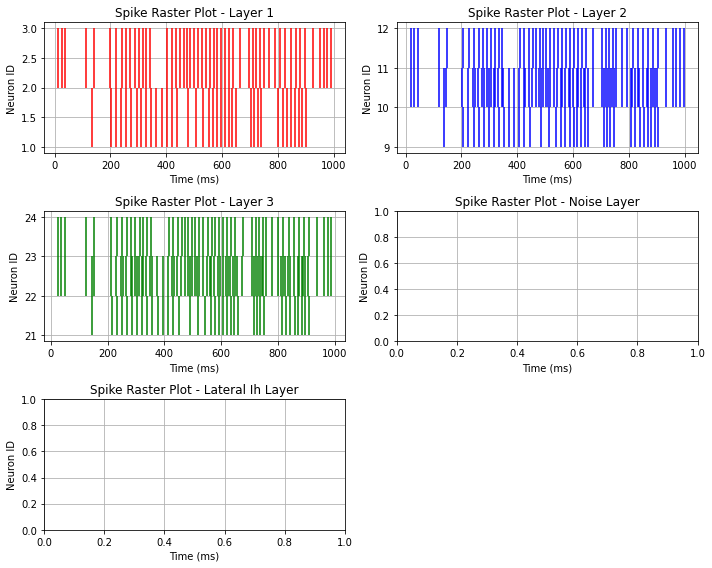

In [6]:
#Construction of a Three layer network
import numpy as np
import matplotlib.pyplot as plt
import nest

def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    plt.tight_layout()
    plt.savefig("SNNresults/WithoutNoise_raster_plot.png")
    plt.show()

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 12)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)

    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    #nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l2l3 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}

    # Define the connections for neuron 1 of layer 1 to neurons of layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]


    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # Connect layer 2 to layer 3 individually
    for i in range(12):
        nest.Connect(neuron_layer2[i], neuron_layer3[i],"one_to_one",syn_spec=syn_spec_l2l3)

    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1, 4], 1: [7, 10]}

    # Connect the noisy neurons to specific neurons in layer 2
    #for noise_neuron, target_neurons in connection_mapping.items():
        #for target_neuron in target_neurons:
            #nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)

    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer)

# Call the function with the updated parameters
simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)

#### layer 1 (encoding layer): How many populations of neurons? How many neurons per populations? Which neuron models were used? What are the connectivity types? Provide a table with all the parameterisations for the neurons and synapses
The encoding layer should independently encode both image and sound information using these channels.
Use  one of the following neuron models:

    iaf_psc_exp – Leaky integrate-and-fire neuron model with exponential PSCs
    iaf_psc_alpha – Leaky integrate-and-fire model with alpha-shaped input currents
    izhikevich – Izhikevich neuron model
    mat2_psc_exp – Non-resetting leaky integrate-and-fire neuron model with exponential PSCs and adaptive threshold
    parrot_neuron_ps – Neuron that repeats incoming spikes - precise spike timing version


##### Neurons
| parameter | Description  | value or range | IS units | 
| --------- | -----------  |--------------- | -------- |
| Model     |iaf_psc_alpha |       8        |
| V_th      |Spikethreshold|      -70       |   mV     |
| C_m       |mem_potential |       250      |   pF     |

##### Synapses
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|   weight  |Synaptic wei |    1200.0      |
              L1toL2                                 
|  Delay    |prop Delay   |     13         |          |

###### Connectivity details
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|Connections|  one-two    |     8 to 12    |          |


###### Does the architecture changes during the training and inference phases? If you answer yes, explain why.




#### layer 2: How many populations of neurons? How many neurons per populations? Which neuron models were used? What are the connectivity types? Provide a table with all the parameterisations for the neurons and synapses

Use  one of the following neuron models:

    iaf_psc_exp – Leaky integrate-and-fire neuron model with exponential PSCs
    iaf_psc_alpha – Leaky integrate-and-fire model with alpha-shaped input currents
    izhikevich – Izhikevich neuron model
    mat2_psc_exp – Non-resetting leaky integrate-and-fire neuron model with exponential PSCs and adaptive threshold
    parrot_neuron_ps – Neuron that repeats incoming spikes - precise spike timing version


##### Neurons
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
| I_e       |Ex current   |  300-600       |  pA      |
| Model     |iaf_psc_alpha|   12           |           |

##### Synapses
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|weight     |weight L2toL3|     1200       |          |


###### Connectivity details
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|Connections|  one to one |   12-12        |          |


###### Does the architecture changes during the training and inference phases? If you answer yes, explain why.

# A THREE LAYER CONNECTION WITH POISSON RATE 10


Step 1/20
Step 2/20
Step 3/20
Step 4/20
Step 5/20
Step 6/20
Step 7/20
Step 8/20
Step 9/20
Step 10/20
Step 11/20
Step 12/20
Step 13/20
Step 14/20
Step 15/20
Step 16/20
Step 17/20
Step 18/20
Step 19/20
Step 20/20


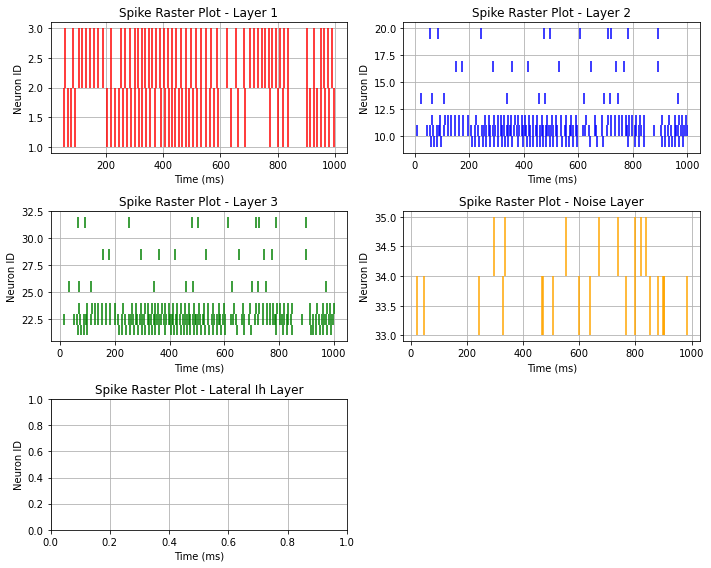

In [3]:
#A THREE LAYER CONNECTION WITH POISSON RATE 10
import numpy as np
import matplotlib.pyplot as plt
import nest


def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    plt.tight_layout()
    plt.savefig("SNNresults/Noise_raster_plot.png")
    plt.show()


def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 12)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)

    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l2l3 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}

    # Define the connections for neuron 1 of layer 1 to neurons of layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # Connect layer 2 to layer 3 individually
    for i in range(12):
        nest.Connect(neuron_layer2[i], neuron_layer3[i], "one_to_one", syn_spec=syn_spec_l2l3)

    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1, 4], 1: [7, 10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)

    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer)


# Call the function with the updated parameters
simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)


# A LAYER CONNECTION WITH GAUSSIAN NOISE(MEAN:1, STD:1)


Step 1/20
Step 2/20
Step 3/20
Step 4/20
Step 5/20
Step 6/20
Step 7/20
Step 8/20
Step 9/20
Step 10/20
Step 11/20
Step 12/20
Step 13/20
Step 14/20
Step 15/20
Step 16/20
Step 17/20
Step 18/20
Step 19/20
Step 20/20


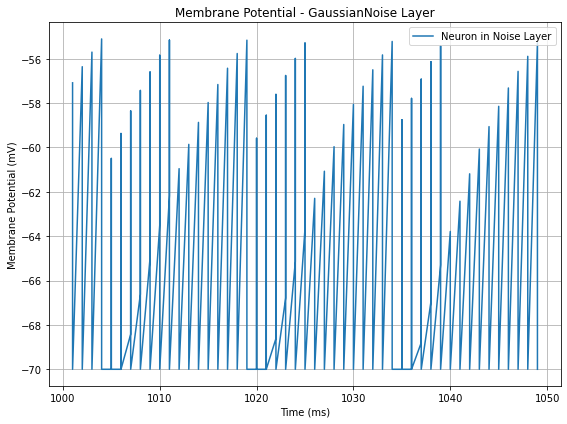

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Membrane potential not recorded for Neuron 1


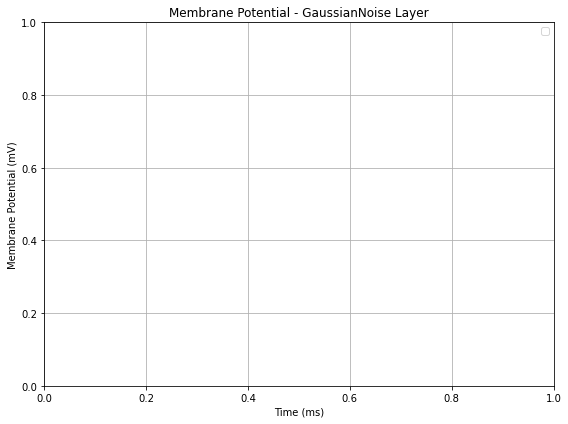

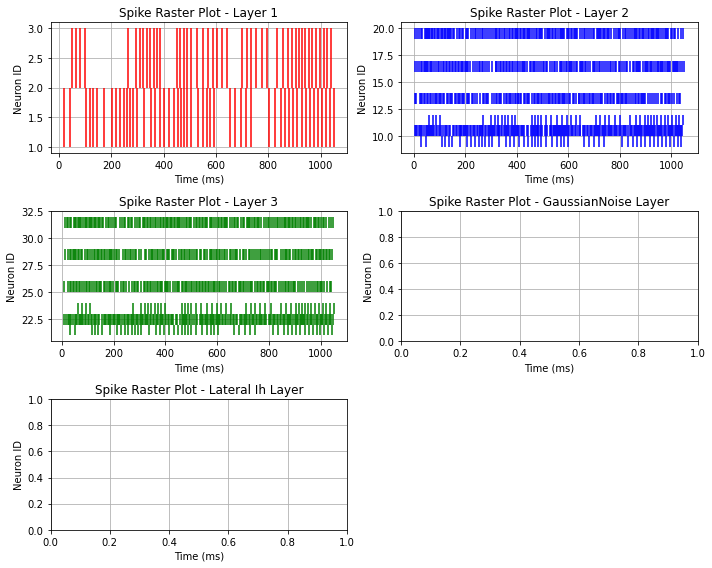

In [4]:
# A LAYER CONNECTION WITH GAUSSIAN NOISE(MEAN:1, STD:1)
import numpy as np
import matplotlib.pyplot as plt
import nest

def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - GaussianNoise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    plt.tight_layout()
    plt.savefig("SNNresults/Gaussian_Noise_raster_plot.png")
    plt.show()

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 12)
    noise_layer = nest.Create("noise_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)

    nest.SetStatus(noise_layer, {"mean": 1.0, "std": 1.0})
    noise_neurons = nest.Create("iaf_psc_alpha", 2)
    nest.Connect(noise_layer, noise_neurons, "one_to_one")

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_neurons, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l2l3 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}

    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    for i in range(12):
        nest.Connect(neuron_layer2[i], neuron_layer3[i], "one_to_one", syn_spec=syn_spec_l2l3)

    connection_mapping = {0: [1, 4], 1: [7, 10]}
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)

    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        random_currents = np.random.uniform(min_current, max_current, size=2)
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        nest.Simulate(simulation_duration)
    # Create multimeter for recording membrane potentials
    multimeter_noise_layer = nest.Create("multimeter", params={"record_from": ["V_m"]})
    nest.Connect(multimeter_noise_layer, noise_neurons)

    # Create multimeter spike recorders for each layer
    multimeter_recorder_layer1 = nest.Create("multimeter", params={"record_from": ["V_m"]})
    multimeter_recorder_layer2 = nest.Create("multimeter", params={"record_from": ["V_m"]})
    multimeter_recorder_layer3 = nest.Create("multimeter", params={"record_from": ["V_m"]})
    multimeter_recorder_lateral_ih_layer = nest.Create("multimeter", params={"record_from": ["V_m"]})

    # Connect multimeter spike recorders to the neurons
    nest.Connect(multimeter_recorder_layer1, neuron_layer1)
    nest.Connect(multimeter_recorder_layer2, neuron_layer2)
    nest.Connect(multimeter_recorder_layer3, neuron_layer3)
    nest.Connect(multimeter_recorder_lateral_ih_layer, lateral_ih_layer)

    # Simulate the network
    nest.Simulate(simulation_duration)

    # Retrieve membrane potential data from multimeters
    membrane_potential_noise_layer = nest.GetStatus(multimeter_noise_layer, "events")[0]
    membrane_potential_recorder_layer1 = nest.GetStatus(multimeter_recorder_layer1, "events")[0]
    membrane_potential_recorder_layer2 = nest.GetStatus(multimeter_recorder_layer2, "events")[0]
    membrane_potential_recorder_layer3 = nest.GetStatus(multimeter_recorder_layer3, "events")[0]
    membrane_potential_recorder_lateral_ih_layer = nest.GetStatus(multimeter_recorder_lateral_ih_layer, "events")[0]

    # Extract membrane potential data
    times_noise_layer = membrane_potential_noise_layer["times"]
    V_m_noise_layer = membrane_potential_noise_layer["V_m"]
    times_noise_layer =  membrane_potential_recorder_layer1["times"]
    V_m_noise_layer =  membrane_potential_recorder_layer1["V_m"]

    # Plot membrane potential data
    plt.figure(figsize=(8, 6))
    plt.plot(times_noise_layer, V_m_noise_layer, label="Neuron in Noise Layer")
    plt.xlabel("Time (ms)")
    plt.ylabel("Membrane Potential (mV)")
    plt.title("Membrane Potential - GaussianNoise Layer")
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    def plot_membrane_potential(spike_recorder, title):
        plt.figure(figsize=(8, 6))
        plt.title(title)
        plt.xlabel("Time (ms)")
        plt.ylabel("Membrane Potential (mV)")

        for i, recorder in enumerate(spike_recorder):
            events = nest.GetStatus(recorder, "events")[0]
            if "V_m" in events:  # Check if membrane potential is recorded
                plt.plot(events["times"], events["V_m"], label=f"Neuron {i + 1}")
            else:
                print(f"Membrane potential not recorded for Neuron {i + 1}")

        plt.legend()
        plt.grid()
        plt.tight_layout()
        plt.show()

    plot_membrane_potential(spike_recorder_noise_layer, "Membrane Potential - GaussianNoise Layer")

    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer)

# Call the function with the updated parameters
simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)


#### noisy layer : How many populations of neurons? How many neurons per populations? Which neuron models were used? What are the connectivity types? Provide a table with all the parameterisations for the neurons and synapses

A noisy layer must be implemented after the encoding phase, subjecting the encoded information to at least one type of noise. Use oe of the noise types listed below. Justify your choice and its impact on the SNN.

    spike_generator – Generate spikes from an array with spike-times
    spike_train_injector – Neuron that emits prescribed spike trains.
    noise_generator – Generate a Gaussian white noise current
    poisson_generator – Generate spikes with Poisson process statistics
    poisson_generator_ps – Simulated neuron firing with Poisson process statistics - precise spike timing version with arbitrary dead times
    pulsepacket_generator – Generate sequence of Gaussian pulse packets
    sinusoidal_gamma_generator – Generates sinusoidally modulated gamma spike trains
    sinusoidal_poisson_generator – Generate sinusoidally modulated Poisson spike trains


##### Neurons
| parameter | Description      | value or range | IS units | 
| --------- | -----------      | ---------------| -------- |
| population|Num population    |      1         |          |
| Neuron    |No of neuron      |      2
             per population   
|Neuron_model|poisson_generator|      2         |          |
| model      | Gaussian        |      2         |          |

##### Synapses
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
| weight    |synap weight |    1200        |          |


###### Connectivity details
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|conectivity| to layer 2  |   1:2          |          |
| Rate      | poisson_gen |    10          |          |
| mean      | Guassian    |     1          |          |
| std       | Guassian    |     1          |          |

 
###### Does the architecture changes during the training and inference phases? If you answer yes, explain why.

# A THREE LAYER NETWORK WITH LATERAL INHIBITION

Step 1/20
Step 2/20
Step 3/20
Step 4/20
Step 5/20
Step 6/20
Step 7/20
Step 8/20
Step 9/20
Step 10/20
Step 11/20
Step 12/20
Step 13/20
Step 14/20
Step 15/20
Step 16/20
Step 17/20
Step 18/20
Step 19/20
Step 20/20


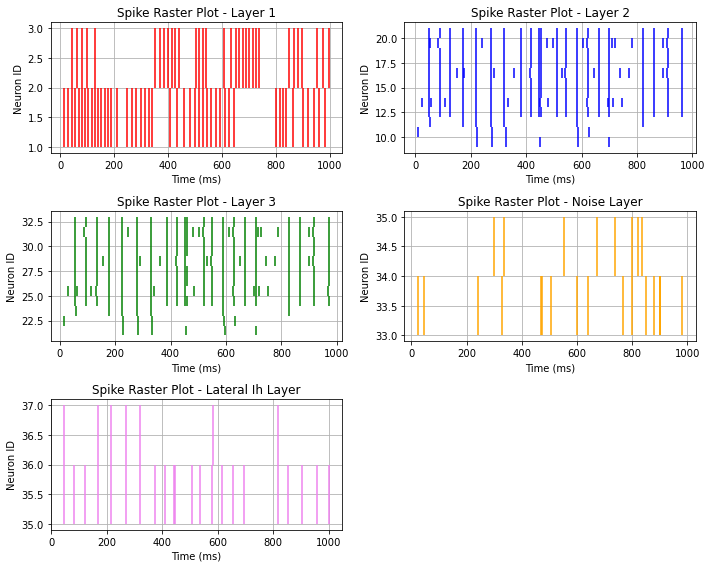

In [12]:
## A THREE LAYER NETWORK WITH LATERAL INHIBITION
import numpy as np
import matplotlib.pyplot as plt
import nest

def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    plt.tight_layout()
    plt.savefig("SNNresults/SNNwith_Static&Noise_raster_plot.png")
    plt.show()

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 12)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)

    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l1lih = {"weight": -1200.0}
    syn_spec_l2l3 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}
    syn_spec_l2ih = {"weight": 1200.0}
    syn_spec_ihl2 = {"weight": -600.0}


    # Define the connections for neuron 1 of layer 1 to neurons 1, 2, 3 of layer 2
    connections_layer1aih = [(neuron_layer1[0], lateral_ih_layer[i]) for i in range(2)]
    connections_layer1bih = [(neuron_layer1[1], lateral_ih_layer[i]) for i in range(1, )]
    connections_layer1cih = [(neuron_layer1[2], lateral_ih_layer[i]) for i in range(3, 5)]
    connections_layer1dih = [(neuron_layer1[3], lateral_ih_layer[i]) for i in range(4, 6)]
    connections_layer1eih = [(neuron_layer1[4], lateral_ih_layer[i]) for i in range(6, 8)]
    connections_layer1fih = [(neuron_layer1[5], lateral_ih_layer[i]) for i in range(7, 9)]
    connections_layer1gih = [(neuron_layer1[6], lateral_ih_layer[i]) for i in range(9, 11)]
    connections_layer1hih = [(neuron_layer1[7], lateral_ih_layer[i]) for i in range(11,15)]


    # Connect neuron 1 of layer 1 to neurons 1, 2, 3 of layer 2
    for connection in connections_layer1aih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2 )
    for connection in connections_layer1bih:
        nest.Connect(connection[0], connection[1],  syn_spec=syn_spec_l1l2)
    for connection in connections_layer1cih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1dih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1eih:
        nest.Connect(connection[0], connection[1],  syn_spec=syn_spec_l1l2)
    for connection in connections_layer1fih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1gih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1hih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

        # Define the connections for neuron 1 of layer 1 to neurons of layer 2

        # Define the connections for neuron 1 of layer 1 to neurons of layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

        # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)


    # Connect layer 2 to layer 3
    for i in range(12):
        nest.Connect(neuron_layer2[i], neuron_layer3[i], "one_to_one", syn_spec=syn_spec_l2l3)

    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1, 4], 1: [7, 10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)

    # compensation close loop approach with static synapses
    nest.Connect(lateral_ih_layer, neuron_layer2, syn_spec=syn_spec_l2ih) # ex
    nest.Connect(neuron_layer2, lateral_ih_layer, syn_spec=syn_spec_ihl2) #in


    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer)

# Call the function with the updated parameters
simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# A 3 LAYER NETWORK WITH STDP AND LATERAL INHIBITION

Step 1/20
Step 2/20
Step 3/20
Step 4/20
Step 5/20
Step 6/20
Step 7/20
Step 8/20
Step 9/20
Step 10/20
Step 11/20
Step 12/20
Step 13/20
Step 14/20
Step 15/20
Step 16/20
Step 17/20
Step 18/20
Step 19/20
Step 20/20
Synaptic weights from layer 1 to lateral inhibition layer (l1 to lih):
[[1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  1200. 1200. 1200. 1200. 1200.]
 [1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  1200. 1200. 1200. 1200. 1200.]
 [1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  1200. 1200. 1200. 1200. 1200.]
 [1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  1200. 1200. 1200. 1200. 1200.]
 [1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  1200. 1200. 1200. 1200. 1200.]
 [1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  1200. 1200. 1200. 1200. 1200.]
 [1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
  

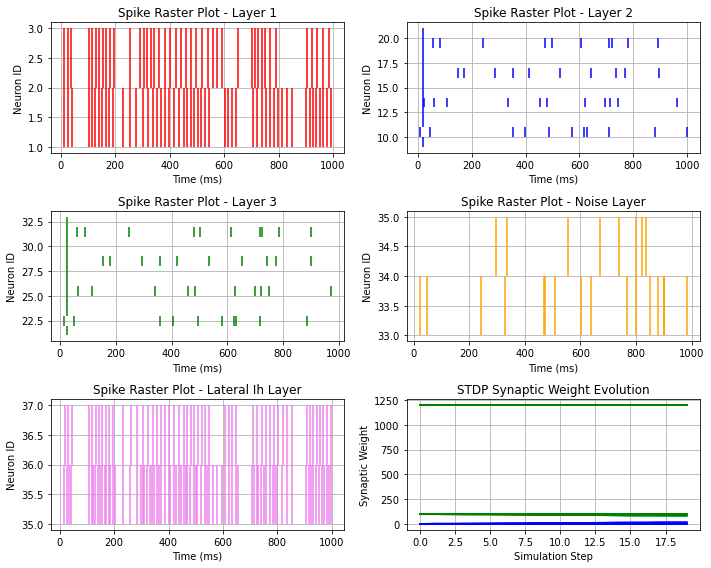

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import nest


def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer, weights):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    # STDP weights
    plt.subplot(3, 2, 6)
    plt.plot(weights[0], label='Layer 1 -> Ih Layer', color='red')
    plt.plot(weights[1], label='Layer 2 -> Ih Layer', color='blue')
    plt.plot(weights[2], label='Ih Layer -> Layer 2', color='green')
    plt.xlabel('Simulation Step')
    plt.ylabel('Synaptic Weight')
    plt.title('STDP Synaptic Weight Evolution')
    plt.grid()

    plt.tight_layout()
    plt.savefig("SNNresults/SNNwithSTDP_raster_plot.png")
    plt.show()

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 12)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)


    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l1lih = {"synapse_model": "stdp_synapse","weight": -1200.0}
    syn_spec_l2l3 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}
    syn_spec_l2ih = {"synapse_model": "stdp_synapse","weight": 1200.0}
    syn_spec_ihl2 = {"synapse_model": "stdp_synapse","weight": -600.0}

    # Define the connections for neuron 1-8 of layer 1 to neurons of layer 2
    connections_layer1aih = [(neuron_layer1[0], lateral_ih_layer[i]) for i in range(2)]
    connections_layer1bih = [(neuron_layer1[1], lateral_ih_layer[i]) for i in range(1, )]
    connections_layer1cih = [(neuron_layer1[2], lateral_ih_layer[i]) for i in range(3, 5)]
    connections_layer1dih = [(neuron_layer1[3], lateral_ih_layer[i]) for i in range(4, 6)]
    connections_layer1eih = [(neuron_layer1[4], lateral_ih_layer[i]) for i in range(6, 8)]
    connections_layer1fih = [(neuron_layer1[5], lateral_ih_layer[i]) for i in range(7, 9)]
    connections_layer1gih = [(neuron_layer1[6], lateral_ih_layer[i]) for i in range(9, 11)]
    connections_layer1hih = [(neuron_layer1[7], lateral_ih_layer[i]) for i in range(11, 15)]


    # Connect neuron 1-8 of layer1  to neurons of layer 2
    for connection in connections_layer1aih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1bih:
        nest.Connect(connection[0], connection[1],  syn_spec=syn_spec_l1l2)
    for connection in connections_layer1cih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1dih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1eih:
        nest.Connect(connection[0], connection[1],  syn_spec=syn_spec_l1l2)
    for connection in connections_layer1fih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1gih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer1hih:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)



    # Define the connections for neuron 1 of layer 1 to neurons of inh layer
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    # Connect neuron 1 of layer 1 to neurons of inh layer
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1lih)


    # Connect layer 2 to layer 3
    for i in range(12):
        nest.Connect(neuron_layer2[i], neuron_layer3[i], "one_to_one", syn_spec=syn_spec_l2l3)

    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1, 4], 1: [7, 10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)

    # compensation close loop approach with static synapses
    nest.Connect(lateral_ih_layer, neuron_layer2, syn_spec=syn_spec_l2ih) #ex
    nest.Connect(neuron_layer2, lateral_ih_layer, syn_spec=syn_spec_ihl2) #in

    # Define synaptic weight recording for STDP connections
    stdp_synapse_weights_l1lih = []
    stdp_synapse_weights_l2ih = []
    stdp_synapse_weights_ihl2 = []


    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)
        # Record synaptic weights after each simulation step
        stdp_synapse_weights_l1lih.append(nest.GetStatus(nest.GetConnections(neuron_layer1, lateral_ih_layer), "weight"))
        stdp_synapse_weights_l2ih.append(nest.GetStatus(nest.GetConnections(neuron_layer2, lateral_ih_layer), "weight"))
        stdp_synapse_weights_ihl2.append(nest.GetStatus(nest.GetConnections(lateral_ih_layer, neuron_layer2), "weight"))

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    # Convert lists to numpy arrays for easier manipulation
    stdp_synapse_weights_l1lih = np.array(stdp_synapse_weights_l1lih)
    stdp_synapse_weights_l2ih = np.array(stdp_synapse_weights_l2ih)
    stdp_synapse_weights_ihl2 = np.array(stdp_synapse_weights_ihl2)

    # Print or visualize the recorded synaptic weights
    print("Synaptic weights from layer 1 to lateral inhibition layer (l1 to lih):")
    print(stdp_synapse_weights_l1lih)

    print("Synaptic weights from layer 2 to lateral inhibition layer (l2 to lih):")
    print(stdp_synapse_weights_l2ih)

    print("Synaptic weights from lateral inhibition layer to layer 2 (lih to l2):")
    print(stdp_synapse_weights_ihl2)

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    weights=[stdp_synapse_weights_l1lih, stdp_synapse_weights_l2ih, stdp_synapse_weights_ihl2]
    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer, weights)


simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# SNN without lateral inhibition - ReSuMe

Step 1/20
Step 2/20
Step 3/20
Step 4/20
Step 5/20
Step 6/20
Step 7/20
Step 8/20
Step 9/20
Step 10/20
Step 11/20
Step 12/20
Step 13/20
Step 14/20
Step 15/20
Step 16/20
Step 17/20
Step 18/20
Step 19/20
Step 20/20


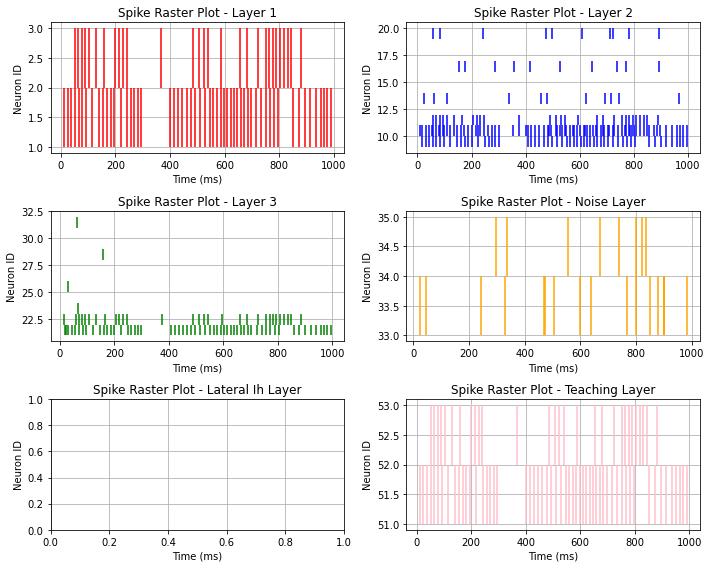

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import nest

def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer,
                senders_teaching_layer, ts_teaching_layer):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    # Teaching Layer
    plt.subplot(3, 2, 6)
    plt.title('Spike Raster Plot - Teaching Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_teaching_layer, ts_teaching_layer):
        plt.vlines(spike_time, sender, sender + 1, color='pink')

    plt.tight_layout()
    plt.savefig("results/Ex4_raster_plot.png")
    plt.show()

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 12)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)
    teaching_layer = nest.Create("iaf_psc_alpha", 12)

    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")
    spike_recorder_teaching = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)
    nest.Connect(teaching_layer, spike_recorder_teaching)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l2l3 = {"synapse_model": "stdp_synapse","weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}
    syn_spec_tll3 = {"weight": 1200.0}

    # Define the connections for neuron 1 of layer 1 to neurons 1, 2, 3 of layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]


    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # Connect layer 2 to layer 3 individually
    for i in range(11):
        nest.Connect(neuron_layer2[i], neuron_layer3[i], "one_to_one", syn_spec=syn_spec_l2l3)


    # Connect teaching layer to layer 3 individually
    for i in range(12):
        nest.Connect(teaching_layer[i], neuron_layer3[i], syn_spec=syn_spec_tll3)

   # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1, 4], 1: [7, 10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)


    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})
            nest.SetStatus(teaching_layer[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]
    events_teaching_layer = nest.GetStatus(spike_recorder_teaching, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    senders_teaching_layer = events_teaching_layer["senders"]
    ts_teaching_layer = events_teaching_layer["times"]

    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer,
                senders_teaching_layer,ts_teaching_layer)


simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# SNN WITHOUT LATERAL INHIBITION - ReSuMe, STDP

Step 1/50
Step 2/50
Step 3/50
Step 4/50
Step 5/50
Step 6/50
Step 7/50
Step 8/50
Step 9/50
Step 10/50
Step 11/50
Step 12/50
Step 13/50
Step 14/50
Step 15/50
Step 16/50
Step 17/50
Step 18/50
Step 19/50
Step 20/50
Step 21/50
Step 22/50
Step 23/50
Step 24/50
Step 25/50
Step 26/50
Step 27/50
Step 28/50
Step 29/50
Step 30/50
Step 31/50
Step 32/50
Step 33/50
Step 34/50
Step 35/50
Step 36/50
Step 37/50
Step 38/50
Step 39/50
Step 40/50
Step 41/50
Step 42/50
Step 43/50
Step 44/50
Step 45/50
Step 46/50
Step 47/50
Step 48/50
Step 49/50
Step 50/50
Purpura Distance between n0 in Layer 1 and n0 in Layer 3: 53.779889258331536
Purpura Distance between n1 in Layer 1 and n1 in Layer 3: 59.63045463102854
Rossum Metric between n0 in Layer 1 and n0 in Layer 3: 23.846165571581395
Rossum Metric between n1 in Layer 1 and n1 in Layer 3: 31.774581772797703


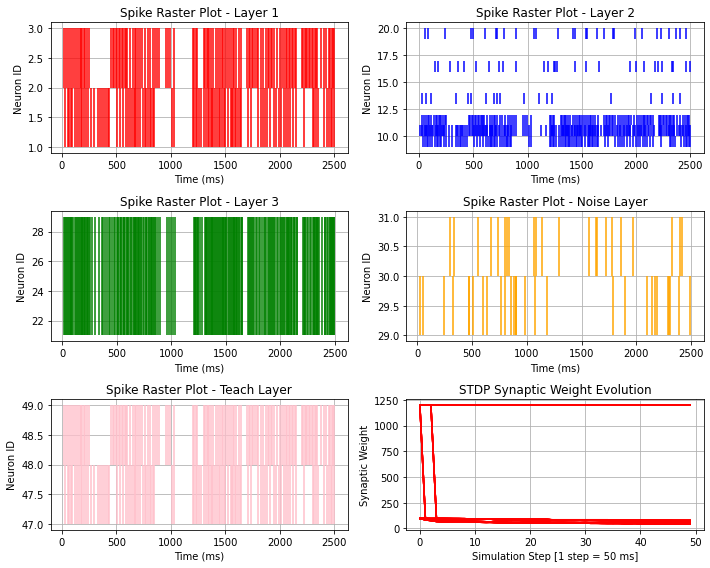

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import nest


def purpura_distance(spiketrains, cost):
    """
    Calculates the Victor-Purpura distance for a list of spike trains.

    Parameters:
        spiketrains (list of array-like): List of spike trains.
        cost (float): Cost parameter for the distance calculation.

    Returns:
        float: Victor-Purpura distance among the spike trains.
    """
    # Ensure spiketrains are sorted
    sorted_spiketrains = [np.sort(st) for st in spiketrains]

    # Initialize the Victor-Purpura distance
    distance = 0.0

    # Calculate the Victor-Purpura distance
    for i, st1 in enumerate(sorted_spiketrains):
        for j, st2 in enumerate(sorted_spiketrains):
            if i != j:  # Avoid self-comparison
                if len(st1) == 0 or len(st2) == 0:
                    continue  # Skip empty spike trains

                idx1, idx2 = 0, 0
                len_st1, len_st2 = len(st1), len(st2)

                while idx1 < len_st1 and idx2 < len_st2:
                    time_diff = st1[idx1] - st2[idx2]

                    if time_diff > 0:
                        distance += np.exp(-time_diff / cost)
                        idx2 += 1
                    elif time_diff < 0:
                        distance += np.exp(time_diff / cost)
                        idx1 += 1
                    else:
                        idx1 += 1
                        idx2 += 1

                # Add remaining spikes from longer spike train
                while idx1 < len_st1:
                    if len_st2 > 0:
                        distance += np.exp(-(st1[idx1] - st2[-1]) / cost)
                    else:
                        distance += np.exp(-(st1[idx1] - st1[-1]) / cost)
                    idx1 += 1

                while idx2 < len_st2:
                    if len_st1 > 0:
                        distance += np.exp(-(st1[-1] - st2[idx2]) / cost)
                    else:
                        distance += np.exp(-(st2[idx2] - st2[-1]) / cost)
                    idx2 += 1

    return distance

# Update the purpura_distance calls in your main code accordingly

# Example usage:
# spiketrain1 = np.array([10, 20, 30])
# spiketrain2 = np.array([15, 25, 35])
# spiketrain3 = np.array([5, 22, 33])
# cost = 1.0
# result = purpura_distance([spiketrain1, spiketrain2, spiketrain3], cost)
# print("Victor-Purpura distance:", result)


''''
    while i < len(spiketrain1) and j < len(spiketrain2):
        time_diff = spiketrain1[i] - spiketrain2[j]
        if time_diff > 0:
            distance += np.exp(-time_diff / cost)
            j += 1
        elif time_diff < 0:
            distance += np.exp(time_diff / cost)
            i += 1
        else:
            i += 1
            j += 1

    # Add remaining spikes from longer spike train
    while i < len(spiketrain1):
        distance += np.exp(-(spiketrain1[i] - spiketrain2[-1]) / cost)
        i += 1
    while j < len(spiketrain2):
        distance += np.exp(-(spiketrain1[-1] - spiketrain2[j]) / cost)
        j += 1
'''


def rossum_metric(*spiketrains, tau):
    """
    Calculates the van Rossum metric for a list of spike trains.

    Parameters:
        spiketrains (list of array-like): List of spike trains.
        tau (float): Time constant for the kernel function.

    Returns:
        float: van Rossum metric among the spike trains.
    """
    # Ensure spiketrains are sorted
    sorted_spiketrains = [np.sort(st) for st in spiketrains]

    # Initialize the van Rossum distance
    distance = 0.0

    # Calculate the van Rossum metric
    for i, st1 in enumerate(sorted_spiketrains):
        for j, st2 in enumerate(sorted_spiketrains):
            if i != j:  # Avoid self-comparison
                for spike_time1 in st1:
                    for spike_time2 in st2:
                        distance += np.exp(-np.abs(spike_time1 - spike_time2) / tau)

    return distance

def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_teach_layer, ts_teach_layer, weights):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Teach Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_teach_layer, ts_teach_layer):
        plt.vlines(spike_time, sender, sender + 1, color='pink')

    # STDP weights
    plt.subplot(3, 2, 6)
    plt.plot(weights, label='Layer 2 -> Layer 3', color='red')
    plt.xlabel('Simulation Step [1 step = 50 ms]')
    plt.ylabel('Synaptic Weight')
    plt.title('STDP Synaptic Weight Evolution')
    plt.grid()

    plt.tight_layout()
    plt.savefig("SNNresults/ReSuMe_raster_plot.png")
    plt.show()

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 8)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)
    teaching_layer = nest.Create("iaf_psc_alpha", 8)

    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")
    spike_recorder_teaching = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)
    nest.Connect(teaching_layer, spike_recorder_teaching)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l2l3 = {"synapse_model": "stdp_synapse", "weight": 1200.0}
    syn_spec_lnl2 = {"weight": 1200.0}
    syn_spec_tll3 = {"weight": 1200.0}

    # Define the connections for neuron 1 of layer 1 to neurons 1, 2, 3 of layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # connect all the neurons in layer 2 to layer 3
    nest.Connect(neuron_layer2, neuron_layer3,  syn_spec=syn_spec_l2l3)



    # Connect teaching layer to layer 3

    nest.Connect(teaching_layer, neuron_layer3,"all_to_all", syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[1], neuron_layer3[1], syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[2], neuron_layer3[2], syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[3], neuron_layer3[3], syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[4], neuron_layer3[4], syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[5], neuron_layer3[5], syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[6], neuron_layer3[6], syn_spec=syn_spec_tll3)
    # nest.Connect(teaching_layer[7], neuron_layer3[7], syn_spec=syn_spec_tll3)


    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1,4], 1: [7,10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)

    # Define synaptic weight recording for STDP connections
    stdp_synapse_weights_l2l3 = []

    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})
            nest.SetStatus(teaching_layer[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)
        stdp_synapse_weights_l2l3.append(nest.GetStatus(nest.GetConnections(neuron_layer2, neuron_layer3), "weight"))

        # Save the final synaptic weights to a file
        final_weights = stdp_synapse_weights_l2l3[-1]
        np.savetxt("weights.txt", final_weights, fmt='%.5f')

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]
    events_teaching_layer = nest.GetStatus(spike_recorder_teaching, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    senders_teaching_layer = events_teaching_layer["senders"]
    ts_teaching_layer = events_teaching_layer["times"]

    # Compute the purpura_distance and rossum_metric
    cost = 1.0  # You can adjust this parameter as needed
    tau = 1.0  # You can adjust this parameter as needed

    # Extract spike times for neurons n0 to n12 in Layer 1 and Layer 3
    n0_spikes_layer1 = events_layer1["times"][events_layer1["senders"] == neuron_layer1[0]]
    n1_spikes_layer1 = events_layer1["times"][events_layer1["senders"] == neuron_layer1[1]]


    n0_spikes_layer3 = events_layer3["times"][events_layer3["senders"] == neuron_layer3[0]]
    n1_spikes_layer3 = events_layer3["times"][events_layer3["senders"] == neuron_layer3[1]]


    purpura_distance_n0 = purpura_distance([n0_spikes_layer1, n0_spikes_layer3], cost)
    purpura_distance_n1 = purpura_distance([n1_spikes_layer1, n1_spikes_layer3], cost)


    rossum_metric_n0 = rossum_metric(n0_spikes_layer1, n0_spikes_layer3, tau=tau)
    rossum_metric_n1 = rossum_metric(n1_spikes_layer1, n1_spikes_layer3, tau=tau)


    print("Purpura Distance between n0 in Layer 1 and n0 in Layer 3:", purpura_distance_n0)
    print("Purpura Distance between n1 in Layer 1 and n1 in Layer 3:", purpura_distance_n1)

    # Similarly, fix the variable names for rossum_metric
    print("Rossum Metric between n0 in Layer 1 and n0 in Layer 3:", rossum_metric_n0)
    print("Rossum Metric between n1 in Layer 1 and n1 in Layer 3:", rossum_metric_n1)

    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_teaching_layer,ts_teaching_layer,stdp_synapse_weights_l2l3)


simulate_neural_network(num_steps=50, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# SNN WITH LATERAL INHIBITION - TRAINING USING ReSuMe

Step 1/200
Step 2/200
Step 3/200
Step 4/200
Step 5/200
Step 6/200
Step 7/200
Step 8/200
Step 9/200
Step 10/200
Step 11/200
Step 12/200
Step 13/200
Step 14/200
Step 15/200
Step 16/200
Step 17/200
Step 18/200
Step 19/200
Step 20/200
Step 21/200
Step 22/200
Step 23/200
Step 24/200
Step 25/200
Step 26/200
Step 27/200
Step 28/200
Step 29/200
Step 30/200
Step 31/200
Step 32/200
Step 33/200
Step 34/200
Step 35/200
Step 36/200
Step 37/200
Step 38/200
Step 39/200
Step 40/200
Step 41/200
Step 42/200
Step 43/200
Step 44/200
Step 45/200
Step 46/200
Step 47/200
Step 48/200
Step 49/200
Step 50/200
Step 51/200
Step 52/200
Step 53/200
Step 54/200
Step 55/200
Step 56/200
Step 57/200
Step 58/200
Step 59/200
Step 60/200
Step 61/200
Step 62/200
Step 63/200
Step 64/200
Step 65/200
Step 66/200
Step 67/200
Step 68/200
Step 69/200
Step 70/200
Step 71/200
Step 72/200
Step 73/200
Step 74/200
Step 75/200
Step 76/200
Step 77/200
Step 78/200
Step 79/200
Step 80/200
Step 81/200
Step 82/200
Step 83/200
Step 84/200
S

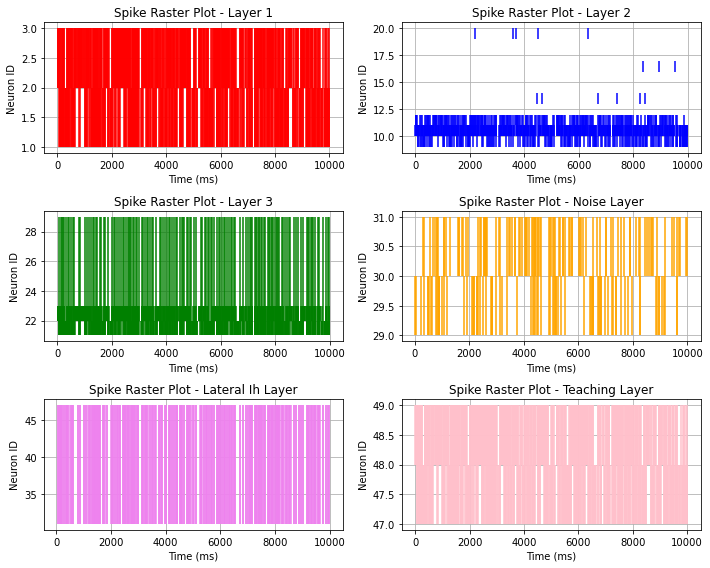

In [82]:
import numpy as np
import matplotlib.pyplot as plt
import os
import nest


def purpura_distance(spiketrains, cost):
    """
    Calculates the Victor-Purpura distance for a list of spike trains.

    Parameters:
        spiketrains (list of array-like): List of spike trains.
        cost (float): Cost parameter for the distance calculation.

    Returns:
        float: Victor-Purpura distance among the spike trains.
    """
    # Ensure spiketrains are sorted
    sorted_spiketrains = [np.sort(st) for st in spiketrains]

    # Initialize the Victor-Purpura distance
    distance = 0.0

    # Calculate the Victor-Purpura distance
    for i, st1 in enumerate(sorted_spiketrains):
        for j, st2 in enumerate(sorted_spiketrains):
            if i != j:  # Avoid self-comparison
                if len(st1) == 0 or len(st2) == 0:
                    continue  # Skip empty spike trains

                idx1, idx2 = 0, 0
                len_st1, len_st2 = len(st1), len(st2)

                while idx1 < len_st1 and idx2 < len_st2:
                    time_diff = st1[idx1] - st2[idx2]

                    if time_diff > 0:
                        distance += np.exp(-time_diff / cost)
                        idx2 += 1
                    elif time_diff < 0:
                        distance += np.exp(time_diff / cost)
                        idx1 += 1
                    else:
                        idx1 += 1
                        idx2 += 1

                # Add remaining spikes from longer spike train
                while idx1 < len_st1:
                    if len_st2 > 0:
                        distance += np.exp(-(st1[idx1] - st2[-1]) / cost)
                    else:
                        distance += np.exp(-(st1[idx1] - st1[-1]) / cost)
                    idx1 += 1

                while idx2 < len_st2:
                    if len_st1 > 0:
                        distance += np.exp(-(st1[-1] - st2[idx2]) / cost)
                    else:
                        distance += np.exp(-(st2[idx2] - st2[-1]) / cost)
                    idx2 += 1

    return distance

def rossum_metric(spiketrain1, spiketrain2, tau):
    """
    spiketrain1 and spiketrain2 are vectors containing the spike times of two spike trains.
    tau is a parameter that represents the time constant for the kernel function, which determines the weight of each
    spike time difference.
    The function calculates the van Rossum metric by iterating over all pairs of spike times from the two spike trains
    and summing the exponential decay of their absolute time differences.
    The result is the van Rossum metric, a measure of the similarity between the spike trains.

    Parameters:
        spiketrain1 (array-like): Spike times of the first spike train.
        spiketrain2 (array-like): Spike times of the second spike train.
        tau (float): Time constant for the kernel function.

    Returns:
        float: van Rossum metric between the two spike trains.
    """
    # Ensure spiketrains are sorted
    spiketrain1 = np.sort(spiketrain1)
    spiketrain2 = np.sort(spiketrain2)

    # Initialize the van Rossum distance
    distance = 0.0

    # Calculate the van Rossum metric
    for spike_time1 in spiketrain1:
        for spike_time2 in spiketrain2:
            distance += np.exp(-np.abs(spike_time1 - spike_time2) / tau)

    return distance
def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer,
                senders_teaching_layer,ts_teaching_layer):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    # Teaching Layer
    plt.subplot(3, 2, 6)
    plt.title('Spike Raster Plot - Teaching Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_teaching_layer, ts_teaching_layer):
        plt.vlines(spike_time, sender, sender + 1, color='pink')

    plt.tight_layout()
    plt.savefig("final_weights/_raster_plot.png")
    plt.show()

def save_weights(weights, filename):
    # Ensure the 'results' directory exists
    os.makedirs("final_weights", exist_ok=True)
    # Save the weights in NPY format

    weights.dump(os.path.join("final_weights", filename))
    # Save the weights in TXT format
    np.savetxt(os.path.join("final_weights", filename + ".txt"), weights)
def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 8)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)
    teaching_layer = nest.Create("iaf_psc_alpha", 8)


    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")
    spike_recorder_teaching = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)
    nest.Connect(teaching_layer, spike_recorder_teaching)


    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_l2l3 = {"synapse_model": "stdp_triplet_synapse", "weight": 400.0, "Wmax":900}
    syn_spec_lnl2 = {"weight": 800.0}
    syn_spec_tll3 = {"weight": 1200.0}
    syn_spec_ihl2 = {"weight": -100.0}
    syn_spec_l3ih = {"weight": 350.0}

    # Define the connections for neuron 1 of layer 1 to neuronsof layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # connect all the neurons in layer 2 to layer 3
    nest.Connect(neuron_layer2, neuron_layer3, syn_spec=syn_spec_l2l3)

    # Connect teaching layer to layer 3 individually
    nest.Connect(teaching_layer[0], neuron_layer3[0], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[1], neuron_layer3[1], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[2], neuron_layer3[2], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[3], neuron_layer3[3], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[4], neuron_layer3[4], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[5], neuron_layer3[5], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[6], neuron_layer3[6], syn_spec=syn_spec_tll3)
    nest.Connect(teaching_layer[7], neuron_layer3[7], syn_spec=syn_spec_tll3)

    # Connect L3 to Lateral Ih using probabilistic connectivity
    nest.Connect(neuron_layer3, lateral_ih_layer, syn_spec=syn_spec_l3ih)

    # Connect Lateral ih to L2 using ih synapses
    nest.Connect(lateral_ih_layer, neuron_layer2,  syn_spec=syn_spec_ihl2)


    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1,4], 1: [7,10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)


    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})
            nest.SetStatus(teaching_layer[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]
    events_teaching_layer = nest.GetStatus(spike_recorder_teaching, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    senders_teaching_layer = events_teaching_layer["senders"]
    ts_teaching_layer = events_teaching_layer["times"]

    # save final weights
    print("Saving weights ...")
    save_weights(np.asarray(nest.GetStatus(nest.GetConnections(neuron_layer2, neuron_layer3), "weight")),"weights_l2l3.npy")



    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer,
                senders_teaching_layer,ts_teaching_layer)


simulate_neural_network(num_steps=200, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# SNN WITH LATERAL INHIBITION - TRAINING USING ReSuMe WITHOUT NOISE

Loading weights ...
409.274827585585
407.43713467818924
400.61327558421027
400.61327558421027
400.61327558421027
400.61327558421027
400.61327558421027
400.61327558421027
400.9946776770006
400.9946776770006
400.9946776770006
400.9946776770006
421.03485961835827
426.2486944523928
400.9946776770006
400.9946776770006
400.61732667348963
400.61732667348963
413.1201598082911
407.16380516063407
400.61732667348963
400.61732667348963
400.61732667348963
400.61732667348963
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0283678594855
400.0283678594855
400.1668110592542
400.2766451174581
400.0283678594855
400.0283678594855
400.0283678594855
400.0283678594855
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0077536303211
400.0969254529989
400.0077536303211
400.0077536303211
400.0077536303211
400.0077536303211
400.0077536303211
400.057567627945
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.158

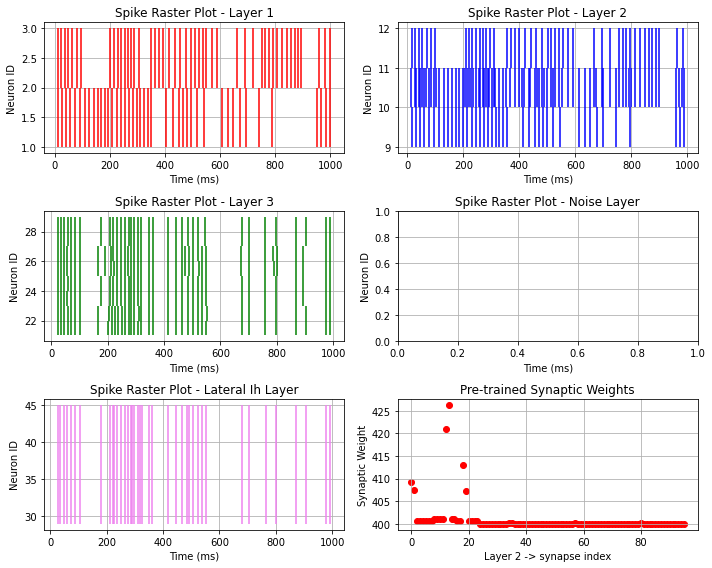

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import nest

def purpura_distance(spiketrain1, spiketrain2, cost):
    """
    spiketrain1 and spiketrain2 are vectors containing the spike times of two spike trains.
    cost is a parameter that determines the sensitivity of the distance calculation to the time differences between
    spikes.
    The function calculates the Victor-Purpura distance by iterating over the spike times of the two spike trains and
    summing exponential terms based on the time differences.
    The result is the Victor-Purpura distance, a measure of the dissimilarity between the spike trains.

    Parameters:
        spiketrain1 (array-like): Spike times of the first spike train.
        spiketrain2 (array-like): Spike times of the second spike train.
        cost (float): Cost parameter for the distance calculation.

    Returns:
        float: Victor-Purpura distance between the two spike trains.
    """
    # Ensure spiketrains are sorted
    spiketrain1 = np.sort(spiketrain1)
    spiketrain2 = np.sort(spiketrain2)

    # Initialize the Victor-Purpura distance
    distance = 0.0

    # Calculate the Victor-Purpura distance
    i = 0
    j = 0
    while i < len(spiketrain1) and j < len(spiketrain2):
        time_diff = spiketrain1[i] - spiketrain2[j]
        if time_diff > 0:
            distance += np.exp(-time_diff / cost)
            j += 1
        elif time_diff < 0:
            distance += np.exp(time_diff / cost)
            i += 1
        else:
            i += 1
            j += 1

    # Add remaining spikes from longer spike train
    while i < len(spiketrain1):
        distance += np.exp(-(spiketrain1[i] - spiketrain2[-1]) / cost)
        i += 1
    while j < len(spiketrain2):
        distance += np.exp(-(spiketrain1[-1] - spiketrain2[j]) / cost)
        j += 1

    return distance

def rossum_metric(spiketrain1, spiketrain2, tau):
    """
    spiketrain1 and spiketrain2 are vectors containing the spike times of two spike trains.
    tau is a parameter that represents the time constant for the kernel function, which determines the weight of each
    spike time difference.
    The function calculates the van Rossum metric by iterating over all pairs of spike times from the two spike trains
    and summing the exponential decay of their absolute time differences.
    The result is the van Rossum metric, a measure of the similarity between the spike trains.

    Parameters:
        spiketrain1 (array-like): Spike times of the first spike train.
        spiketrain2 (array-like): Spike times of the second spike train.
        tau (float): Time constant for the kernel function.

    Returns:
        float: van Rossum metric between the two spike trains.
    """
    # Ensure spiketrains are sorted
    spiketrain1 = np.sort(spiketrain1)
    spiketrain2 = np.sort(spiketrain2)

    # Initialize the van Rossum distance
    distance = 0.0

    # Calculate the van Rossum metric
    for spike_time1 in spiketrain1:
        for spike_time2 in spiketrain2:
            distance += np.exp(-np.abs(spike_time1 - spike_time2) / tau)

    return distance
def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer, weights):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    # STDP weights
    plt.subplot(3, 2, 6)
    plt.scatter(range(len(weights)), weights, label='Layer 2 -> Layer 3', color='red')
    plt.xlabel('Layer 2 -> synapse index')
    plt.ylabel('Synaptic Weight')
    plt.title('Pre-trained Synaptic Weights')
    plt.grid()

    plt.tight_layout()
    plt.savefig("results/Ex7_raster_plot.png")
    plt.show()

def load_weights(filename):
    """
    Load weights from an NPY file.

    Parameters:
        filename (str): The name of the NPY file containing the weights.

    Returns:
        ndarray: The loaded weights.
    """
    # Construct the file path
    file_path = os.path.join("final_weights", filename)

    # Load the weights from the NPY file
    try:
        weights = np.load(file_path,allow_pickle=True)
        return weights
    except FileNotFoundError:
        print(f"File '{file_path}' not found.")
        return None

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 8)
    #noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)
    teaching_layer = nest.Create("iaf_psc_alpha", 8)

    #nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    #nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 800.0}
    syn_spec_ihl2 = {"weight": -100.0}
    syn_spec_l3ih = {"weight": 300.0}

    # save final weights
    print("Loading weights ...")
    weights_l2l3=load_weights("weights_l2l3.npy")

    # Define the connections for neuron 1 of layer 1 to neurons of layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # connect all the neurons in layer 2 to layer 3
    for i in range(len(neuron_layer2)):
        for j in range(len(neuron_layer3)):
            weight_index = i * len(neuron_layer3) + j
            weight = weights_l2l3[weight_index]
            print(weight)
            nest.Connect(neuron_layer2[i], neuron_layer3[j], syn_spec={"weight": weight})



    nest.Connect(neuron_layer2, lateral_ih_layer, syn_spec=syn_spec_ihl2)

    # Connect Lateral L3 to IL using ih synapses
    nest.Connect(neuron_layer3, lateral_ih_layer, syn_spec=syn_spec_l3ih)

    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1,4], 1: [7,10]}

    # Connect the noisy neurons to specific neurons in layer 2
    #for noise_neuron, target_neurons in connection_mapping.items():
        #for target_neuron in target_neurons:
            #nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)


    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    # Compute the purpura_distance and rossum_metric
    cost = 1.0  # You can adjust this parameter as needed
    tau = 1.0  # You can adjust this parameter as needed

    # Extract spike times for neurons n0 and n1 in Layer 1 and Layer 3
    n0_spikes_layer1 = events_layer1["times"][events_layer1["senders"] == neuron_layer1[0]]
    n1_spikes_layer1 = events_layer1["times"][events_layer1["senders"] == neuron_layer1[1]]
    n0_spikes_layer3 = events_layer3["times"][events_layer3["senders"] == neuron_layer3[0]]
    n1_spikes_layer3 = events_layer3["times"][events_layer3["senders"] == neuron_layer3[1]]

    purpura_distance_n0 = purpura_distance(n0_spikes_layer1, n0_spikes_layer3, cost)
    purpura_distance_n1 = purpura_distance(n1_spikes_layer1, n1_spikes_layer3, cost)

    rossum_metric_n0 = rossum_metric(n0_spikes_layer1, n0_spikes_layer3, tau)
    rossum_metric_n1 = rossum_metric(n1_spikes_layer1, n1_spikes_layer3, tau)

    print("Purpura Distance between n0 in Layer 1 and n0 in Layer 3:", purpura_distance_n0)
    print("Purpura Distance between n1 in Layer 1 and n1 in Layer 3:", purpura_distance_n1)
    print("Rossum Metric between n0 in Layer 1 and n0 in Layer 3:", rossum_metric_n0)
    print("Rossum Metric between n1 in Layer 1 and n1 in Layer 3:", rossum_metric_n1)


    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer, weights_l2l3)



simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# INFERENCE USING PRE-TRAINED WEIGHTS

Loading weights ...
409.274827585585
407.43713467818924
400.61327558421027
400.61327558421027
400.61327558421027
400.61327558421027
400.61327558421027
400.61327558421027
400.9946776770006
400.9946776770006
400.9946776770006
400.9946776770006
421.03485961835827
426.2486944523928
400.9946776770006
400.9946776770006
400.61732667348963
400.61732667348963
413.1201598082911
407.16380516063407
400.61732667348963
400.61732667348963
400.61732667348963
400.61732667348963
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0283678594855
400.0283678594855
400.1668110592542
400.2766451174581
400.0283678594855
400.0283678594855
400.0283678594855
400.0283678594855
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0077536303211
400.0969254529989
400.0077536303211
400.0077536303211
400.0077536303211
400.0077536303211
400.0077536303211
400.057567627945
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.0
400.158

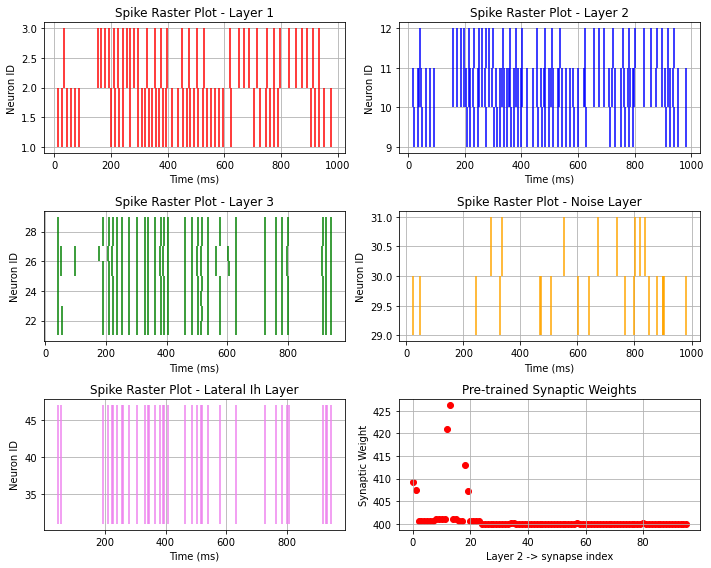

In [84]:
import numpy as np
import matplotlib.pyplot as plt
import os
import nest

def purpura_distance(spiketrain1, spiketrain2, cost):
    """
    spiketrain1 and spiketrain2 are vectors containing the spike times of two spike trains.
    cost is a parameter that determines the sensitivity of the distance calculation to the time differences between
    spikes.
    The function calculates the Victor-Purpura distance by iterating over the spike times of the two spike trains and
    summing exponential terms based on the time differences.
    The result is the Victor-Purpura distance, a measure of the dissimilarity between the spike trains.

    Parameters:
        spiketrain1 (array-like): Spike times of the first spike train.
        spiketrain2 (array-like): Spike times of the second spike train.
        cost (float): Cost parameter for the distance calculation.

    Returns:
        float: Victor-Purpura distance between the two spike trains.
    """
    # Ensure spiketrains are sorted
    spiketrain1 = np.sort(spiketrain1)
    spiketrain2 = np.sort(spiketrain2)

    # Initialize the Victor-Purpura distance
    distance = 0.0

    # Calculate the Victor-Purpura distance
    i = 0
    j = 0
    while i < len(spiketrain1) and j < len(spiketrain2):
        time_diff = spiketrain1[i] - spiketrain2[j]
        if time_diff > 0:
            distance += np.exp(-time_diff / cost)
            j += 1
        elif time_diff < 0:
            distance += np.exp(time_diff / cost)
            i += 1
        else:
            i += 1
            j += 1

    # Add remaining spikes from longer spike train
    while i < len(spiketrain1):
        distance += np.exp(-(spiketrain1[i] - spiketrain2[-1]) / cost)
        i += 1
    while j < len(spiketrain2):
        distance += np.exp(-(spiketrain1[-1] - spiketrain2[j]) / cost)
        j += 1

    return distance

def rossum_metric(spiketrain1, spiketrain2, tau):
    """
    spiketrain1 and spiketrain2 are vectors containing the spike times of two spike trains.
    tau is a parameter that represents the time constant for the kernel function, which determines the weight of each
    spike time difference.
    The function calculates the van Rossum metric by iterating over all pairs of spike times from the two spike trains
    and summing the exponential decay of their absolute time differences.
    The result is the van Rossum metric, a measure of the similarity between the spike trains.

    Parameters:
        spiketrain1 (array-like): Spike times of the first spike train.
        spiketrain2 (array-like): Spike times of the second spike train.
        tau (float): Time constant for the kernel function.

    Returns:
        float: van Rossum metric between the two spike trains.
    """
    # Ensure spiketrains are sorted
    spiketrain1 = np.sort(spiketrain1)
    spiketrain2 = np.sort(spiketrain2)

    # Initialize the van Rossum distance
    distance = 0.0

    # Calculate the van Rossum metric
    for spike_time1 in spiketrain1:
        for spike_time2 in spiketrain2:
            distance += np.exp(-np.abs(spike_time1 - spike_time2) / tau)

    return distance
def raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer, weights):
    plt.figure(figsize=(10, 8))

    # Layer 1
    plt.subplot(3, 2, 1)
    plt.title('Spike Raster Plot - Layer 1')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer1, ts_layer1):
        plt.vlines(spike_time, sender, sender + 1, color='red')

    # Layer 2
    plt.subplot(3, 2, 2)
    plt.title('Spike Raster Plot - Layer 2')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer2, ts_layer2):
        plt.vlines(spike_time, sender, sender + 1, color='blue')

    # Layer 3
    plt.subplot(3, 2, 3)
    plt.title('Spike Raster Plot - Layer 3')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_layer3, ts_layer3):
        plt.vlines(spike_time, sender, sender + 1, color='green')

    # Noise Layer
    plt.subplot(3, 2, 4)
    plt.title('Spike Raster Plot - Noise Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_noise_layer, ts_noise_layer):
        plt.vlines(spike_time, sender, sender + 1, color='orange')

    # Lateral Ih Layer
    plt.subplot(3, 2, 5)
    plt.title('Spike Raster Plot - Lateral Ih Layer')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.grid()
    for sender, spike_time in zip(senders_lateral_ih_layer, ts_lateral_ih_layer):
        plt.vlines(spike_time, sender, sender + 1, color='violet')

    # STDP weights
    plt.subplot(3, 2, 6)
    plt.scatter(range(len(weights)), weights, label='Layer 2 -> Layer 3', color='red')
    plt.xlabel('Layer 2 -> synapse index')
    plt.ylabel('Synaptic Weight')
    plt.title('Pre-trained Synaptic Weights')
    plt.grid()

    plt.tight_layout()
    plt.savefig("results/Ex7_raster_plot.png")
    plt.show()

def load_weights(filename):
    """
    Load weights from an NPY file.

    Parameters:
        filename (str): The name of the NPY file containing the weights.

    Returns:
        ndarray: The loaded weights.
    """
    # Construct the file path
    file_path = os.path.join("final_weights", filename)

    # Load the weights from the NPY file
    try:
        weights = np.load(file_path,allow_pickle=True)
        return weights
    except FileNotFoundError:
        print(f"File '{file_path}' not found.")
        return None

def simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0):
    # Reset the NEST simulator
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})

    # Create the neurons
    nest.SetDefaults("iaf_psc_alpha", {"I_e": 0.0})
    neuron_layer1 = nest.Create("iaf_psc_alpha", 8)
    neuron_layer2 = nest.Create("iaf_psc_alpha", 12)
    neuron_layer3 = nest.Create("iaf_psc_alpha", 8)
    noise_layer = nest.Create("poisson_generator", 2)
    lateral_ih_layer = nest.Create("iaf_psc_alpha", 16)
    teaching_layer = nest.Create("iaf_psc_alpha", 8)

    nest.SetStatus(noise_layer, {"rate": 10.0})  # Set the firing rate of the noisy neurons

    # Create spike recorders for each layer
    spike_recorder_layer1 = nest.Create("spike_recorder")
    spike_recorder_layer2 = nest.Create("spike_recorder")
    spike_recorder_layer3 = nest.Create("spike_recorder")
    spike_recorder_noise_layer = nest.Create("spike_recorder")
    spike_recorder_lateral_ih_layer = nest.Create("spike_recorder")

    # Connect the spike recorders to the neurons
    nest.Connect(neuron_layer1, spike_recorder_layer1)
    nest.Connect(neuron_layer2, spike_recorder_layer2)
    nest.Connect(neuron_layer3, spike_recorder_layer3)
    nest.Connect(noise_layer, spike_recorder_noise_layer)
    nest.Connect(lateral_ih_layer, spike_recorder_lateral_ih_layer)

    # Define connectivity between neurons
    syn_spec_l1l2 = {"weight": 1200.0}
    syn_spec_lnl2 = {"weight": 800.0}
    syn_spec_ihl2 = {"weight": -100.0}
    syn_spec_l3ih = {"weight": 350.0}

    # save final weights
    print("Loading weights ...")
    weights_l2l3=load_weights("weights_l2l3.npy")

    # Define the connections for neuron 1 of layer 1 to neuronsof layer 2
    connections_layer1 = [(neuron_layer1[0], neuron_layer2[i]) for i in range(2)]
    connections_layer2 = [(neuron_layer1[1], neuron_layer2[i]) for i in range(1, 3)]
    connections_layer3 = [(neuron_layer1[2], neuron_layer2[i]) for i in range(3, 5)]
    connections_layer4 = [(neuron_layer1[3], neuron_layer2[i]) for i in range(4, 6)]
    connections_layer5 = [(neuron_layer1[4], neuron_layer2[i]) for i in range(6, 8)]
    connections_layer6 = [(neuron_layer1[5], neuron_layer2[i]) for i in range(7, 9)]
    connections_layer7 = [(neuron_layer1[6], neuron_layer2[i]) for i in range(9, 11)]
    connections_layer8 = [(neuron_layer1[7], neuron_layer2[i]) for i in range(10, 12)]

    # Connect neuron 1 of layer 1 to neurons of layer 2
    for connection in connections_layer1:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer2:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer3:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer4:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer5:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer6:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer7:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)
    for connection in connections_layer8:
        nest.Connect(connection[0], connection[1], syn_spec=syn_spec_l1l2)

    # connect all the neurons in layer 2 to layer 3
    for i in range(len(neuron_layer2)):
        for j in range(len(neuron_layer3)):
            weight_index = i * len(neuron_layer3) + j
            weight = weights_l2l3[weight_index]
            print(weight)
            nest.Connect(neuron_layer2[i], neuron_layer3[j], syn_spec={"weight": weight})



    nest.Connect(neuron_layer2, lateral_ih_layer, syn_spec=syn_spec_ihl2)

    # Connect Lateral L3 to IL using ih synapses
    nest.Connect(neuron_layer3, lateral_ih_layer, syn_spec=syn_spec_l3ih)

    # Define the connections from noisy neurons to layer 2 neurons
    connection_mapping = {0: [1,4], 1: [7,10]}

    # Connect the noisy neurons to specific neurons in layer 2
    for noise_neuron, target_neurons in connection_mapping.items():
        for target_neuron in target_neurons:
            nest.Connect(noise_layer[noise_neuron], neuron_layer2[target_neuron], syn_spec=syn_spec_lnl2)


    for step in range(num_steps):
        print(f"Step {step + 1}/{num_steps}")

        # Generate random currents for neurons 1 and 2 in layer 1
        random_currents = np.random.uniform(min_current, max_current, size=2)

        # Apply the random currents to neurons in layer 1
        for i, current in enumerate(random_currents):
            nest.SetStatus(neuron_layer1[i], {"I_e": current})

        # Simulate the network for 50 ms
        nest.Simulate(simulation_duration)

    # Retrieve spike times from spike recorders
    events_layer1 = nest.GetStatus(spike_recorder_layer1, "events")[0]
    events_layer2 = nest.GetStatus(spike_recorder_layer2, "events")[0]
    events_layer3 = nest.GetStatus(spike_recorder_layer3, "events")[0]
    events_noise_layer = nest.GetStatus(spike_recorder_noise_layer, "events")[0]
    events_lateral_ih_layer = nest.GetStatus(spike_recorder_lateral_ih_layer, "events")[0]

    # Extract senders and spike times
    senders_layer1 = events_layer1["senders"]
    ts_layer1 = events_layer1["times"]

    senders_layer2 = events_layer2["senders"]
    ts_layer2 = events_layer2["times"]

    senders_layer3 = events_layer3["senders"]
    ts_layer3 = events_layer3["times"]

    senders_noise_layer = events_noise_layer["senders"]
    ts_noise_layer = events_noise_layer["times"]

    senders_lateral_ih_layer = events_lateral_ih_layer["senders"]
    ts_lateral_ih_layer = events_lateral_ih_layer["times"]

    # Compute the purpura_distance and rossum_metric
    cost = 1.0  # You can adjust this parameter as needed
    tau = 1.0  # You can adjust this parameter as needed

    # Extract spike times for neurons n0 and n1 in Layer 1 and Layer 3
    n0_spikes_layer1 = events_layer1["times"][events_layer1["senders"] == neuron_layer1[0]]
    n1_spikes_layer1 = events_layer1["times"][events_layer1["senders"] == neuron_layer1[1]]
    n0_spikes_layer3 = events_layer3["times"][events_layer3["senders"] == neuron_layer3[0]]
    n1_spikes_layer3 = events_layer3["times"][events_layer3["senders"] == neuron_layer3[1]]

    purpura_distance_n0 = purpura_distance(n0_spikes_layer1, n0_spikes_layer3, cost)
    purpura_distance_n1 = purpura_distance(n1_spikes_layer1, n1_spikes_layer3, cost)

    rossum_metric_n0 = rossum_metric(n0_spikes_layer1, n0_spikes_layer3, tau)
    rossum_metric_n1 = rossum_metric(n1_spikes_layer1, n1_spikes_layer3, tau)

    print("Purpura Distance between n0 in Layer 1 and n0 in Layer 3:", purpura_distance_n0)
    print("Purpura Distance between n1 in Layer 1 and n1 in Layer 3:", purpura_distance_n1)
    print("Rossum Metric between n0 in Layer 1 and n0 in Layer 3:", rossum_metric_n0)
    print("Rossum Metric between n1 in Layer 1 and n1 in Layer 3:", rossum_metric_n1)


    # Call the function with the senders and ts
    raster_plot(senders_layer1, ts_layer1, senders_layer2, ts_layer2, senders_layer3, ts_layer3,
                senders_noise_layer, ts_noise_layer, senders_lateral_ih_layer, ts_lateral_ih_layer,weights_l2l3)


simulate_neural_network(num_steps=20, simulation_duration=50.0, min_current=300.0, max_current=600.0)

# Audio_amplitude

Sound 01 Information:
Number of samples: 1311534
Length (seconds): 29.74
Minimum value: -9452
Maximum value: 9411


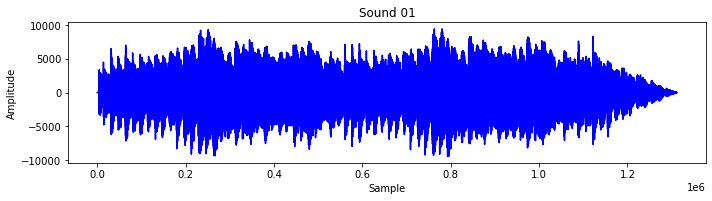

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from pydub import AudioSegment
import io
from scipy.io import wavfile

# Function to convert mp3 to wav and return its data
def read_mp3(filename):
    sound = AudioSegment.from_mp3(filename)
    with io.BytesIO() as wav_data:
        sound.export(wav_data, format="wav")
        wav_data.seek(0)
        rate, data = wavfile.read(wav_data)
    return rate, data

# Function to display sound file information
def display_info(data, rate):
    num_samples = len(data)
    length = len(data) / rate
    min_val = np.min(data)
    max_val = np.max(data)
    print("Number of samples:", num_samples)
    print("Length (seconds):", length)
    print("Minimum value:", min_val)
    print("Maximum value:", max_val)

# Read the mp3 files
rate1, data1 = read_mp3('/home/ntu-user/PycharmProjects/Assesment_3/audio.mp3')

# Display information about each sound file
print("Sound 01 Information:")
display_info(data1, rate1)


# Plot the data
plt.figure(figsize=(10, 5))

plt.subplot(2, 1, 1)
plt.plot(data1, color='blue')  # Plot data1 in blue
plt.title('Sound 01')
plt.xlabel('Sample')
plt.ylabel('Amplitude')



plt.tight_layout()
plt.show()

# Store the data in npy files
np.save('results/data1.npy', data1)
np.save('results/rate1.npy', rate1)


# Audio current for Index

In [5]:
import numpy as np

# Function to get current for a given index
def get_current_for_idx(idx):
    # Load the current_spikes_values from npy file
    current_spikes_values = np.load('results/current_spikes_values.npy')

    # Check if the index is within the valid range
    if 0 <= idx < len(current_spikes_values):
        return current_spikes_values[idx][0]
    else:
        raise ValueError("Index out of range")


#####################################
# test values from 0 to 9 - Neuron 0
#####################################
# Generate 20 random indices from 0 to 9, including 0
random_indices = np.random.randint(0, 10, size=20)

# Test the function for each random index
for idx in random_indices:
    try:
        current = get_current_for_idx(idx)
        print(f"Current for index {idx}: {current}")
    except ValueError as e:
        print(f"Error: {e}")

#######################################
# test values from 10 to 90 - Neuron 1
#######################################
# Generate 20 random values from 10 to 90
random_values = np.random.randint(10, 90, size=20)
# normlise values
# Test the function for each random index
for idx in random_values:
    try:
        current = get_current_for_idx(int(idx/10))
        print(f"Current for value {idx}: {current}")
    except ValueError as e:
        print(f"Error: {e}")


#########################################
# test values from 100 to 900 - Neuron 2
#########################################
# Generate 20 random values from 100 to 90
random_values = np.random.randint(100, 900, size=20)
# normlise values
# Test the function for each random index
for idx in random_values:
    try:
        current = get_current_for_idx(int(idx/100))
        print(f"Current for value {idx}: {current}")
    except ValueError as e:
        print(f"Error: {e}")

###########################################
# test values from 1000 to 9000 - Neuron 3
###########################################
# Generate 20 random values from 1000 to 9000
random_values = np.random.randint(1000, 9000, size=20)
# normlise values
# Test the function for each random index
for idx in random_values:
    try:
        current = get_current_for_idx(int(idx/1000))
        print(f"Current for value {idx}: {current}")
    except ValueError as e:
        print(f"Error: {e}")

############################################
# test values from 10000 to 90000 - Neuron 4
############################################
# Generate 20 random values from 10000 to 90000
random_values = np.random.randint(10000, 90000, size=20)
# normlise values
# Test the function for each random index
for idx in random_values:
    try:
        current = get_current_for_idx(int(idx/1000))
        print(f"Current for value {idx}: {current}")
    except ValueError as e:
        print(f"Error: {e}")

############################################
# test values from -1 to 1 - Neuron 5
############################################
# Generate 20 random values from 10000 to 90000
random_values = np.random.randint(-1, 2, size=20)
# normlise values
# Test the function for each random index
for idx in random_values:
    try:
        idx1=-idx
        if idx1<0:
            idx1=0
        current = get_current_for_idx(idx1)
        print(f"Current for value {idx}: {current}")
    except ValueError as e:
        print(f"Error: {e}")

Current for index 3: 480
Current for index 4: 504
Current for index 1: 379
Current for index 8: 508
Current for index 9: 509
Current for index 7: 507
Current for index 1: 379
Current for index 7: 507
Current for index 8: 508
Current for index 0: 378
Current for index 5: 505
Current for index 0: 378
Current for index 9: 509
Current for index 6: 506
Current for index 1: 379
Current for index 3: 480
Current for index 8: 508
Current for index 3: 480
Current for index 2: 414
Current for index 5: 505
Current for value 37: 480
Current for value 52: 505
Current for value 49: 504
Current for value 89: 508
Current for value 77: 507
Current for value 47: 504
Current for value 37: 480
Current for value 51: 505
Current for value 74: 507
Current for value 12: 379
Current for value 41: 504
Current for value 80: 508
Current for value 55: 505
Current for value 32: 480
Current for value 24: 414
Current for value 45: 504
Current for value 69: 506
Current for value 37: 480
Current for value 72: 507
Curren

In [6]:
#print value for currents
import numpy as np


# Function to get current for a given index
def get_current_for_idx(idx):
    # Load the current_spikes_values from npy file
    current_spikes_values = np.load('results/current_spikes_values.npy')

    # Check if the index is within the valid range
    if 0 <= idx < len(current_spikes_values):
        return current_spikes_values[idx][0]
    else:
        raise ValueError("Index out of range")

# Function to get currents for a given value
def get_currents_for_value(value):
    # Create an array to store currents for each neuron
    currents = np.zeros(6)

    # Normalize the value to be within the range of -99999 to 99999
    value = max(-99999, min(value, 99999))

    # Compute currents for each neuron
    if value >= 0:
        currents[5] = get_current_for_idx(0)  # Neuron 5: No spike for positive values
    else:
        currents[5] = get_current_for_idx(1)  # Neuron 5: Activate negative spike neuron
    currents[0] = get_current_for_idx(value % 10)  # Neuron 0: Increment of 1
    currents[1] = get_current_for_idx((value // 10) % 10)  # Neuron 1: Increment of 10
    currents[2] = get_current_for_idx((value // 100) % 10)  # Neuron 2: Increment of 100
    currents[3] = get_current_for_idx((value // 1000) % 10)  # Neuron 3: Increment of 1000
    currents[4] = get_current_for_idx((value // 10000) % 10)  # Neuron 4: Increment of 10000
    return currents

# Generate 30 random values between -99999 to 99999 (inclusive)
random_values = np.random.randint(-99999, 99999, size=30)

# Print the value and the currents for each neuron
for value in random_values:
    currents = get_currents_for_value(value)
    print(f"Value: {value}, Currents: {currents}")


Value: -89364, Currents: [506. 480. 506. 378. 379. 379.]
Value: 9332, Currents: [414. 480. 480. 509. 378. 378.]
Value: -98479, Currents: [379. 414. 505. 379. 378. 379.]
Value: 14965, Currents: [505. 506. 509. 504. 379. 378.]
Value: 7894, Currents: [504. 509. 508. 507. 378. 378.]
Value: 28043, Currents: [480. 504. 378. 508. 414. 378.]
Value: -35589, Currents: [379. 379. 504. 504. 506. 379.]
Value: -28950, Currents: [378. 505. 378. 379. 507. 379.]
Value: 49319, Currents: [509. 379. 480. 509. 504. 378.]
Value: -84373, Currents: [507. 414. 506. 505. 379. 379.]
Value: -13763, Currents: [507. 480. 414. 506. 508. 379.]
Value: -32334, Currents: [506. 506. 506. 507. 506. 379.]
Value: -32364, Currents: [506. 480. 506. 507. 506. 379.]
Value: 48022, Currents: [414. 414. 378. 508. 504. 378.]
Value: -21482, Currents: [508. 379. 505. 508. 507. 379.]
Value: -17106, Currents: [504. 509. 508. 414. 508. 379.]
Value: -35204, Currents: [506. 509. 507. 504. 506. 379.]
Value: -27256, Currents: [504. 504. 507

# Current spike values


              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.6.0
 Built: Nov 16 2023 09:28:21

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.

For 379 the number of spikes is 1
For 414 the number of spikes is 2
For 480 the number of spikes is 3
For 504 the number of spikes is 4
For 505 the number of spikes is 5
For 506 the number of spikes is 6
For 507 the number of spikes is 7
For 508 the number of spikes is 8
For 509 the number of spikes is 11
Result: [[378, 0], [379, 1], [414, 2], [480, 3], [504, 4], [505, 5], [506, 6], [507, 7], [508, 8], [509, 11]]


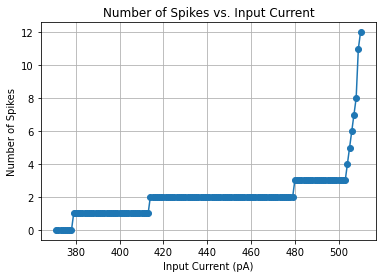

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import nest

# Reset the NEST kernel
nest.ResetKernel()
nest.set_verbosity(20)  # Set NEST verbosity level to 20

# Create a spike recorder
spike_recorder = nest.Create('spike_recorder')

# Initialize variables and lists
currents = []  # List to store input currents
spike_counts = []  # List to store spike counts
min_current = 0  # Variable to store the minimum current
inc = 1  # Increment value for increasing the current
current = 370  # Initial current value
num_spikes = 0  # Variable to store the number of spikes
neuron_params = {
    'C_m': 250.0,       # Membrane capacitance (pF)
    'tau_m': 10.0,      # Membrane time constant (ms)
    't_ref': 2.0,       # Refractory period (ms)
    'E_L': 0.0,         # Resting membrane potential (mV)
    'V_th': 20.0,       # Threshold potential (mV)
    'V_reset': 10.0,    # Reset potential (mV)
    'tau_syn_ex': 0.5,  # Excitatory synaptic time constant (ms)
    'tau_syn_in': 0.5   # Inhibitory synaptic time constant (ms)
}

# Create a single neuron with the IAF_PSC_ALPHA model
neuron = nest.Create('iaf_psc_alpha')

# List to store current and spike count pairs where number of spikes increased
current_spikes_values = [[0, 0]]
current_spikes_idx = 0  # Index for current_spikes_values list
actual_number_spikes = 0  # Actual number of spikes observed
number_spikes = 0  # Number of spikes observed

# Connect the neuron to the spike recorder
nest.Connect(neuron, spike_recorder)

# Loop through the input currents from 200 to 500 in increments of 10
while current < 800 and num_spikes < 12:
    nest.SetStatus(neuron, neuron_params)
    nest.SetStatus(spike_recorder, {'n_events': 0})
    neuron = nest.Create('iaf_psc_alpha')

    # Connect the neuron to the spike recorder
    nest.Connect(neuron, spike_recorder)

    # Set the input current to the neuron
    nest.SetStatus(neuron, {'I_e': current})
    current += inc  # Increment the current

    # Simulate for 50 ms
    nest.Simulate(50.0)

    # Get the number of spikes recorded by the spike recorder
    num_spikes = nest.GetStatus(spike_recorder, 'n_events')[0]

    # Store the current and spike count
    currents.append(current)
    spike_counts.append(num_spikes)

    # Record the current and spike count if the number of spikes increased
    if num_spikes == 0 and current > min_current:
        min_current = current
        current_spikes_values[0][0] = current
        number_spikes = 0
        current_spikes_idx = 1
    if num_spikes > 0:
        if num_spikes > actual_number_spikes:
            if len(current_spikes_values) < 10:
                current_spikes_values.append([current, num_spikes])
                actual_number_spikes = num_spikes
                print("For", current, "the number of spikes is", num_spikes)
            else:
                break

# Print the result
print("Result:", current_spikes_values)

# Save the current_spikes_values as npy file
np.save('results/current_spikes_values.npy', current_spikes_values)

# Plot the number of spikes for different increments
plt.plot(currents, spike_counts, marker='o')
plt.title('Number of Spikes vs. Input Current')
plt.xlabel('Input Current (pA)')
plt.ylabel('Number of Spikes')
plt.grid(True)
plt.show()

# SOUND ENCODING FOR 20 CHUNKS

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import nest
import time as tm  # Import time module with an alias
import h5py

# Function to chunk data into chunks of specified duration
def chunk_data(data, rate, duration_sec):
    chunk_size = int(rate * duration_sec)
    num_chunks = len(data) // chunk_size
    chunks = [data[i * chunk_size: (i + 1) * chunk_size] for i in range(num_chunks)]
    return chunks

# Function to plot data
def plot_data(data, title):
    plt.figure(figsize=(10, 5))
    plt.plot(data)
    plt.title(title)
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')
    plt.show()

# Function to plot raster plot
def raster_plot(raster_data, chunk_idx, num_total_neurons):
    plt.figure(figsize=(10, 5))
    plt.eventplot(raster_data, colors='black')
    plt.title(f'Raster Plot for Chunk {chunk_idx + 1}')
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron ID')
    plt.xlim(0, 50)  # Limit x-axis to 50 ms
    plt.ylim(0, num_total_neurons)
    plt.show()

def get_current_for_idx(idx):
    # Load the current_spikes_values from npy file
    current_spikes_values = np.load('results/current_spikes_values.npy')
    # Check if the index is within the valid range
    if 0 <= idx < len(current_spikes_values):
        return current_spikes_values[idx][0]
    else:
        raise ValueError("Index out of range")

# Function to get currents for a given value
def get_currents_for_value(value):
    # Create an array to store currents for each neuron
    currents = np.zeros(6)
    # Normalize the value to be within the range of -99999 to 99999
    value = max(-99999, min(value, 99999))
    # Compute currents for each neuron
    if value >= 0:
        currents[5] = get_current_for_idx(0)  # Neuron 5: No spike for positive values
    else:
        currents[5] = get_current_for_idx(1)  # Neuron 5: Activate negative spike neuron
    currents[0] = get_current_for_idx(value % 10)  # Neuron 0: Increment of 1
    currents[1] = get_current_for_idx((value // 10) % 10)  # Neuron 1: Increment of 10
    currents[2] = get_current_for_idx((value // 100) % 10)  # Neuron 2: Increment of 100
    currents[3] = get_current_for_idx((value // 1000) % 10)  # Neuron 3: Increment of 1000
    currents[4] = get_current_for_idx((value // 10000) % 10)  # Neuron 4: Increment of 10000
    return currents

# Function to simulate SNN and plot results
def simulate_snn(chunks, num_total_neurons, data_num):
    nest.ResetKernel()
    nest.set_verbosity(20)  # Set NEST verbosity level to 20
    nest.SetKernelStatus({'print_time': False})
    neuron_model = 'iaf_psc_alpha'
    pop_left = nest.Create(neuron_model, num_total_neurons, params=neuron_params)
    pop_right= nest.Create(neuron_model, num_total_neurons, params=neuron_params)
    spike_detector_left = nest.Create('spike_recorder')
    spike_detector_right = nest.Create('spike_recorder')

    nest.Connect(pop_left, spike_detector_left)
    nest.Connect(pop_right, spike_detector_right)

    # Limit the number of chunks to simulate to 20
    max_chunks = 20
    total_time = 0
    for chunk_idx, chunk in enumerate(chunks[:max_chunks]):
        print("Simulating chunk", (chunk_idx+1), "of", max_chunks, "...")
        start_time = tm.time()  # Use the imported time module alias
        neuron_idx = 0

        # Reset neuron parameters and spike recorder
        nest.SetStatus(pop_left, neuron_params)
        nest.SetStatus(pop_right, neuron_params)

        for sample in chunk:
            # Convert amplitude to current and scale to suitable range
            currents_left = get_currents_for_value(sample[0])
            currents_right = get_currents_for_value(sample[1])

            # Set the current to 6 neurons of the left channel
            for i in range(0,6):
                nest.SetStatus(pop_left[neuron_idx], {'I_e': currents_left[i]})
                nest.SetStatus(pop_right[neuron_idx], {'I_e': currents_right[i]})
                neuron_idx+=1

        nest.Simulate(50.0)  # Simulate for 50 ms

        end_time = tm.time()
        chunk_time = end_time - start_time
        total_time += chunk_time
        print(f"Chunk {chunk_idx+1} processing time: {chunk_time} seconds")

    # Get spike times
    events_left = spike_detector_left.get("events")
    senders_left = events_left["senders"]
    ts_left = events_left["times"]

    events_right = spike_detector_right.get("events")
    senders_right = events_right["senders"]
    ts_right = events_right["times"]

    np.save(f'results/data{data_num}_left_senders.npy', senders_left)
    np.save(f'results/data{data_num}_left_ts.npy', ts_left)
    np.save(f'results/data{data_num}_right_senders.npy', senders_right)
    np.save(f'results/data{data_num}_right_ts.npy', ts_right)
    # Save senders and timestamps in an HDF5 file
    filename = f"results/data{data_num}_spike_results.h5"
    with h5py.File(filename, "w") as file:
        file.create_dataset("senders_left", data=senders_left)
        file.create_dataset("ts_left", data=ts_left)
        file.create_dataset("senders_right", data=senders_right)
        file.create_dataset("ts_right", data=ts_right)
    print(f"Total processing time for data{data_num}: {total_time} seconds")

neuron_params = {
    'C_m': 250.0,       # Membrane capacitance (pF)
    'tau_m': 10.0,      # Membrane time constant (ms)
    't_ref': 2.0,       # Refractory period (ms)
    'E_L': 0.0,         # Resting membrane potential (mV)
    'V_th': 20.0,       # Threshold potential (mV)
    'V_reset': 10.0,    # Reset potential (mV)
    'tau_syn_ex': 0.5,  # Excitatory synaptic time constant (ms)
    'tau_syn_in': 0.5   # Inhibitory synaptic time constant (ms)
}

# Load the data from npy files
data1 = np.load('results/data1.npy')
rate1 = np.load('results/rate1.npy')

# Chunk the data into chunks of 1/30 second
chunk_duration = 1 / 30  # seconds
chunks1 = chunk_data(data1, rate1, chunk_duration)

num_samples1 = len(chunks1[0])

num_neurons_per_sample = 6 # 6 neurons per channel, 2 channels

for chunks, num_samples, data_num in zip([chunks1], [num_samples1], [1, 2]):
    num_total_neurons = num_samples * num_neurons_per_sample
    # Simulate SNN for each chunk of data
    simulate_snn(chunks, num_total_neurons, data_num)


Simulating chunk 1 of 20 ...
Chunk 1 processing time: 6.892369270324707 seconds
Simulating chunk 2 of 20 ...
Chunk 2 processing time: 7.210847616195679 seconds
Simulating chunk 3 of 20 ...
Chunk 3 processing time: 7.185023784637451 seconds
Simulating chunk 4 of 20 ...
Chunk 4 processing time: 7.267878293991089 seconds
Simulating chunk 5 of 20 ...
Chunk 5 processing time: 7.211326360702515 seconds
Simulating chunk 6 of 20 ...
Chunk 6 processing time: 7.166911602020264 seconds
Simulating chunk 7 of 20 ...
Chunk 7 processing time: 7.154198884963989 seconds
Simulating chunk 8 of 20 ...
Chunk 8 processing time: 7.209580183029175 seconds
Simulating chunk 9 of 20 ...
Chunk 9 processing time: 7.281338691711426 seconds
Simulating chunk 10 of 20 ...
Chunk 10 processing time: 7.224239110946655 seconds
Simulating chunk 11 of 20 ...
Chunk 11 processing time: 7.239349126815796 seconds
Simulating chunk 12 of 20 ...
Chunk 12 processing time: 7.1805219650268555 seconds
Simulating chunk 13 of 20 ...
Chu

# SOUND RECONSTRUCTION 

0 8818
1 8819
++++++++++++++++++ Processing data1... +++++++++++++++++++++++
Starting normalisation ...
Processing left...
Left completed ...
Processing right...
Normalisation completed!
Preparing left raster plot...
Preparing right raster plot...


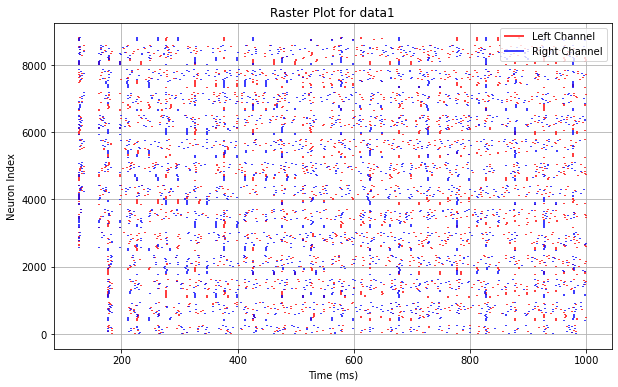

In [55]:
import numpy as np
import matplotlib.pyplot as plt

# Function to chunk data into chunks of specified duration
def chunk_data_info(data, rate, duration_sec):
    chunk_size = int(rate * duration_sec)
    num_chunks = len(data) // chunk_size
    return num_chunks, chunk_size
def create_normalised_3D_matrix(data_name, times_left, senders_left, times_right, senders_right, rows, cols):
    normalised_3Dmat = np.zeros((rows, cols, 2))
    print("Starting normalisation ...\nProcessing left...")
    for i in range(len(times_left)):
        normalised_3Dmat[int(senders_left[i]), int(np.round(times_left[i], 0)), 0] = 1.0  # left
    print("Left completed ...\nProcessing right...")
    for i in range(len(times_right)):
        normalised_3Dmat[int(senders_right[i] - 1), int(np.round(times_right[i], 0)), 1] = 1.0  # right
    np.save(f"sound_normalise_3d/normalised_3Dmat_{data_name}.npy", normalised_3Dmat, allow_pickle=True)
    print("Normalisation completed!")
    return normalised_3Dmat.astype(bool)



def raster_plot(normalised_3D_matrix, data):
    """
    Plot raster plot for spike events split between left and right channels.

    Parameters:
        normalised_3D_matrix (numpy.ndarray): 3D matrix split between left and right channels.
        data_num (int): Identifier for the data set.

    Returns:
        None
    """
    print("Preparing left raster plot...")
    num_neurons = normalised_3D_matrix.shape[0]

    # Plot raster plot for left channel
    plt.figure(figsize=(10, 6))
    for neuron_idx in range(num_neurons):
        left_spikes = np.where(normalised_3D_matrix[neuron_idx, :,0])[0]
        plt.vlines(left_spikes, neuron_idx, neuron_idx + 1, color='red', label='Left Channel' if neuron_idx == 0 else None)
    print("Preparing right raster plot...")
    # Plot raster plot for right channel
    for neuron_idx in range(num_neurons):
        right_spikes = np.where(normalised_3D_matrix[neuron_idx, :,1])[0]
        plt.vlines(right_spikes, neuron_idx, neuron_idx + 1, color='blue', label='Right Channel' if neuron_idx == 0 else None)
    plt.xlabel('Time (ms)')
    plt.ylabel('Neuron Index')
    plt.title(f'Raster Plot for {data}')
    plt.legend()
    plt.grid()
    plt.savefig(f"sound_raster_plot/{data}_raster_plot.png")
    plt.show()

# Load the data from npy files
data1 = np.load('results/data1.npy')
rate1 = np.load('results/rate1.npy')
senders_left=[]
ts_left=[]
senders_right=[]
ts_right=[]
for data_num in ["1"]:
    senders_left.append(np.load(f'results/data{data_num}_left_senders.npy'))
    ts_left.append(np.load(f'results/data{data_num}_left_ts.npy'))
    senders_right.append(np.load(f'results/data{data_num}_right_senders.npy'))
    ts_right.append(np.load(f'results/data{data_num}_right_ts.npy'))

data_shape=[data1.shape]

reconstructed_data1=np.zeros(data_shape[0])

num_neurons_per_sample = 6
samp_period=1/30
time_step=60

data1_num_chunks, data1_chunk_size=chunk_data_info(data1,rate1,samp_period)
num_total_neurons = [data1_chunk_size * num_neurons_per_sample]
senders_left[0]=senders_left[0]-1 # normalisation
senders_right[0]=senders_right[0]-num_total_neurons[0] # normalisation
print(np.min(senders_left[0]),np.max(senders_left[0]))
print(np.min(senders_right[0]),np.max(senders_right[0]))


datas=["data1"]

# print(data1_num_total_neurons)
for i in range(len(datas)):
    print(f"++++++++++++++++++ Processing {datas[i]}... +++++++++++++++++++++++")
    num_cols = int(np.max([np.max(ts_left[i]), np.max(ts_right[i])])) + 1
    normalised_3Dmat=create_normalised_3D_matrix(datas[i],ts_left[i],senders_left[i],ts_right[i],senders_right[i],num_total_neurons[i],num_cols)
    raster_plot(normalised_3Dmat, datas[i])

# SOUND DECODING

Processing simualtion time-steps: 100%|█████████| 20/20 [00:45<00:00,  2.25s/it]


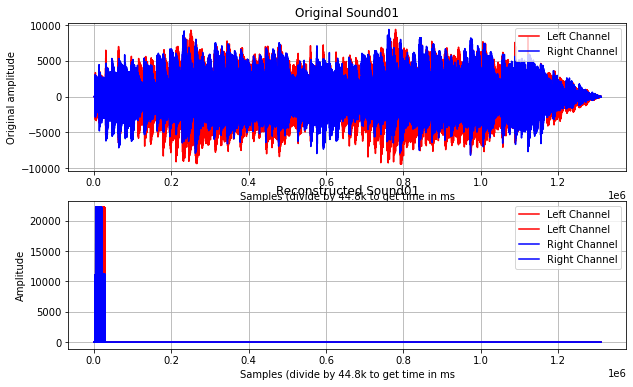

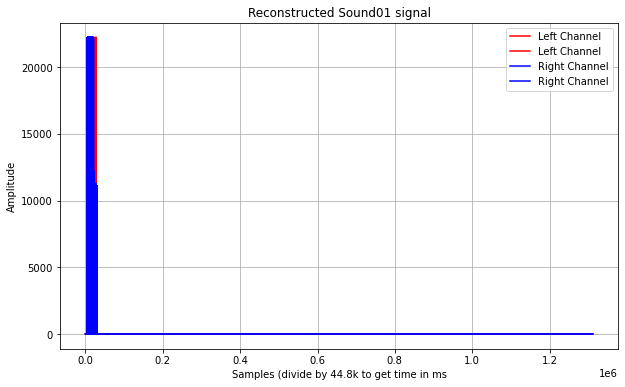

In [64]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

def get_idx_for_spike_count(spike_count):
    """
    This function takes a spike count and returns the index if it exists in the current_spikes_values numpy array.
    If the spike count does not exist in the array, it returns -1.

    Parameters:
        spike_count (int): The spike count to search for.

    Returns:
        int: The index if the spike count exists, otherwise -1.
    """
    # Load the current_spikes_values from npy file
    spike_values = np.load('results/current_spikes_values.npy')[:, 1]

    # Iterate through the current_spikes_values array to find the index corresponding to the spike count
    for i in range(0,len(spike_values)):
        if spike_values[i] == spike_count:
            return i
    return -1

    # If the spike count does not exist in the array, return -1
    return -1

def reconstruct_value_from_values(values):
    """
    Reconstructs the value from the given vector of values.

    Parameters:
        currents (numpy.ndarray): Array containing currents for each neuron.

    Returns:
        int: Reconstructed value.
    """
    # Extract the indices of the spike counts corresponding to the given currents
    idx_neuron0 = get_idx_for_spike_count(values[0])
    idx_neuron1 = get_idx_for_spike_count(values[1])
    idx_neuron2 = get_idx_for_spike_count(values[2])
    idx_neuron3 = get_idx_for_spike_count(values[3])
    idx_neuron4 = get_idx_for_spike_count(values[4])
    idx_neuron5 = get_idx_for_spike_count(values[5])

    # Reconstruct the value based on the indices
    value = idx_neuron0 + \
            idx_neuron1 * 10 + \
            idx_neuron2 * 100 + \
            idx_neuron3 * 1000 + \
            idx_neuron4 * 10000

    # Check if the value should be negative
    if idx_neuron5 == 1:
        value *= -1
    return value


def calculate_spike_counts(neuron_matrix):
    """
    Calculate the spike counts for each neuron in a matrix.

    Parameters:
        neuron_matrix (numpy.ndarray): Matrix representing spike events of 6 neurons over 50 ms.

    Returns:
        numpy.ndarray: A vector containing the spike counts for each neuron.
    """
    # Sum along the columns to count spikes for each neuron
    spike_counts = np.sum(neuron_matrix, axis=1)
    return spike_counts

def reconstruct_value(normalised_3Dmat, x, y, data):
    """
    Reconstructs the value from a chunk of 6 neurons and 50 ms of simulation.

    Parameters:
        normalised_3Dmat (numpy.ndarray): 3D matrix containing spike events split between left and right channels.
        x (int): Number of chunks along the time axis.
        y (int): Number of chunks along the neuron axis.

    Returns:
        numpy.ndarray: Reconstructed values for each chunk.
    """
    simulation_ts = 52  # ms
    number_neurons_sample = 6
    reconstructed_vector = np.zeros((x, y, 2))

    # Extract the chunk of spike events for the given chunk index
    idx = 0
    for ts in tqdm(range(0, normalised_3Dmat.shape[1], simulation_ts), desc="Processing simualtion time-steps"):
        for neuron in range(0, normalised_3Dmat.shape[0], number_neurons_sample):
            chunk_left = normalised_3Dmat[neuron:neuron + number_neurons_sample, ts:ts + simulation_ts, 0]
            spike_counts_left = np.sum(chunk_left, axis=1)
            reconstructed_value_left = reconstruct_value_from_values(spike_counts_left)

            chunk_right = normalised_3Dmat[neuron:neuron + number_neurons_sample, ts:ts + simulation_ts, 1]
            spike_counts_right = np.sum(chunk_right, axis=1)
            reconstructed_value_right = reconstruct_value_from_values(spike_counts_right)

            reconstructed_vector[idx, 0] = reconstructed_value_left
            reconstructed_vector[idx, 1] = reconstructed_value_right
            idx += 1
    reconstructed_vector.dump(f"reconstructedSounds/reconstructed_{data}.npy")
    return reconstructed_vector

def plot_reconstructed_vector(reconstructed_data, original_data,data_name):
    """
    Plot the reconstructed vector.

    Parameters:
        reconstructed_vector (numpy.ndarray): Reconstructed values for each chunk.
        data_num (int): Identifier for the data set.

    Returns:
        None
    """
    plt.figure(figsize=(10, 6))
    plt.subplot(2, 1, 1)
    plt.plot(original_data[:, 0], label='Left Channel', color='red')
    plt.plot(original_data[:, 1], label='Right Channel', color='blue')
    plt.xlabel('Samples (divide by 44.8k to get time in ms')
    plt.ylabel('Original amplitude')
    plt.title(f'Original {data_name}')
    plt.legend()
    plt.grid()
    plt.subplot(2,1,2)
    plt.plot(reconstructed_data[:, 0], label='Left Channel', color='red')
    plt.plot(reconstructed_data[:, 1], label='Right Channel', color='blue')
    plt.xlabel('Samples (divide by 44.8k to get time in ms')
    plt.ylabel('Amplitude')
    plt.title(f'Reconstructed {data_name}')
    plt.legend()
    plt.grid()
    plt.savefig(f"results/{data_name}_results.png")
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(reconstructed_data[:, 0], label='Left Channel', color='red')
    plt.plot(reconstructed_data[:, 1], label='Right Channel', color='blue')
    plt.xlabel('Samples (divide by 44.8k to get time in ms')
    plt.ylabel('Amplitude')
    plt.title(f'Reconstructed {data_name} signal')
    plt.legend()
    plt.grid()
    plt.savefig(f"reconstructedSounds/reconstructed_{data_name}.png")
    plt.show()

data_names = ["Sound01"]
original_signals=[np.load('results/data1.npy')]
original_rates=[np.load('results/rate1.npy')]
normalised_3Dmats=[np.load("sound_normalise_3d/normalised_3Dmat_data1.npy", allow_pickle=True)]


for i in range(len(data_names)):
    reconstructed_matrix=reconstruct_value(normalised_3Dmats[i],original_signals[i].shape[0],original_signals[i].shape[1],data_names[i])
    plot_reconstructed_vector(reconstructed_matrix, original_signals[i], data_names[i])

#### lateral inhibition layer : How many populations of neurons? How many neurons per populations? Which neuron models were used? What are the connectivity types? Provide a table with all the parameterisations for the neurons and synapses
Use  one of the following neuron models:

    iaf_psc_exp – Leaky integrate-and-fire neuron model with exponential PSCs
    iaf_psc_alpha – Leaky integrate-and-fire model with alpha-shaped input currents
    izhikevich – Izhikevich neuron model
    mat2_psc_exp – Non-resetting leaky integrate-and-fire neuron model with exponential PSCs and adaptive threshold
    parrot_neuron_ps – Neuron that repeats incoming spikes - precise spike timing version
    
Lateral Inhibition and Synaptic Time Delays: Implement lateral inhibition within the SNN architecture to enhance competition among neighboring neurons, refining the encoding and decoding processes. Incorporate synapses with different time delays in the network, allowing for varied temporal interactions between neurons. Discuss the rationale behind the choice of time delays and their impact on information processing within the spiking neural network.


##### Neurons
| parameter | Description      | value or range | IS units | 
| --------- | -----------      | ---------------| -------- |
| Model     |Neuron model      | iaf_psc_alpha  |          |
| Num_Layer1|iaf_psc_alpha     |       8               
| Num_Layer2|iaf_psc_alpha     |      12        |          |
| Num_Layer3|iaf_psc_alpha     |      12        |          |
| Num_LatIh |iaf_psc_alpha     |      16        |          | 
  
 
 
##### Synapses
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|Weight_L1L2|Layer1-Layer2|    1200        |          |
|Weight_L2L3|   STDPL2L3  | 400-900 (STDP) |          |
|Weight_LIL2|LatInh-Layer2|   -100         |          |
|Weight_L3LI|Layer3-LatInh| 350            |          |


###### Connectivity details
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|LateralIh  | Layer2      |    All-All     |Inhibitory|
| Layer3    | LateralIh   |    All-All     |Excitatory|
| Teaching  | Layer 3     |                |Excitatory|

###### Does the architecture changes during the training and inference phases? If you answer yes, explain why.

#### layer 3 (decoding layer): How many populations of neurons? How many neurons per populations? Which neuron models were used? What are the connectivity types? Provide a table with all the parameterisations for the neurons and synapses


1. Engineer a decoding layer as the third segment, strategically designed to efficiently recover both audio and image from the encoded information.
2. Employ a sophisticated approach by incorporating inhibitory and excitatory synapses in the training process. Leverage either unsupervised or supervised learning to train the decoding layer, optimising the interplay between these synapses for enhanced performance.
Use  one of the following neuron models:

    iaf_psc_exp – Leaky integrate-and-fire neuron model with exponential PSCs
    iaf_psc_alpha – Leaky integrate-and-fire model with alpha-shaped input currents
    izhikevich – Izhikevich neuron model
    mat2_psc_exp – Non-resetting leaky integrate-and-fire neuron model with exponential PSCs and adaptive threshold
    parrot_neuron_ps – Neuron that repeats incoming spikes - precise spike timing version

Synaptic Learning in Decoding Layer:  Inhibitory and excitatory synapses must be incorporated in the training process of the decoding layer, leveraging either unsupervised or supervised learning. The interplay between these synapses should be optimised for enhanced performance.

Types of Synapses:

    stdp_synapse – Synapse type for spike-timing dependent plasticity
    static_synapse – Synapse type for static connections


##### Neurons
| parameter | Description      | value or range | IS units | 
| --------- | -----------      | ---------------| -------- |
| Model     |Neuron model      | iaf_psc_alpha  |          |
| Num_Layer3| Decoding Layer   |      12               

  
 
 
##### Synapses
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|Weight_L2L3|L2-Decoding  |    12          |          |
|Wei_TeachL3|Teach-Decoding| 400-900 (STDP) |          |
| L3toLI    |LatInh-Layer2|   -100         |          |
|Weight_L3LI|decode-LatInh| 350            |          |


###### Connectivity details
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|L2-L3      | L2-Decoding |    one-one     |Inhibitory|
|Teaching-L3| Teaching-L3 |    All-All     |Excitatory|
|L3-Latinh  | L3-Latinh   |    All-to-All  |Excitatory|



###### Does the architecture changes during the training and inference phases? If you answer yes, explain why.

#### layer n [optional, add as many as you need]: How many populations of neurons? How many neurons per populations? Which neuron models were used? What are the connectivity types? Provide a table with all the parameterisations for the neurons and synapses

Use  one of the following neuron models:

    iaf_psc_exp – Leaky integrate-and-fire neuron model with exponential PSCs
    iaf_psc_alpha – Leaky integrate-and-fire model with alpha-shaped input currents
    izhikevich – Izhikevich neuron model
    mat2_psc_exp – Non-resetting leaky integrate-and-fire neuron model with exponential PSCs and adaptive threshold
    parrot_neuron_ps – Neuron that repeats incoming spikes - precise spike timing version



##### Neurons
| parameter | Description      | value or range | IS units | 
| --------- | -----------      | ---------------| -------- |
| Layer1    |iaf_psc_alpha     |      8         |          |
| Layer2    | iaf_psc_alpha    |      12        |          | 
| Layer3    |iaf_psc_alpha     |      12        |          |
| Later_inh | iaf_psc_alpha    |      16        |          | 

  
 
 
##### Synapses
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|Weight     |  L1L2       |    1200        |          |
|Weight     |(STDP)L2L3   | 400-900 (STDP) |          |
| Weight    |LatInh-Layer2|   -100         |          |
|Weight_L3LI|decode-LatInh|    350         |          |


###### Connectivity details
| parameter | Description | value or range | IS units | 
| --------- | ----------- |--------------- | -------- |
|Teaching   | Excitatory  |    Layer3      |          |
|Lateralinh | Inhibitory  |    Layer2      |          |
|Lateralinh | Excitatory  |    Layer3      |          |


###### Does the architecture changes during the training and inference phases? If you answer yes, explain why.

### Spike metrics
Spike Metrics Utilisation: Spike metrics must be employed to precisely quantify errors during the decoding process.

SNN utilizes spike metrics, such as the Victor-Purpura distance and the van Rossum metric, to quantify the accuracy of the decoding process accurately. By comparing the temporal dynamics of the network's output against target spike trains, these metrics provide a nuanced measure of performance, capturing the fidelity of temporal patterns in addition to conventional error rates. This rigorous evaluation enables us to refine our network, enhancing its capability to reconstruct complex spatiotemporal signals.

## SNN Training Paradigm:  
The SNN must be trained using the chosen learning paradigm (unsupervised or supervised) and use the encoded signal before exposure of noise as testing set.

    Unsupervised learning
    Supervised learning


SNN training paradigm, incorporating both unsupervised and supervised learning stages. Initially, unsupervised learning shapes synaptic efficiencies through STDP, enabling the network to learn from the temporal structure of the input data without external labels. Subsequently, we transition to a supervised phase, applying targeted adjustments to fine-tune the network's output towards desired behaviors. 

## Performance Evaluation on Testing Set: 
Evaluation of the SNN's performance must be conducted on the testing set (encoded signal before exposure of noise).

Evaluation of the SNN's performance must be conducted on the testing set (encoded signal before exposure of noise). SNN performance was evaluated on the testing set comprising signals encoded before exposure to noise. even when noise is introduced the spikes does not change in response to the noise
Results Analysis

## MP4 Storage for Reconstructed Video:  
The reconstructed video after training must be saved in an MP4 file

After training our SNN and reconstructing visual data, we save this reconstructed video in MP4 format. This step involves specifying the format and resolution to match the original data closely. Saving in MP4 format allows for easy sharing and viewing, facilitating the evaluation of the network's reconstruction capabilities. 

## Results Analysis
Discuss the results

When noise was introduced the model could still maintain its ouput irrespective of the noise.
 
The network changes in presponce to the input layer and the effect of the noise is not as active as it was when the network ws created without the inhibition layer. the inhibition layer has been able to adjust the weight inputs into neuron.

## Conclusions and Future work
Draw the final conclusions and discuss the future work

spiking neural network (SNN) implementation demonstrates promising results in both encoding and decoding processes, showcasing the potential of SNNs in complex data processing tasks. The integration of different learning paradigms, such as supervised and unsupervised learning, has allowed for a nuanced approach to training, enhancing the network's ability to generalize and perform under varying conditions. Propose the integration of audio and video processing within a single SNN framework to achieve more cohesive and synchronized multimedia processing
 
In conclusion, Spiking Neural Networks (SNNs) has provided valuable insights into their potential applications and challenges and the use of NEST. we have extablished the conversion of video to pisex and sending pixel intensity as current into a neural network where it is coded as spikes.
 
Future Work: the progress made in understanding SNN is an eye opener to its vast possibilities and implementations. A perfornamce optimation can be done the training rules which can bring better understanding into pattern recognition, like handwriting, and facial. Also with the understanding of lateral inhibition, SNN can be used in low current mechanical tools, in the medical fields, self driving cars etc. Spiking Neural network can also be used to address enviromental challenges, physical challenges and the development of more intelligent and human-like artificaial systems.


## Discuss the AI ethics
Discuss the AI ethics implications in terms of security, protection, accountability, and algorithmic bias.

1)SNNs use different learning rules from conventional deep learning models, such as spike-timing-dependent plasticity (STDP). If these learning rules do not accurately capture the complexities of the video data, they can lead to biases in how the network evolves and learns from new information.
2)Video data often contains sensitive information. Protecting this data involves implementing robust encryption methods during storage and transmission, ensuring that only authorized individuals have access to the data
3)SNNs, like other neural networks, can be vulnerable to adversarial attacks, where slight, often imperceptible, changes to input data can lead to incorrect outputs. Robust training methodologies, such as adversarial training or defensive distillation, can help increase the resilience of SNNs to these attacks.
4) SNNs can be implemented on specialized neuromorphic hardware. Ensuring the security of this hardware from physical attacks, such as side-channel attacks, is critical. This can involve both physical security measures and hardware-level security features.
5)The software used to develop, train, and deploy SNNs must be secure against vulnerabilities that could be exploited by attackers. Regular security audits, updates, and patches are essential to maintain the security of the software infrastructure.

I had the scope to learn about various security challenges in the implementation of the model which include (data privacy, with digital watermarketing, training the SNN resiliency to external security breaches, chatgpt. However,  these aspects were not delved in detail in this model